# Notebook de test du processing des données météorologiques ADAMONT

## Import des librairies utiles

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import geopandas as gpd
from shapely.geometry import Point

## Chemin d'accès aux données

In [47]:
# Chemin du fichier (à adapter)
fichier = r"Donnees\adamont_mercantour_ref.txt"

## Transformation des données textes en dataframe

In [48]:
with open(fichier, "r", encoding="utf-8") as f:
    lignes = f.readlines()

# Séparation de l'en-tête et des données
entete = []
donnees = []
for ligne in lignes:
    if ligne.startswith("#"):
        entete.append(ligne.strip())  # Stockage de l'en-tête
    else:
        donnees.append(ligne.strip())  # Stockage des données

# Affichage de l'en-tête
print("\n".join(entete))

# Transformation des données en DataFrame
col_names = ["Date", "idPoint", "Latitude", "Longitude", "prtotAdjust", "prsnAdjust"]
df = pd.DataFrame([ligne.split() for ligne in donnees], columns=col_names)

# Conversion des types
df["Date"] = pd.to_datetime(df["Date"], format="%Y%m%d")
df["idPoint"] = df["idPoint"].astype(int)
df["Latitude"] = pd.to_numeric(df["Latitude"], errors='coerce')
df["Longitude"] = pd.to_numeric(df["Longitude"], errors='coerce')
df["prsnAdjust"] = pd.to_numeric(df["prsnAdjust"], errors='coerce')
df["prtotAdjust"] = pd.to_numeric(df["prtotAdjust"], errors='coerce')
df["prtotAdjust"] = df["prtotAdjust"] - df["prsnAdjust"]

# -----------------------------------------------------------------------------------------------------------
# Origine : DRIAS-CLIMAT - https://www.drias-climat.fr/commande  (produit par 'nc2txt_adamont2 1.0.0 du 18.06.2024')
# From prtotAdjust_France-Alpes_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_1951-2005.nc
# From prsnAdjust_France-Alpes_CNRM-CERFACS-CNRM-CM5_CNRM-ALADIN63_Historical_METEO-FRANCE_ADAMONT-France_SAFRAN_day_1951-2005.nc
# Date d'extraction : 09/03/2025 17:10:51 UTC
# -----------------------------------------------------------------------------------------------------------
# Production : adamont2020
# Modele : ALADIN63 / CNRM-CM5 (RCM / GCM)
# Scenario : periode de reference
# Domaine : Alpes
# -----------------------------------------------------------------------------------------------------------
# Periode : 1951 - 2005
# La periode historique debute le 01/01/1951 et se termine le 31/12/2005
# -------------------------

## Description des données générales

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220979 entries, 0 to 220978
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Date         220979 non-null  datetime64[ns]
 1   idPoint      220979 non-null  int64         
 2   Latitude     220979 non-null  float64       
 3   Longitude    220979 non-null  float64       
 4   prtotAdjust  220979 non-null  float64       
 5   prsnAdjust   220979 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 10.1 MB


In [50]:
df.head()

,Date,idPoint,Latitude,Longitude,prtotAdjust,prsnAdjust
0,1951-01-01,10230300,44.12649,7.31586,0.000152,0.0
1,1951-01-02,10230300,44.12649,7.31586,0.000002,0.0
2,1951-01-03,10230300,44.12649,7.31586,0.000000,0.0
3,1951-01-04,10230300,44.12649,7.31586,0.000000,0.0
4,1951-01-05,10230300,44.12649,7.31586,0.000000,0.0


In [51]:
df.describe()

,Date,idPoint,Latitude,Longitude,prtotAdjust,prsnAdjust
count,220979,2.209790e+05,2.209790e+05,2.209790e+05,220979.000000,220979.000000
mean,1978-07-01 23:59:59.999999968,1.023180e+07,4.412649e+01,7.315860e+00,0.000022,0.000016
min,1951-01-01 00:00:00,1.023030e+07,4.412649e+01,7.315860e+00,0.000000,0.000000
25%,1964-10-01 00:00:00,1.023090e+07,4.412649e+01,7.315860e+00,0.000000,0.000000
50%,1978-07-02 00:00:00,1.023180e+07,4.412649e+01,7.315860e+00,0.000000,0.000000
75%,1992-04-01 00:00:00,1.023270e+07,4.412649e+01,7.315860e+00,0.000002,0.000000
max,2005-12-31 00:00:00,1.023330e+07,4.412649e+01,7.315860e+00,0.001940,0.002187
std,NaN,9.486854e+02,7.105443e-15,4.440902e-15,0.000082,0.000076


In [52]:
# Statistiques descriptives
print("Données manquantes :\n", df.isna().sum(), "\n")
print("Matrice de corrélation :\n", df[["prtotAdjust", "prsnAdjust"]].corr())

Données manquantes :
 Date           0
idPoint        0
Latitude       0
Longitude      0
prtotAdjust    0
prsnAdjust     0
dtype: int64 

Matrice de corrélation :
              prtotAdjust  prsnAdjust
prtotAdjust     1.000000   -0.032029
prsnAdjust     -0.032029    1.000000


## Déscription des données par capteur

In [53]:
# Vérifier les capteurs uniques
capteurs = df["idPoint"].sort_values().unique()

# Analyser chaque capteur individuellement
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")
    
    # Filtrer les données pour ce capteur et trier par date
    df_capteur = df[df["idPoint"] == capteur].sort_values(by="Date")
    
    # Afficher les premières lignes
    print("Aperçu des données :")
    print(df_capteur.head())
    
    # Informations générales
    print("\nInformations générales :")
    print(df_capteur.info())
    
    # Nombre de valeurs nulles
    print("\nValeurs nulles par colonne :")
    print(df_capteur.isnull().sum())
    
    # Statistiques descriptives
    print("\nStatistiques descriptives :")
    print(df_capteur.describe())

    print("\n" + "="*40 + "\n")



=== Analyse du capteur 10230300 ===

Aperçu des données :
        Date   idPoint  Latitude  Longitude  prtotAdjust  prsnAdjust
0 1951-01-01  10230300  44.12649    7.31586     0.000152         0.0
1 1951-01-02  10230300  44.12649    7.31586     0.000002         0.0
2 1951-01-03  10230300  44.12649    7.31586     0.000000         0.0
3 1951-01-04  10230300  44.12649    7.31586     0.000000         0.0
4 1951-01-05  10230300  44.12649    7.31586     0.000000         0.0

Informations générales :
<class 'pandas.core.frame.DataFrame'>
Index: 20089 entries, 0 to 20088
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         20089 non-null  datetime64[ns]
 1   idPoint      20089 non-null  int64         
 2   Latitude     20089 non-null  float64       
 3   Longitude    20089 non-null  float64       
 4   prtotAdjust  20089 non-null  float64       
 5   prsnAdjust   20089 non-null  float64       
dtypes

## Cartographie

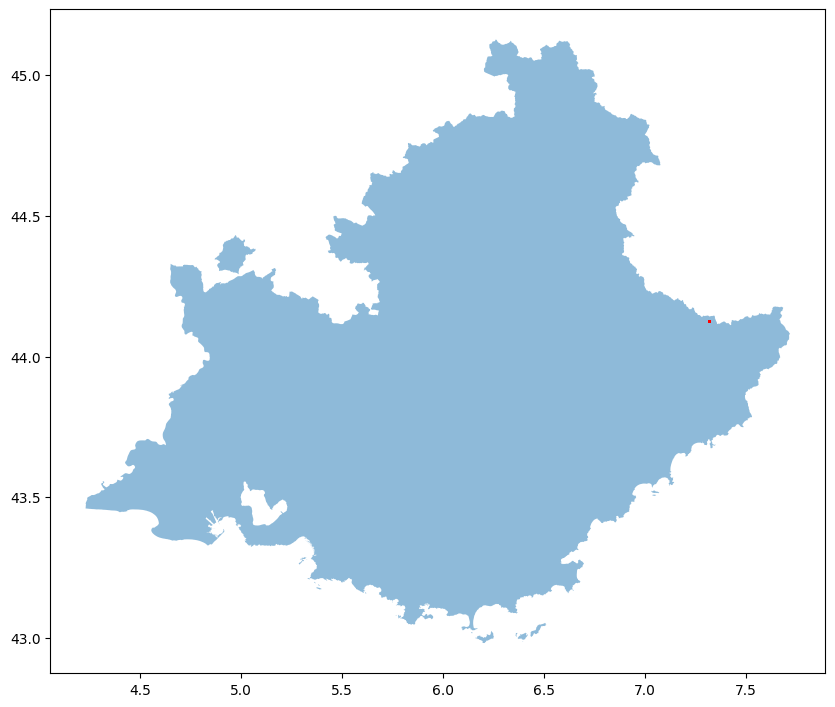

In [54]:
geometry = [Point(lon, lat) for lon, lat in zip(df['Longitude'], df['Latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Système de coordonnées géographiques (WGS 84)
gdf.crs = "EPSG:4326"
gdf = gdf.to_crs(epsg=4326)

# Charger le fond de carte
gdfa = gpd.read_file(r"Cartes\region-provence-alpes-cote-d-azur.geojson").to_crs(epsg=4326)

# Affichage
fig, ax = plt.subplots(figsize=(10, 10))
gdfa.plot(ax=ax, alpha=0.5)
gdf.plot(ax=ax, markersize=1, color='red', alpha=1)
plt.show()


=== Analyse du capteur 10230300 ===



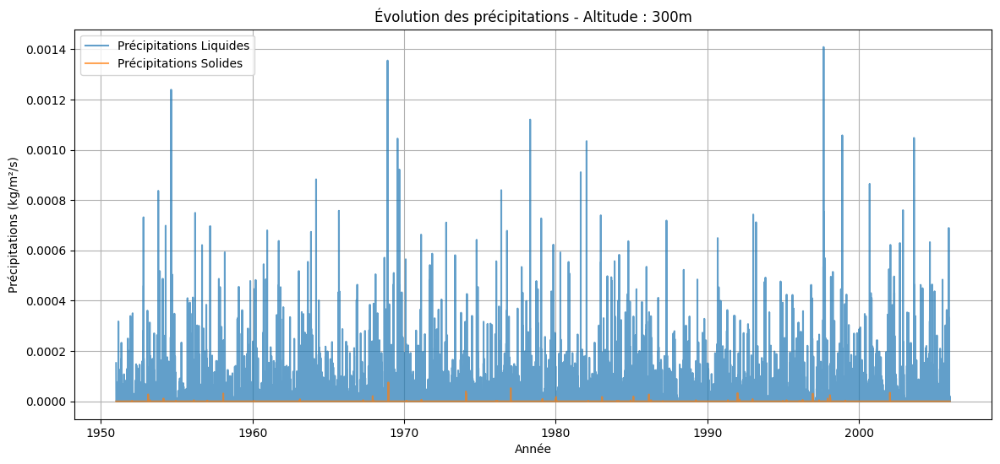




=== Analyse du capteur 10230600 ===



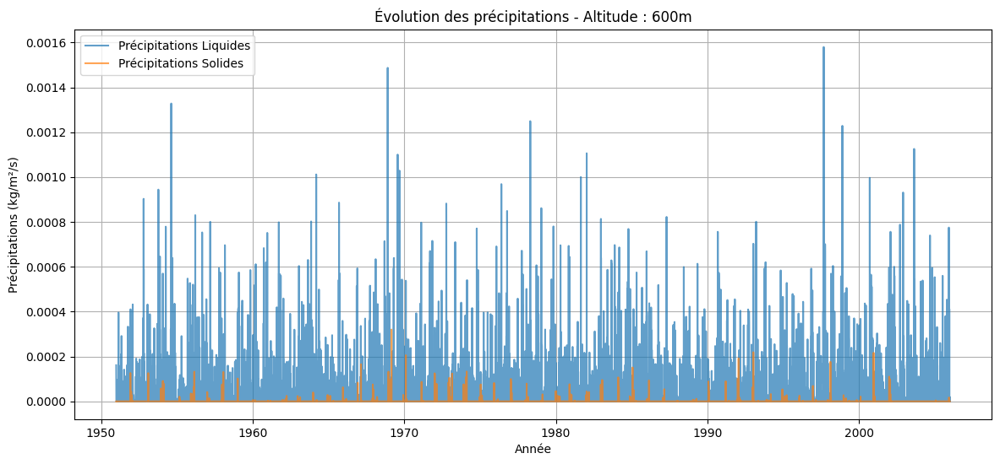




=== Analyse du capteur 10230900 ===



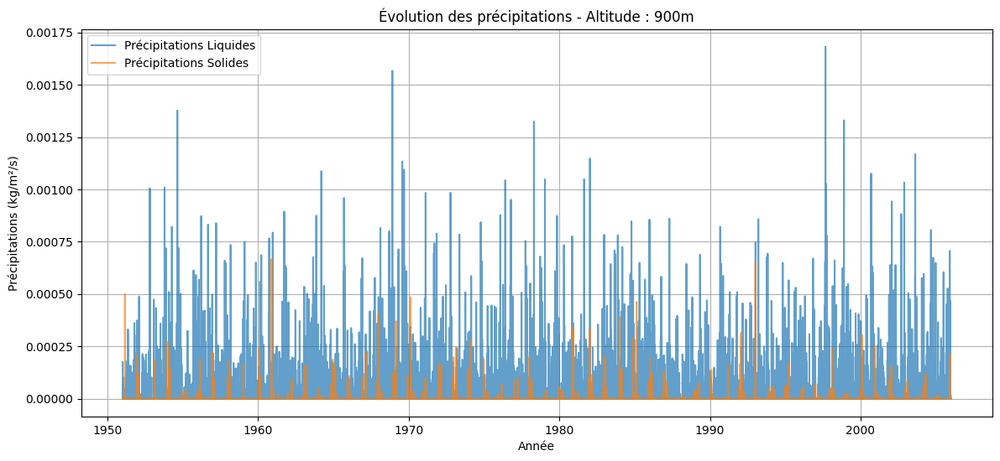




=== Analyse du capteur 10231200 ===



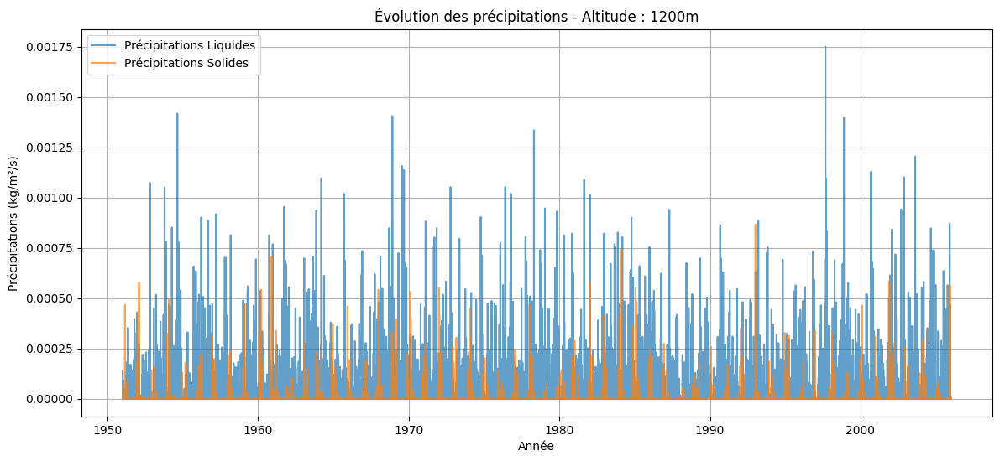




=== Analyse du capteur 10231500 ===



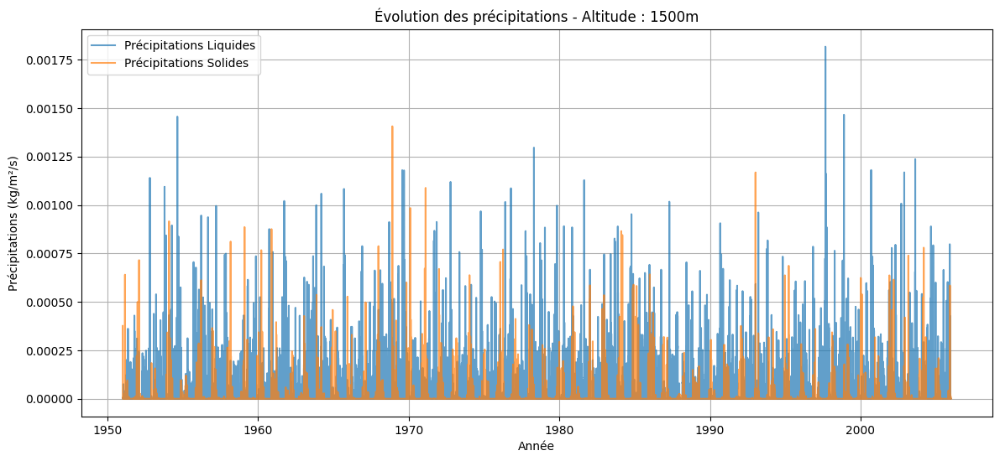




=== Analyse du capteur 10231800 ===



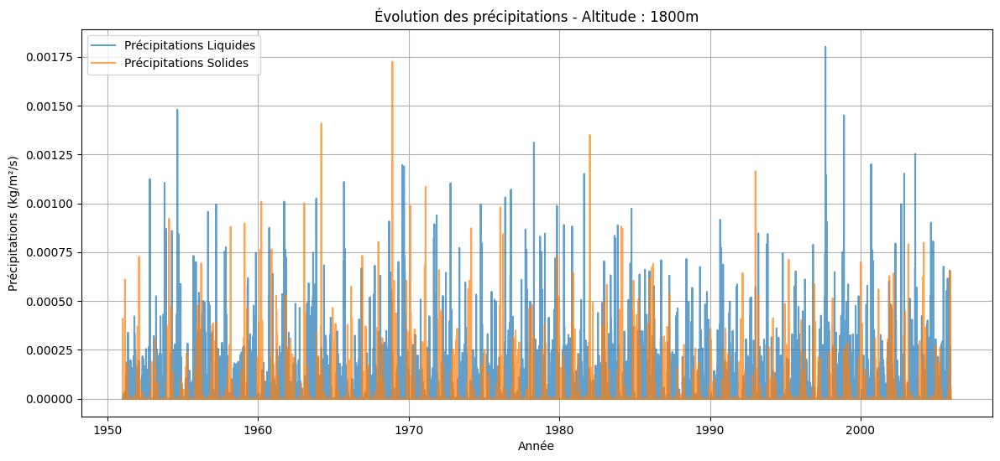




=== Analyse du capteur 10232100 ===



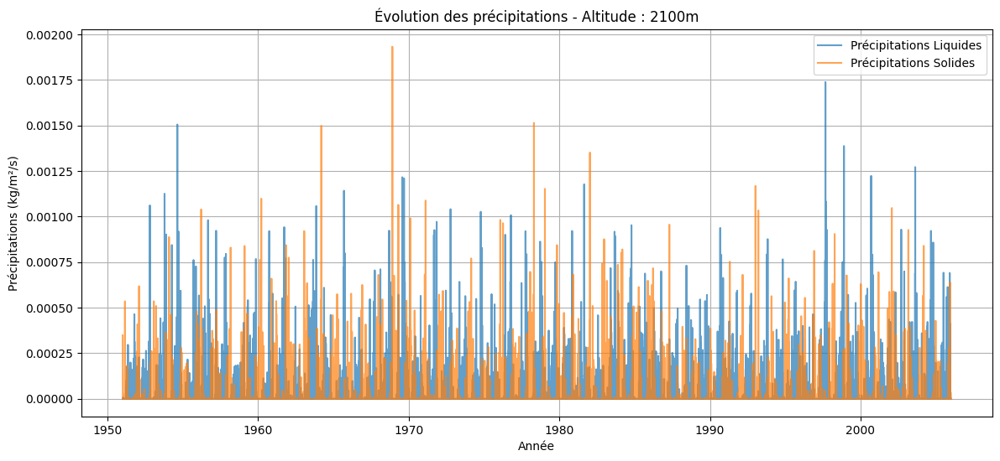




=== Analyse du capteur 10232400 ===



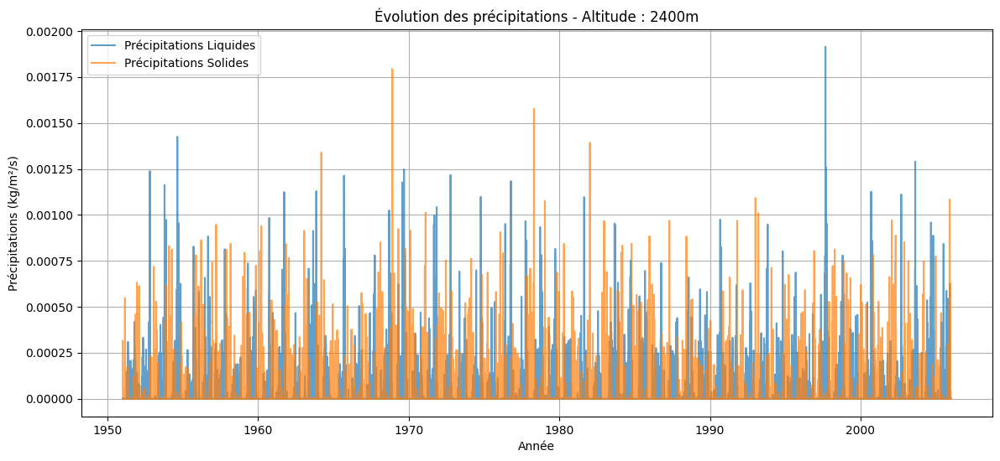




=== Analyse du capteur 10232700 ===



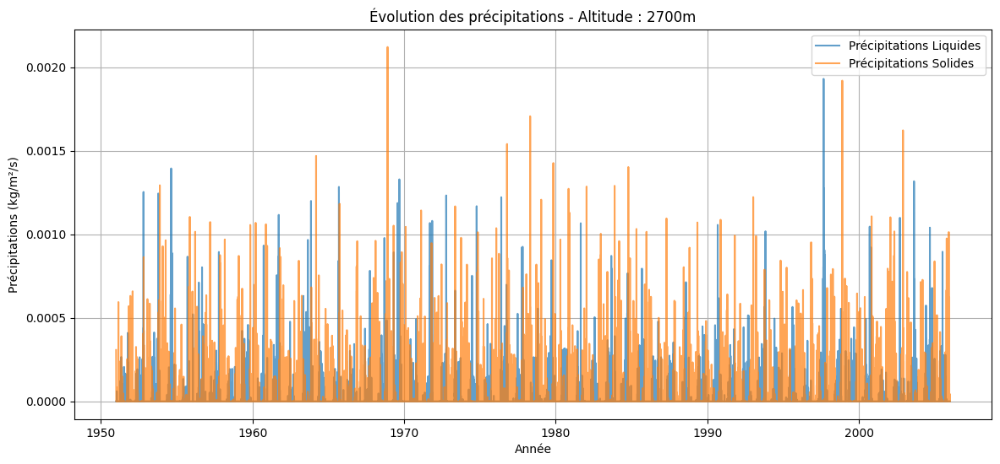




=== Analyse du capteur 10233000 ===



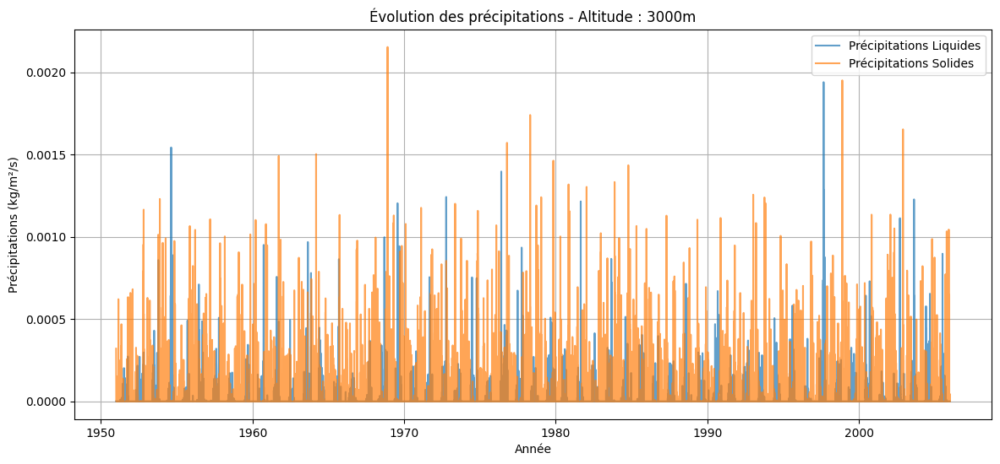




=== Analyse du capteur 10233300 ===



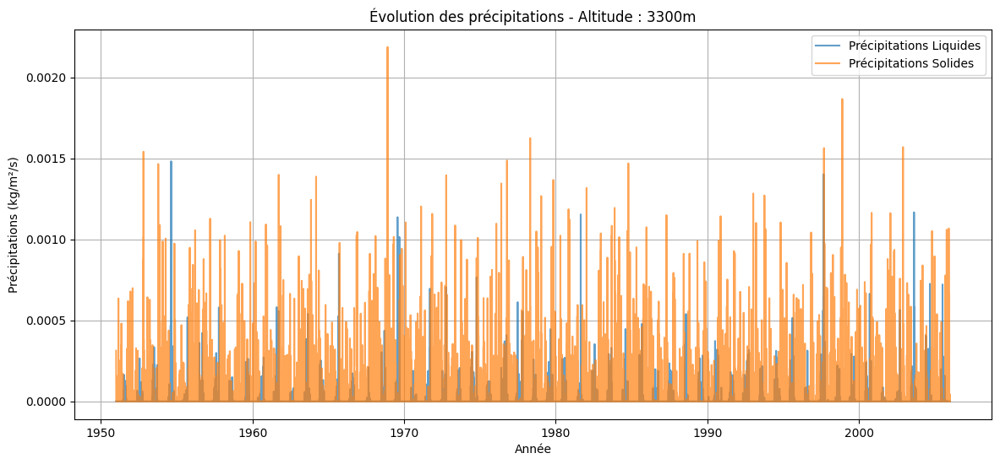

In [55]:
# Analyser chaque capteur individuellement
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")
    
    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by="Date")

    # Vérifier que le capteur a des données avant d'afficher la courbe
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Visualisation des précipitations au fil du temps
    plt.figure(figsize=(14, 6))
    plt.plot(df_capteur["Date"], df_capteur["prtotAdjust"], label="Précipitations Liquides", alpha=0.7)
    plt.plot(df_capteur["Date"], df_capteur["prsnAdjust"], label="Précipitations Solides", alpha=0.7)
    plt.xlabel("Année")
    plt.ylabel("Précipitations (kg/m²/s)")
    plt.title(f"Évolution des précipitations - Altitude : {int(str(capteur)[-4:])}m")
    plt.legend()
    plt.grid()
    plt.show()

    print("\n" + "=" * 40 + "\n")

## Calcul de l'ACF (Autocorrelation Function)

### Précipitations liquides


=== Analyse du capteur 10230300 ===



C:\Users\alexv\AppData\Local\Temp\ipykernel_29180\1151224943.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


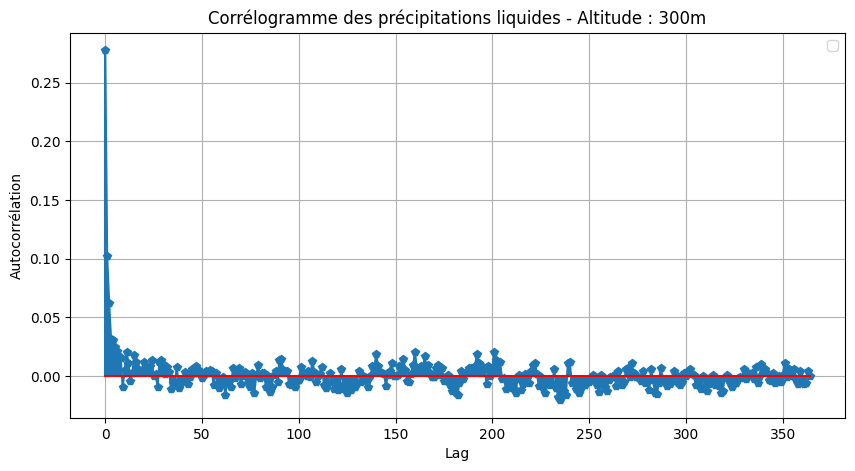




=== Analyse du capteur 10230600 ===



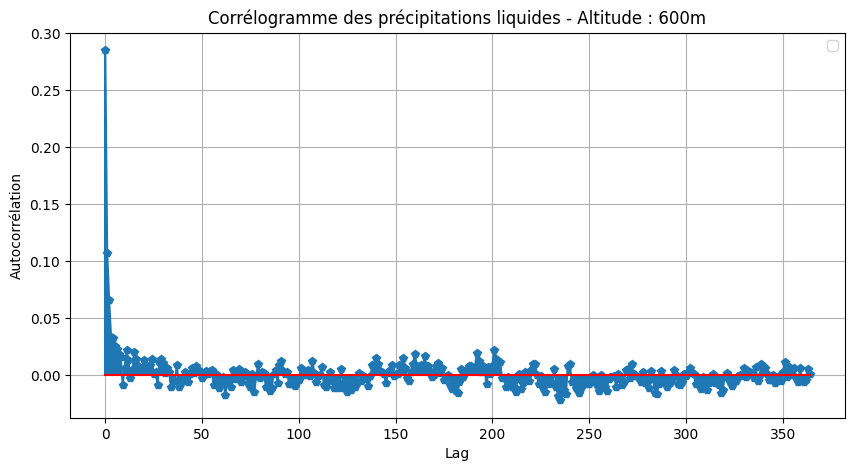




=== Analyse du capteur 10230900 ===



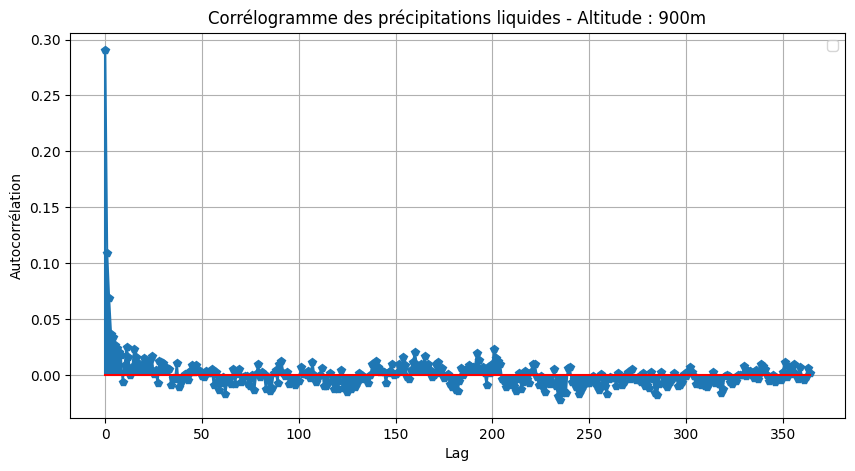




=== Analyse du capteur 10231200 ===



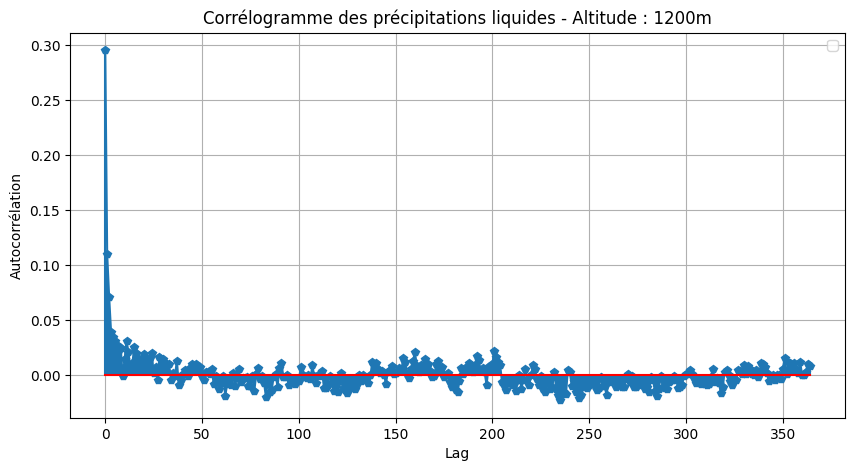




=== Analyse du capteur 10231500 ===



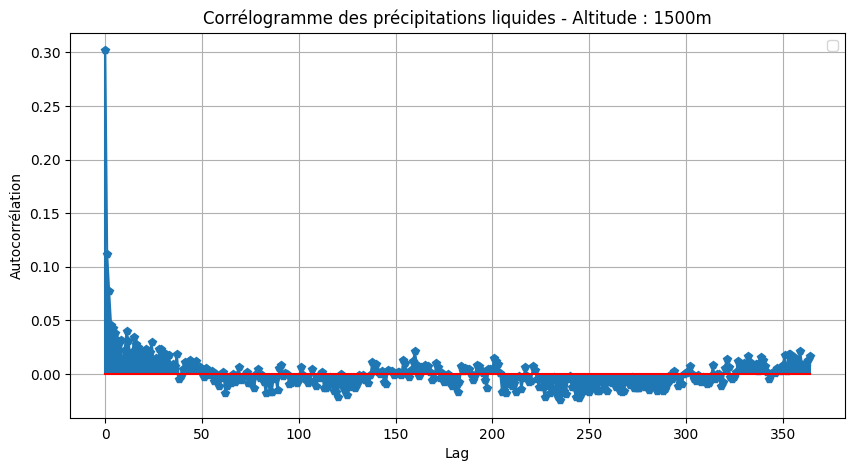




=== Analyse du capteur 10231800 ===



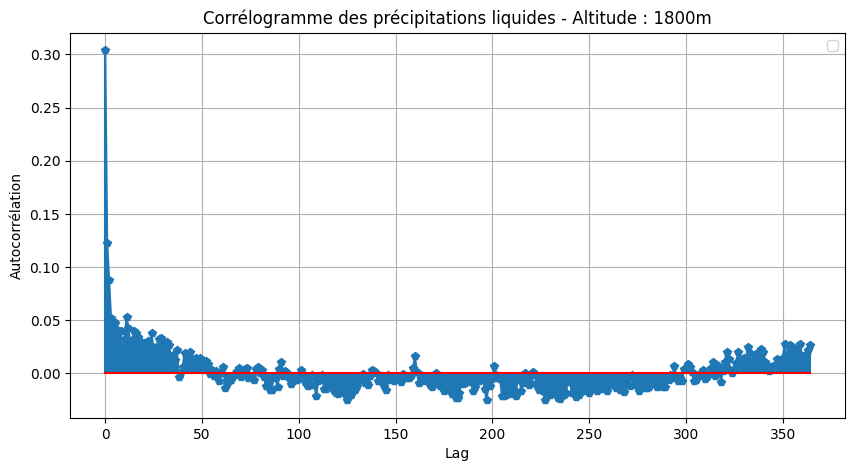




=== Analyse du capteur 10232100 ===



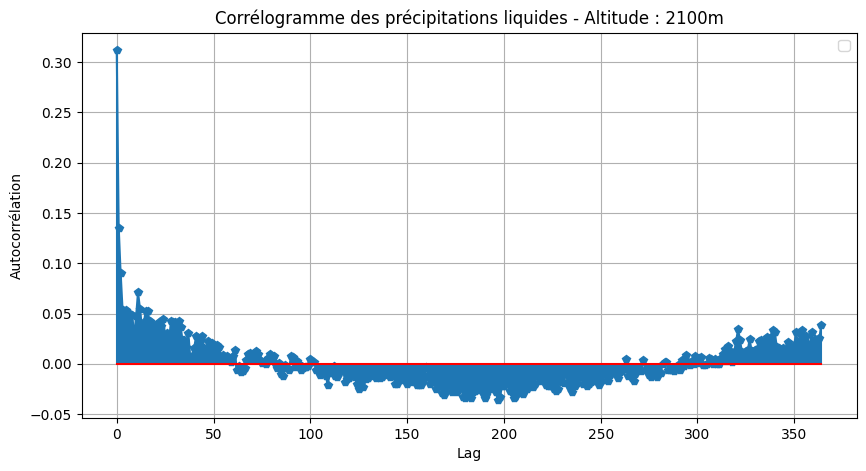




=== Analyse du capteur 10232400 ===



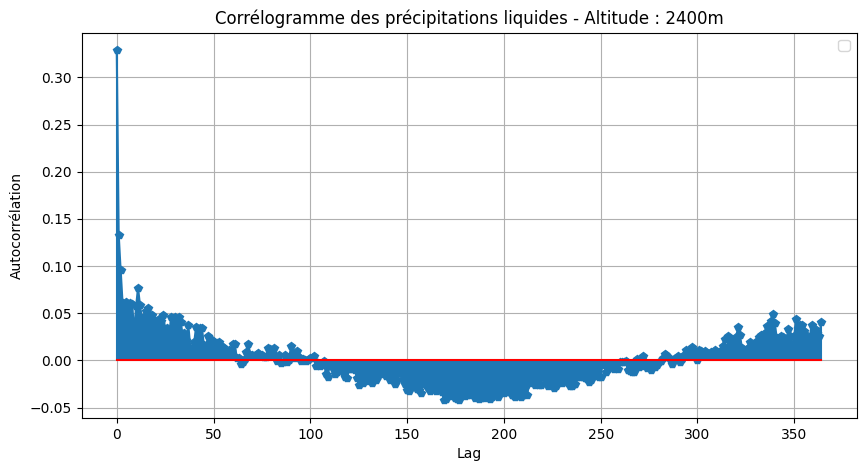




=== Analyse du capteur 10232700 ===



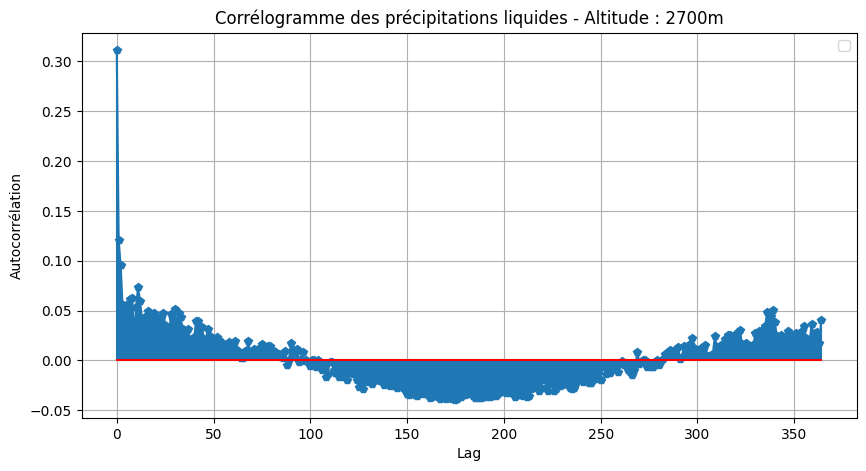




=== Analyse du capteur 10233000 ===



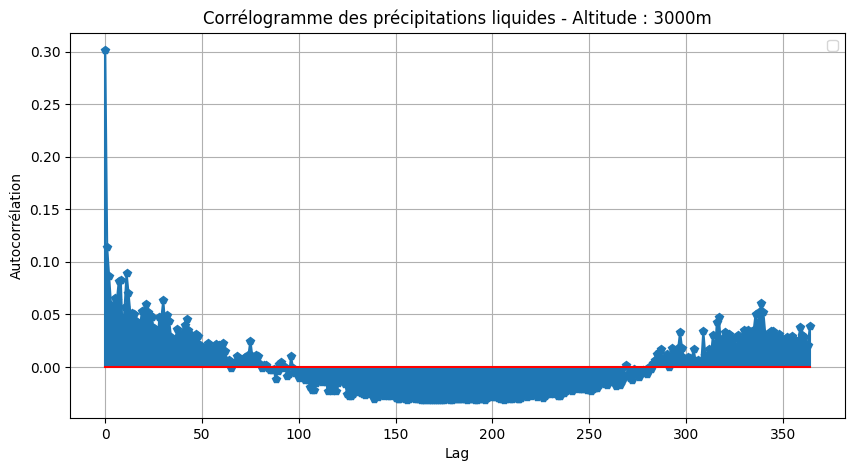




=== Analyse du capteur 10233300 ===



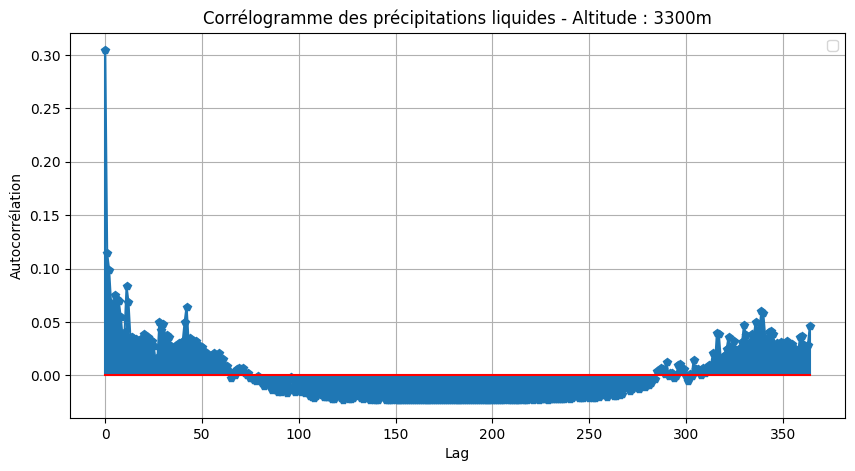

In [56]:
lags = 365

for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")
    
    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by="Date")

    # Vérifier que le capteur a des données avant d'afficher la courbe
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Calcul de l'autocorrélation à chaque altitude
    acf_values = acf(df_capteur["prtotAdjust"].dropna(), nlags=lags)

    # Visualisation des autocorrélations suivant les altitudes
    plt.figure(figsize=(10, 5))
    plt.stem(range(lags), acf_values[1:], markerfmt="p-", linefmt="p-", basefmt="r-")
    plt.xlabel("Lag")
    plt.ylabel("Autocorrélation")
    plt.title(f"Corrélogramme des précipitations liquides - Altitude : {int(str(capteur)[-4:])}m")
    plt.legend()
    plt.grid()
    plt.show()

    print("\n" + "=" * 40 + "\n")

### Précipitations solides


=== Analyse du capteur 10230300 ===



C:\Users\alexv\AppData\Local\Temp\ipykernel_29180\4178477882.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


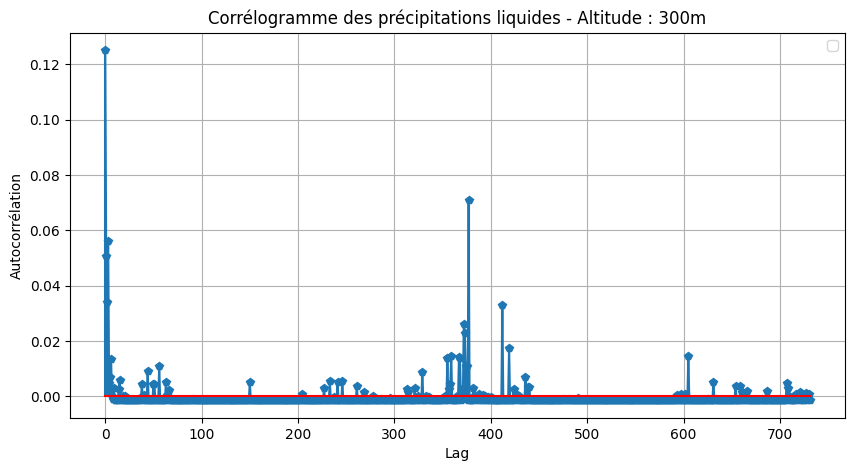




=== Analyse du capteur 10230600 ===



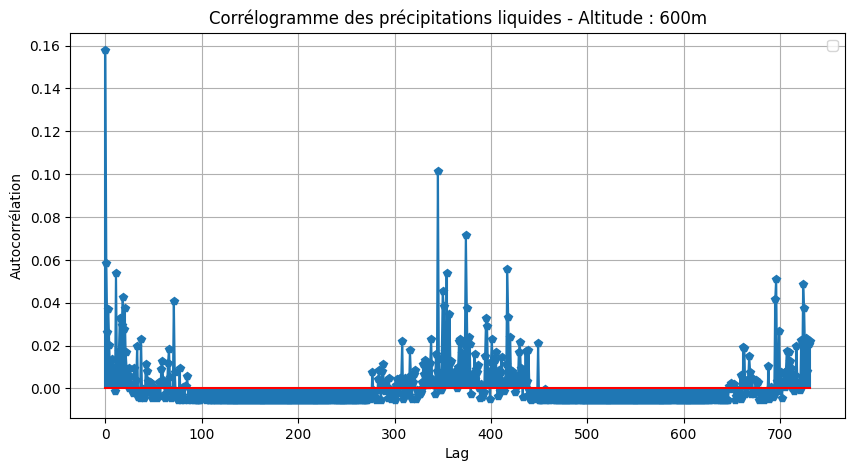




=== Analyse du capteur 10230900 ===



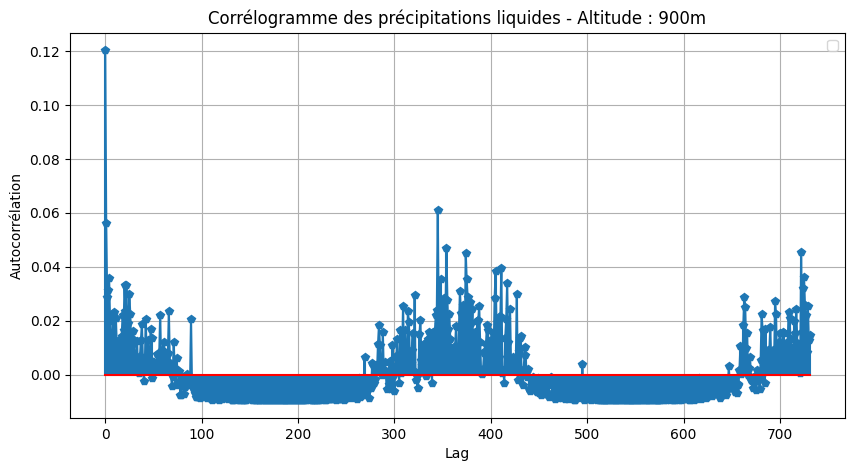




=== Analyse du capteur 10231200 ===



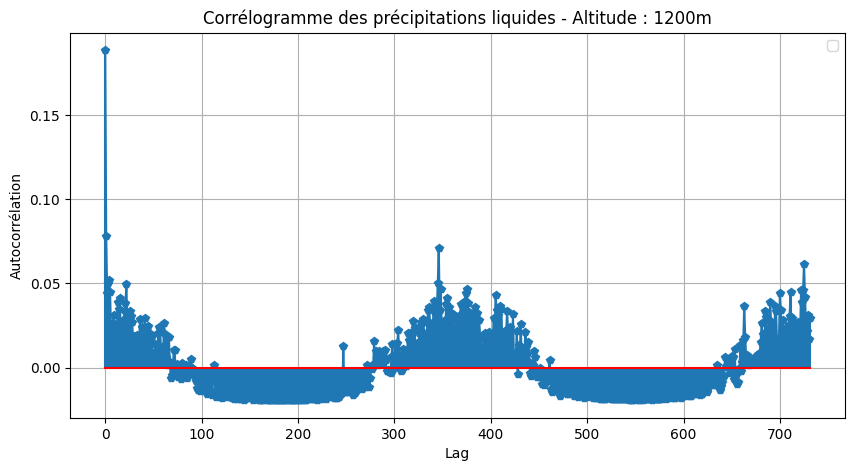




=== Analyse du capteur 10231500 ===



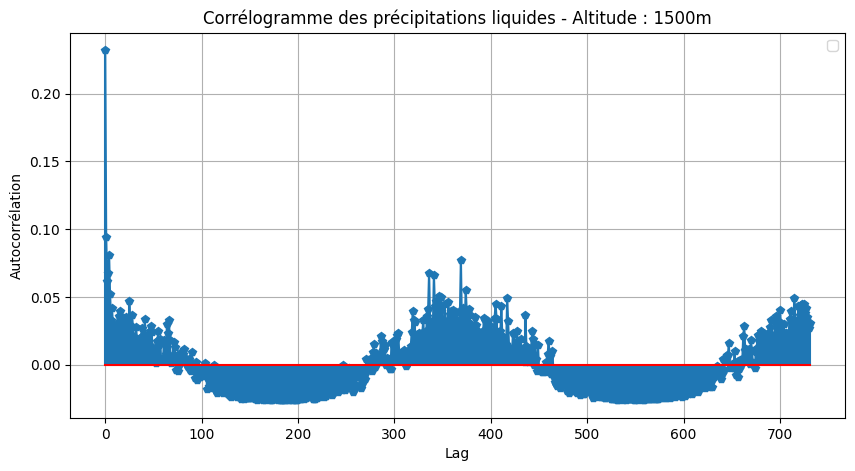




=== Analyse du capteur 10231800 ===



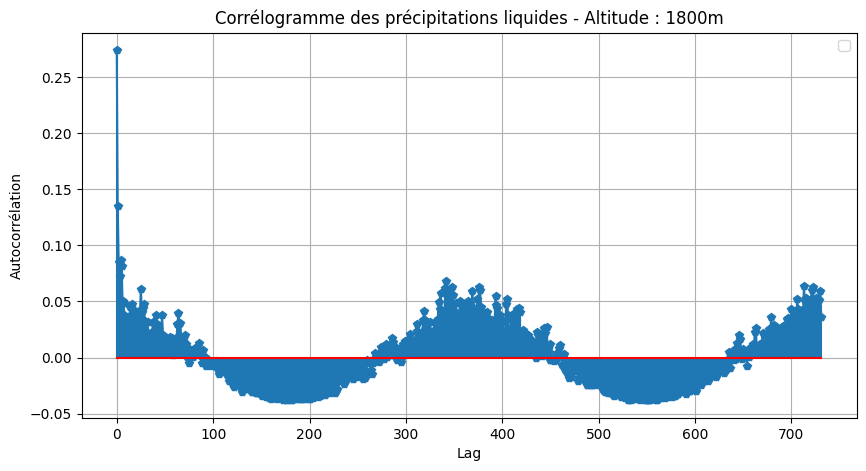




=== Analyse du capteur 10232100 ===



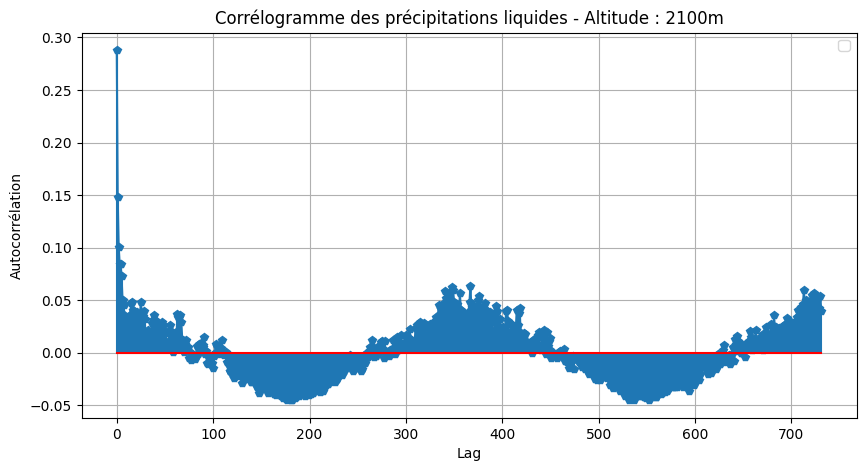




=== Analyse du capteur 10232400 ===



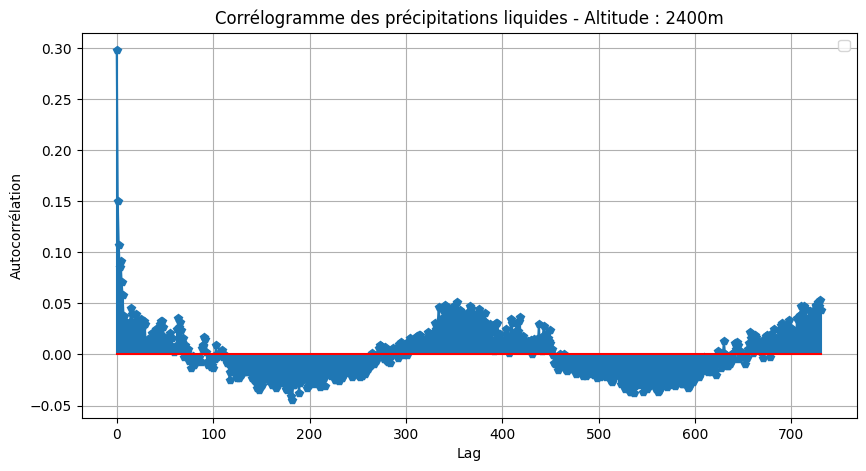




=== Analyse du capteur 10232700 ===



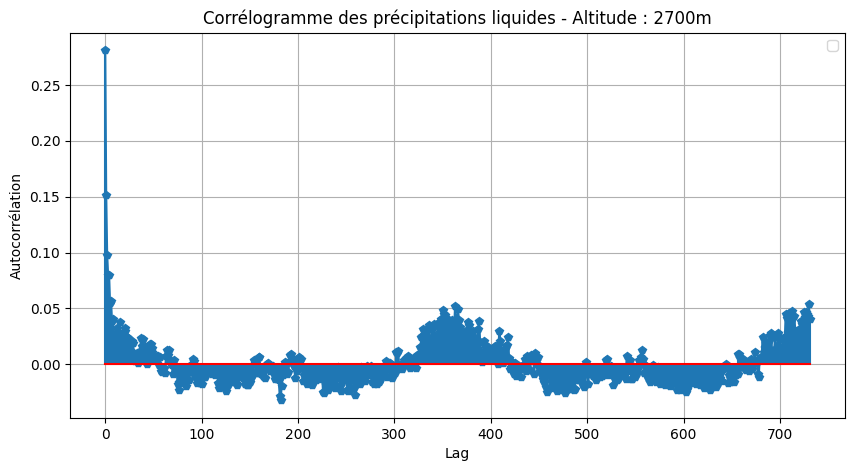




=== Analyse du capteur 10233000 ===



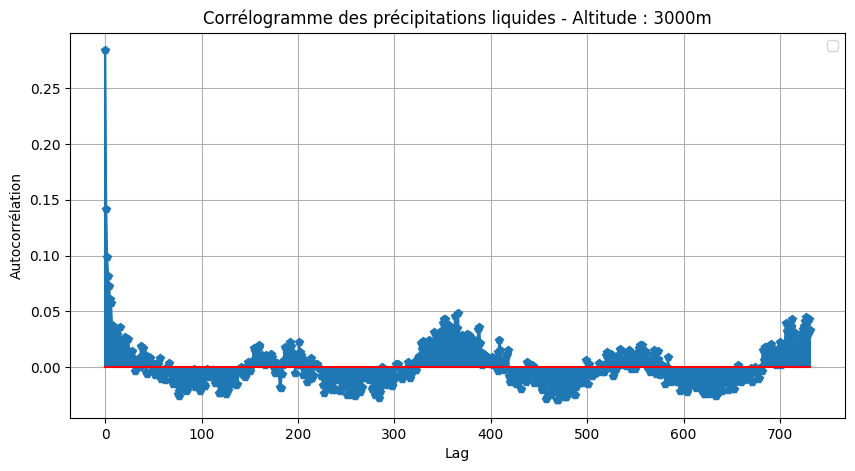




=== Analyse du capteur 10233300 ===



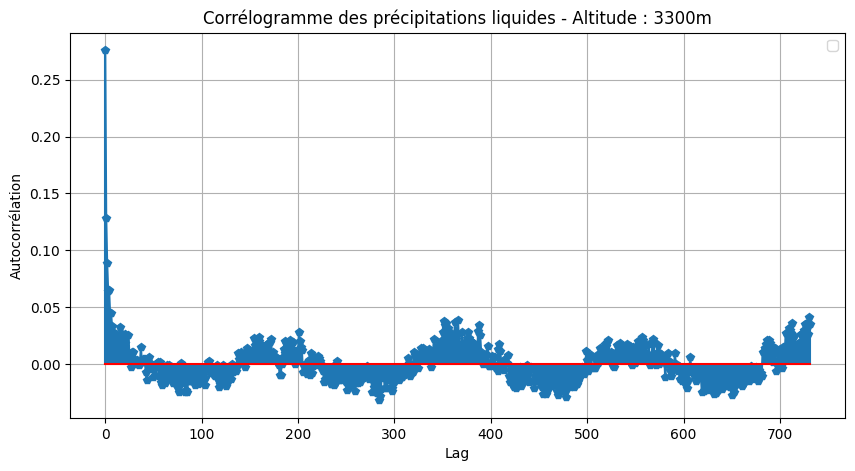

In [57]:
lags = 732 

for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")
    
    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by="Date")

    # Vérifier que le capteur a des données avant d'afficher la courbe
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Calcul de l'autocorrélation à chaque altitude
    acf_values = acf(df_capteur["prsnAdjust"].dropna(), nlags=lags)

    # Visualisation des autocorrélations suivant les altitudes
    plt.figure(figsize=(10, 5))
    plt.stem(range(lags), acf_values[1:], markerfmt="p-", linefmt="p-", basefmt="r-")
    plt.xlabel("Lag")
    plt.ylabel("Autocorrélation")
    plt.title(f"Corrélogramme des précipitations liquides - Altitude : {int(str(capteur)[-4:])}m")
    plt.legend()
    plt.grid()
    plt.show()

    print("\n" + "=" * 40 + "\n")

## Représenter la distribution des précipitations

## Etudier les tendances pluviométriques

### Pluviométrie journalière au cours des années et par capteur (altitude)


=== Analyse du capteur 10230300 ===



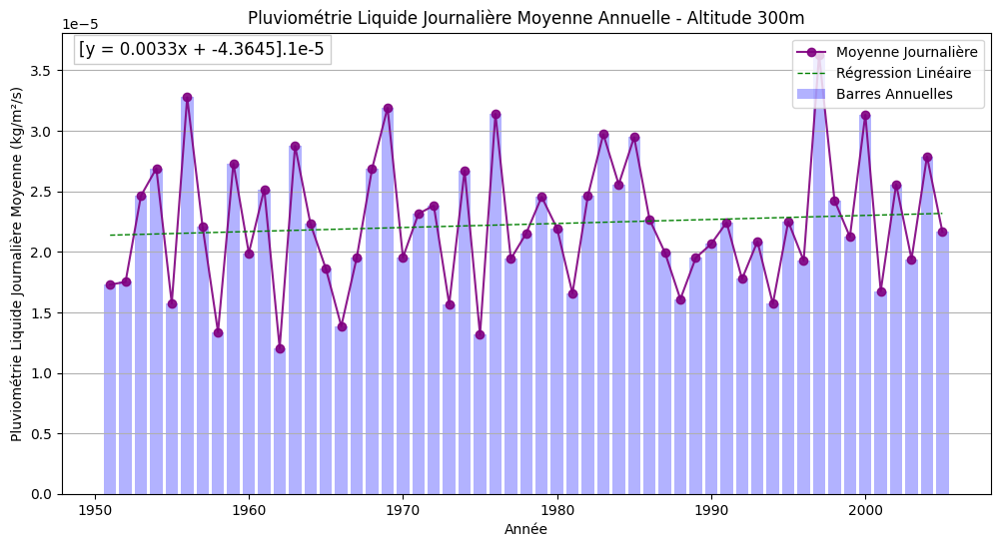


 Variation de pluviométrie liquide = 8.4189%



=== Analyse du capteur 10230600 ===



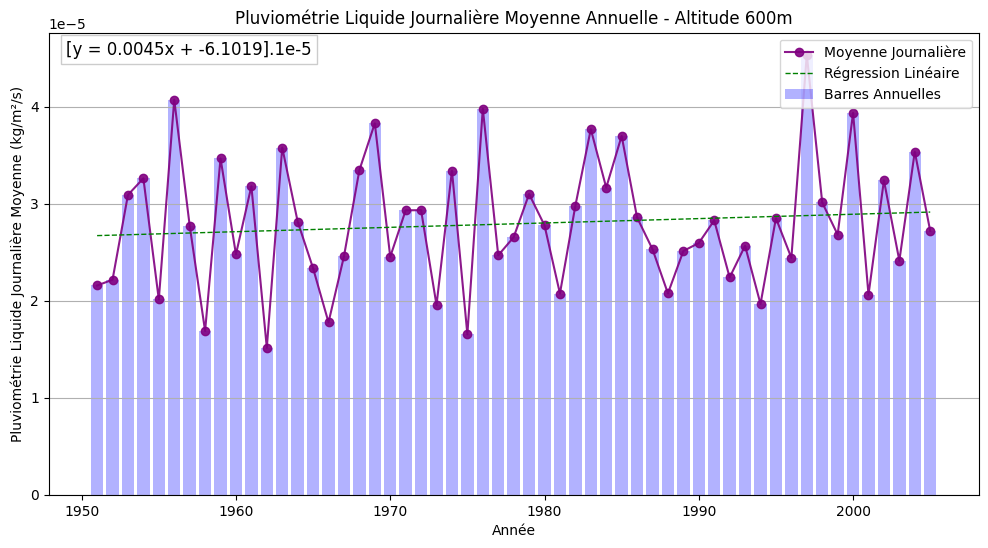


 Variation de pluviométrie liquide = 9.0883%



=== Analyse du capteur 10230900 ===



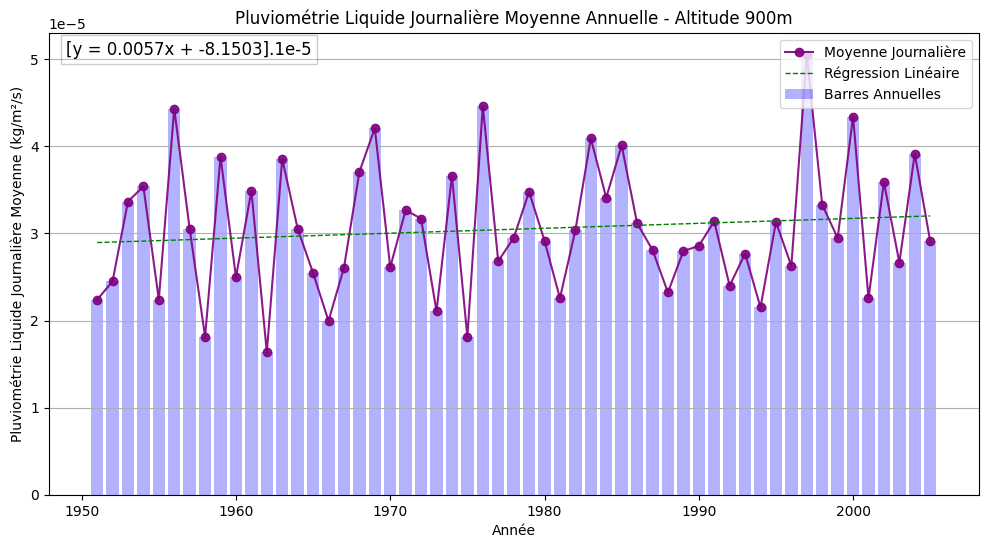


 Variation de pluviométrie liquide = 10.5596%



=== Analyse du capteur 10231200 ===



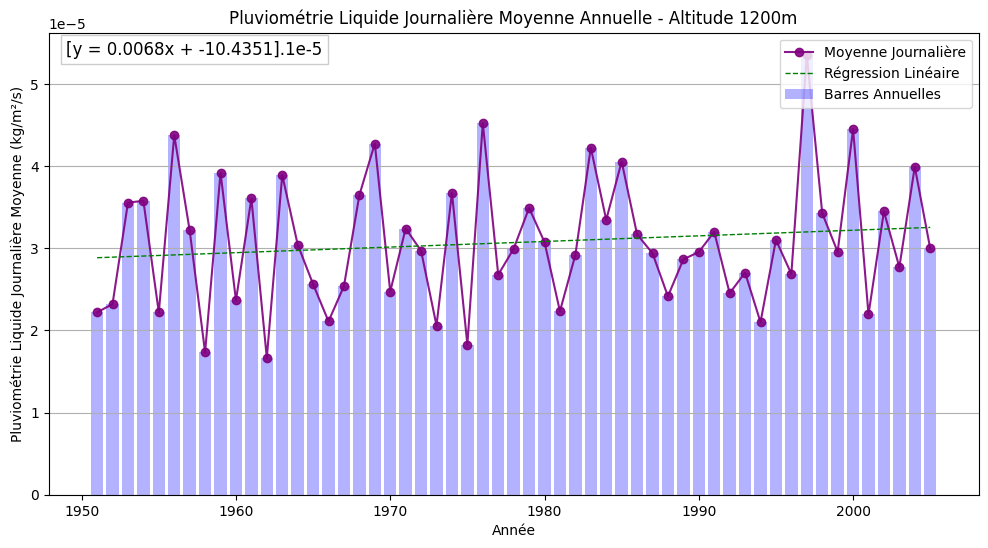


 Variation de pluviométrie liquide = 12.7791%



=== Analyse du capteur 10231500 ===



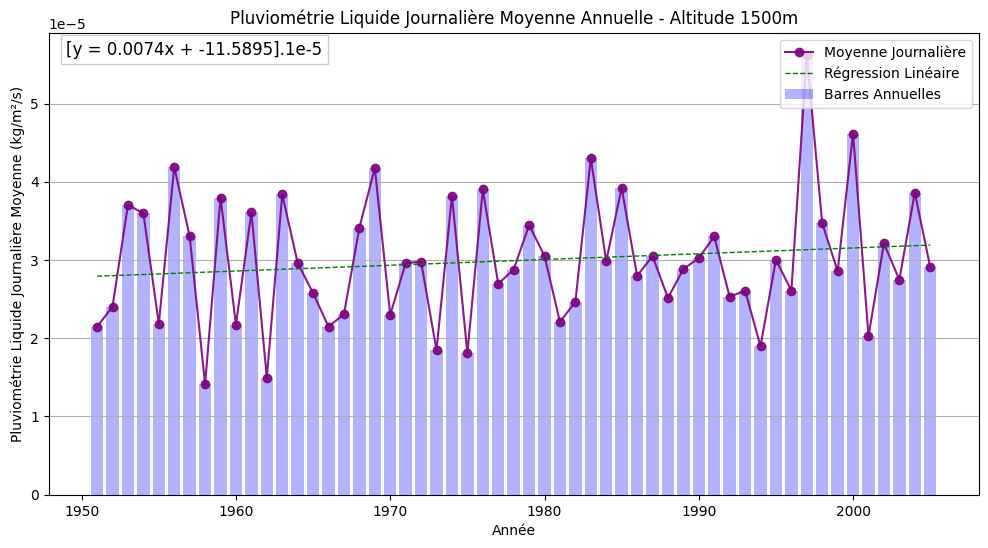


 Variation de pluviométrie liquide = 14.2524%



=== Analyse du capteur 10231800 ===



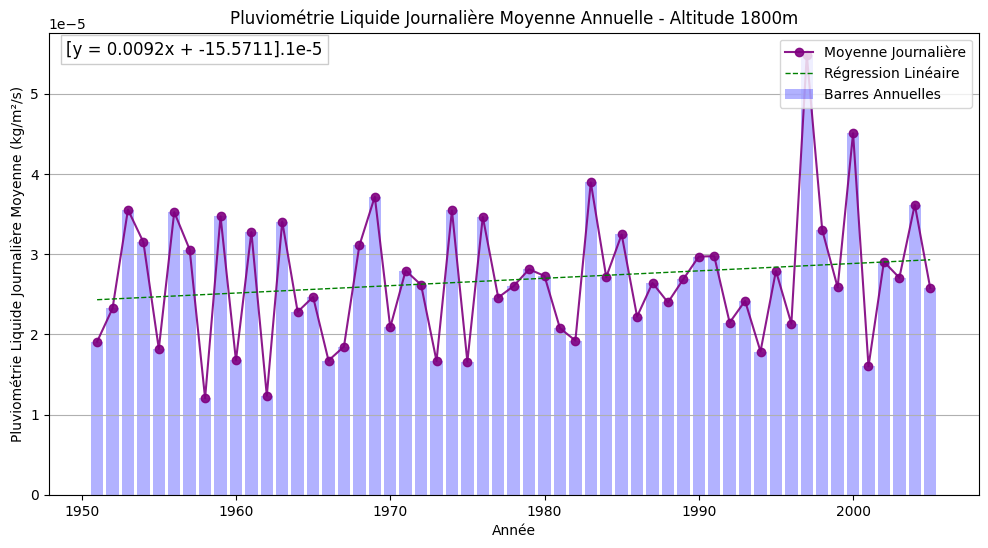


 Variation de pluviométrie liquide = 20.4911%



=== Analyse du capteur 10232100 ===



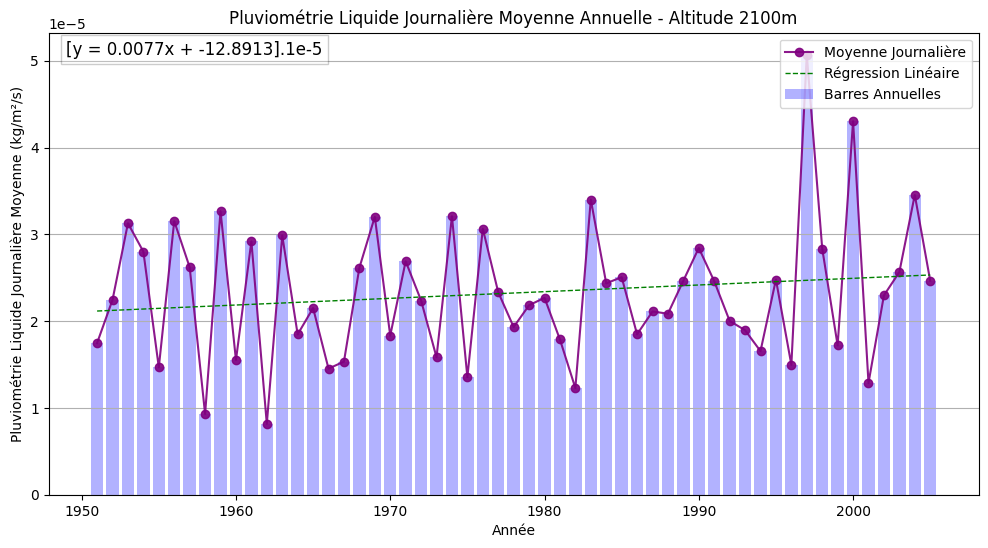


 Variation de pluviométrie liquide = 19.6285%



=== Analyse du capteur 10232400 ===



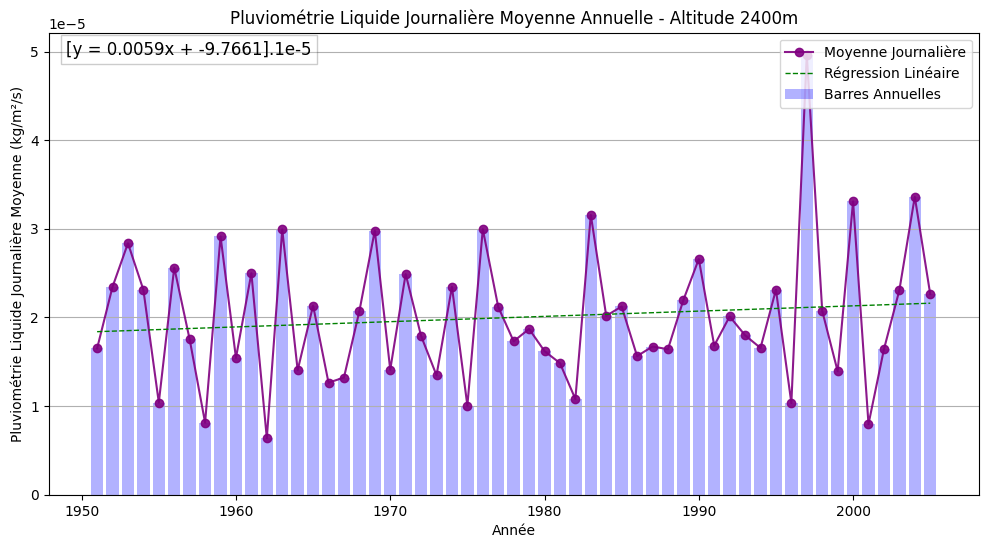


 Variation de pluviométrie liquide = 17.4584%



=== Analyse du capteur 10232700 ===



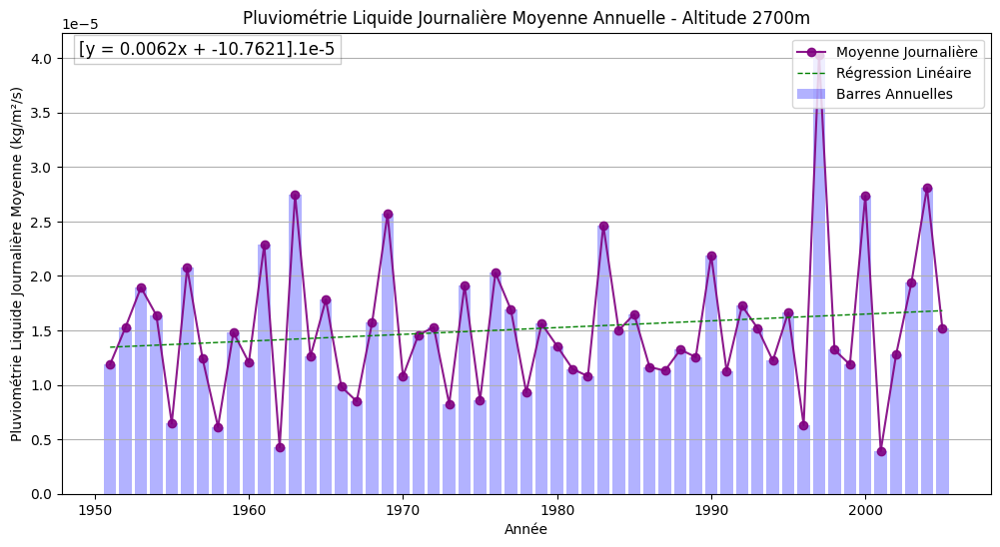


 Variation de pluviométrie liquide = 24.8965%



=== Analyse du capteur 10233000 ===



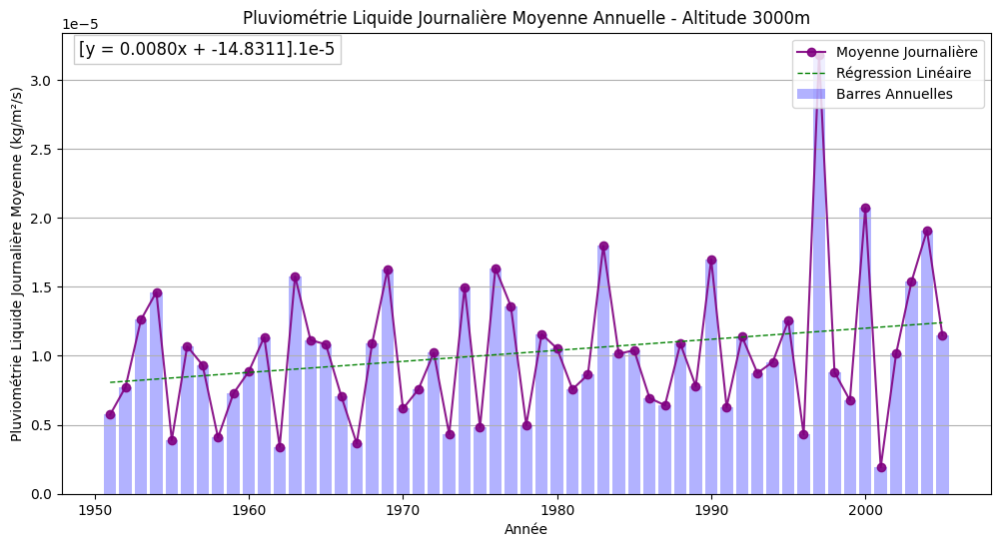


 Variation de pluviométrie liquide = 53.614%



=== Analyse du capteur 10233300 ===



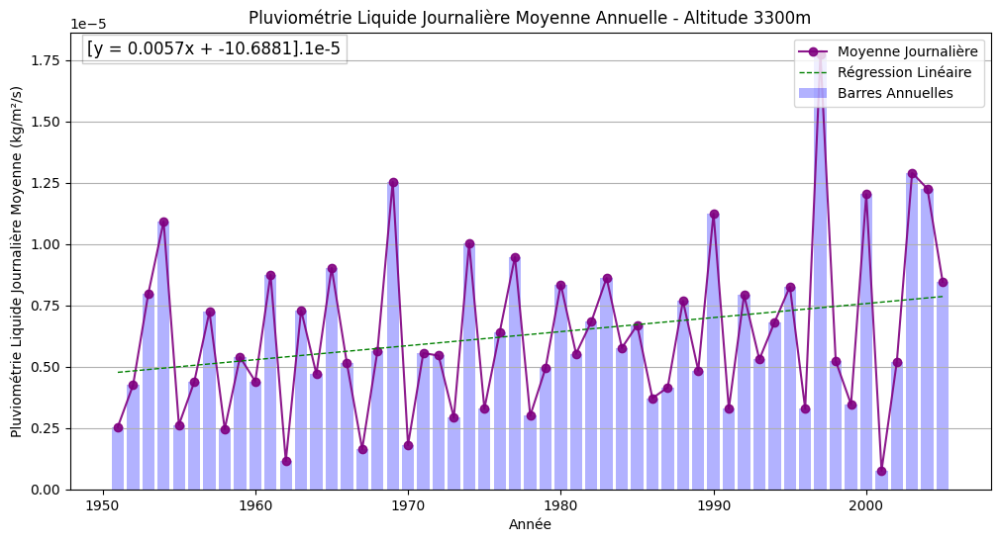


 Variation de pluviométrie liquide = 64.8173%




In [58]:
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].copy()

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    # Ajouter une colonne "Year"
    df_capteur["Year"] = df_capteur["Date"].dt.year

    # Calcul des précipitations journalières moyennes par année
    annual_daily_precip = df_capteur.groupby("Year")["prtotAdjust"].mean()

    # Régression linéaire : Ajustement d'une droite
    x = annual_daily_precip.index.values  # Années
    y = annual_daily_precip.values  # Pluviométrie moyenne journalière
    coeffs = np.polyfit(x, y, deg=1)  # Ajustement linéaire (degré 1)
    trend_line = np.polyval(coeffs, x)  # Valeurs prédites

    # Affichage du graphique
    plt.figure(figsize=(12, 6))
    plt.plot(x, y, color='purple', alpha=0.9, marker='o', label="Moyenne Journalière")
    plt.bar(x, y, color='blue', alpha=0.3, label="Barres Annuelles")
    plt.plot(x, trend_line, color='green', linestyle='--', linewidth=1, label="Régression Linéaire")

    # Affichage de l'équation de la droite
    equation = f"[y = {coeffs[0]*1e5:.4f}x + {coeffs[1]*1e5:.4f}].1e-5"
    plt.text(x.min()-2, y.max(), equation, fontsize=12, color="black", bbox=dict(facecolor='white', alpha=0.2))

    plt.xlabel("Année")
    plt.ylabel("Pluviométrie Liquide Journalière Moyenne (kg/m²/s)")
    plt.title(f"Pluviométrie Liquide Journalière Moyenne Annuelle - Altitude {altitude}m")
    plt.legend(loc='upper right')
    plt.grid(axis='y')

    # Affichage
    plt.show()

    print(f"\n Variation de pluviométrie liquide = {round(100*coeffs[0]*(x.max()-x.min())/(coeffs[0]*x.min()+coeffs[1]), 4)}%")

    print("\n" + "=" * 110 + "\n")

### Précipitations solides journalières par an et par capteur (altitude)


=== Analyse du capteur 10230300 ===



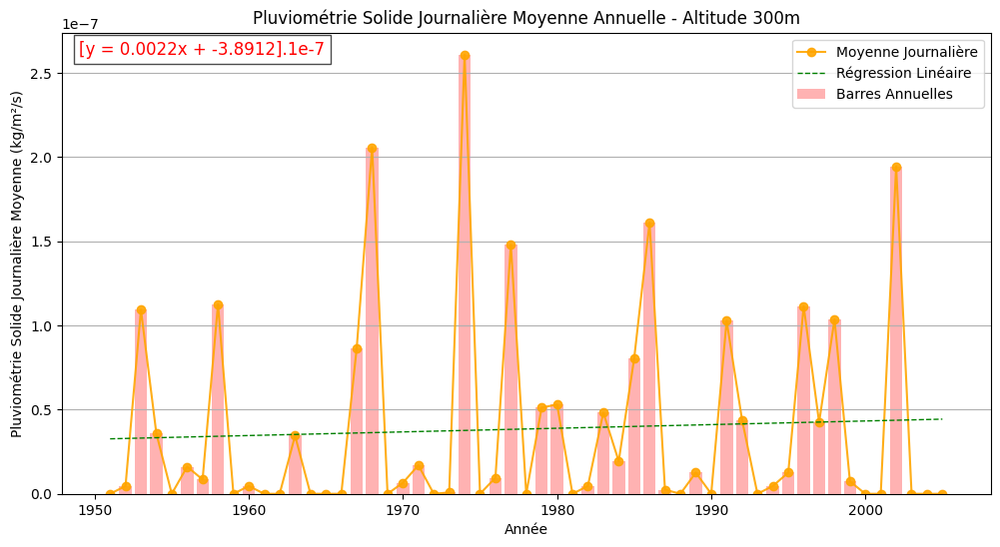


 Variation de pluviométrie solide = 35.7396%



=== Analyse du capteur 10230600 ===



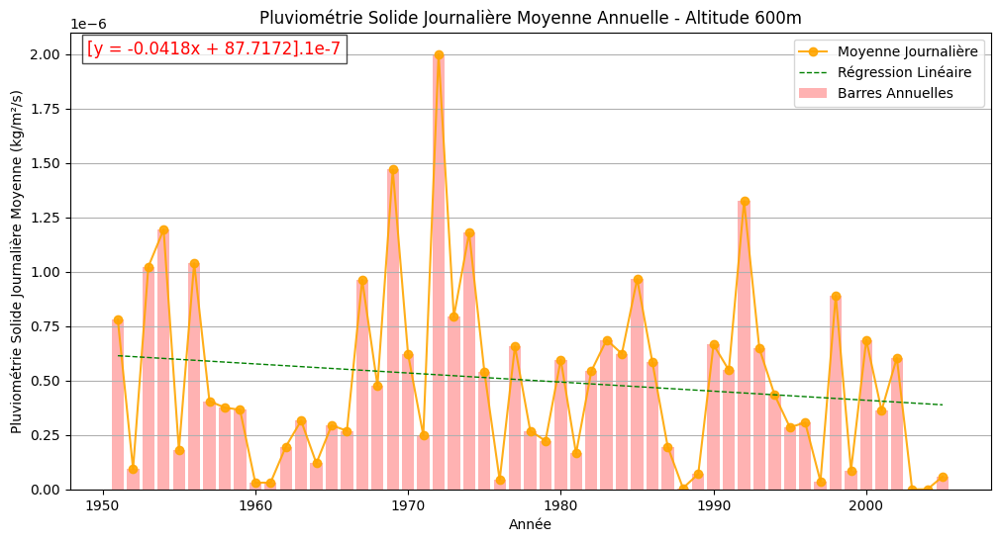


 Variation de pluviométrie solide = -36.7608%



=== Analyse du capteur 10230900 ===



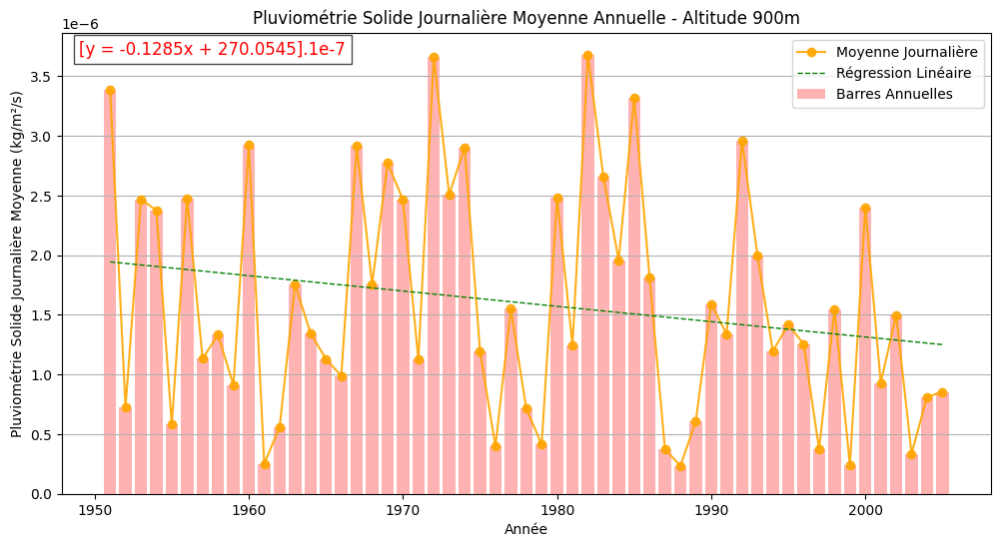


 Variation de pluviométrie solide = -35.6731%



=== Analyse du capteur 10231200 ===



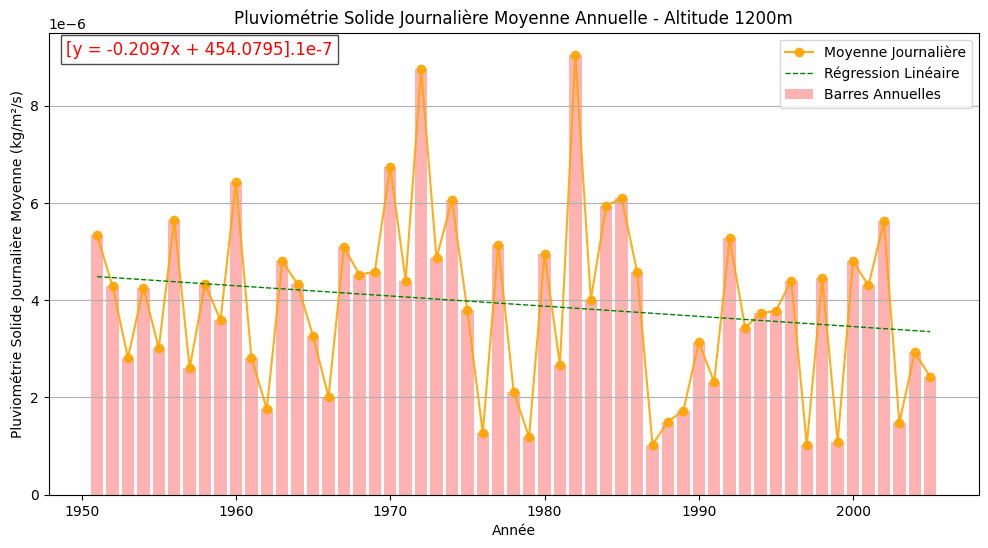


 Variation de pluviométrie solide = -25.2418%



=== Analyse du capteur 10231500 ===



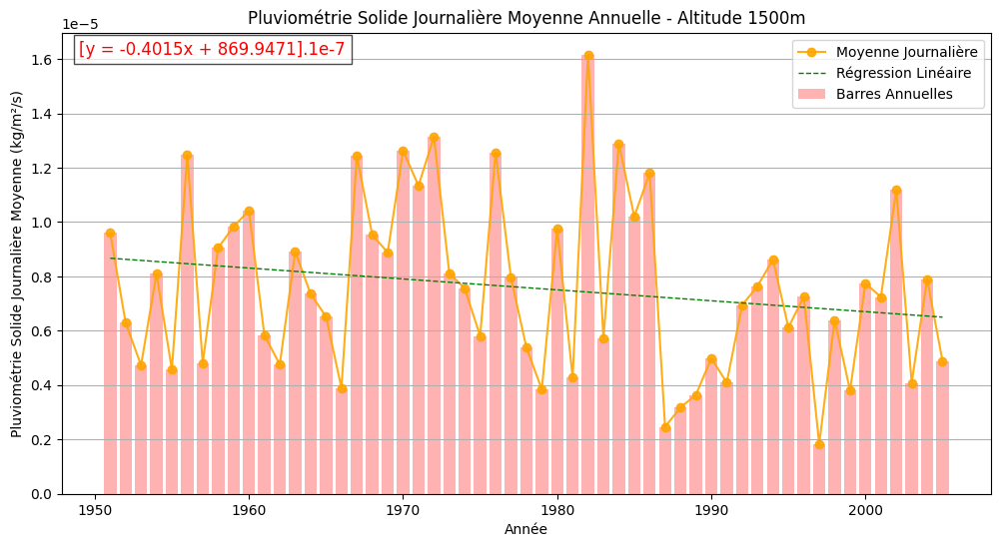


 Variation de pluviométrie solide = -25.0037%



=== Analyse du capteur 10231800 ===



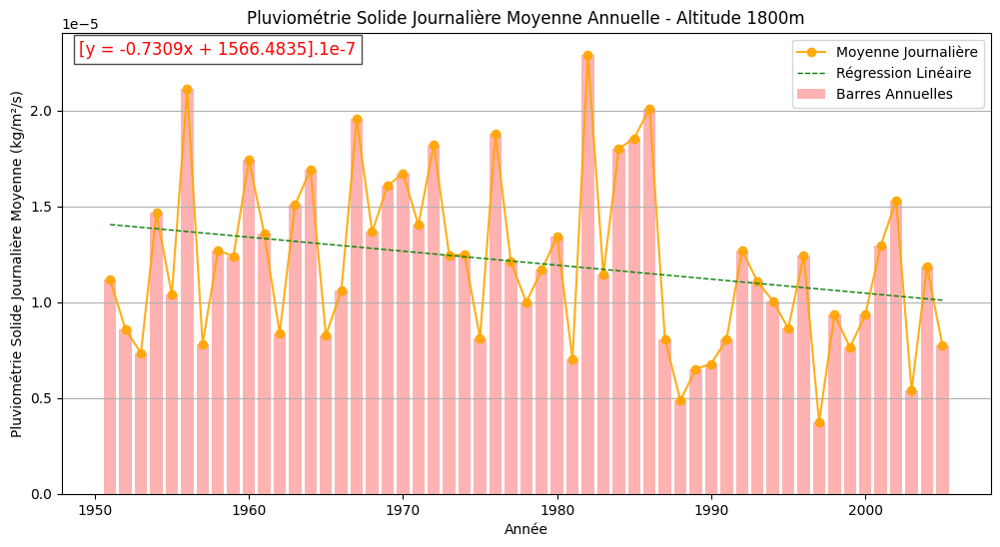


 Variation de pluviométrie solide = -28.0986%



=== Analyse du capteur 10232100 ===



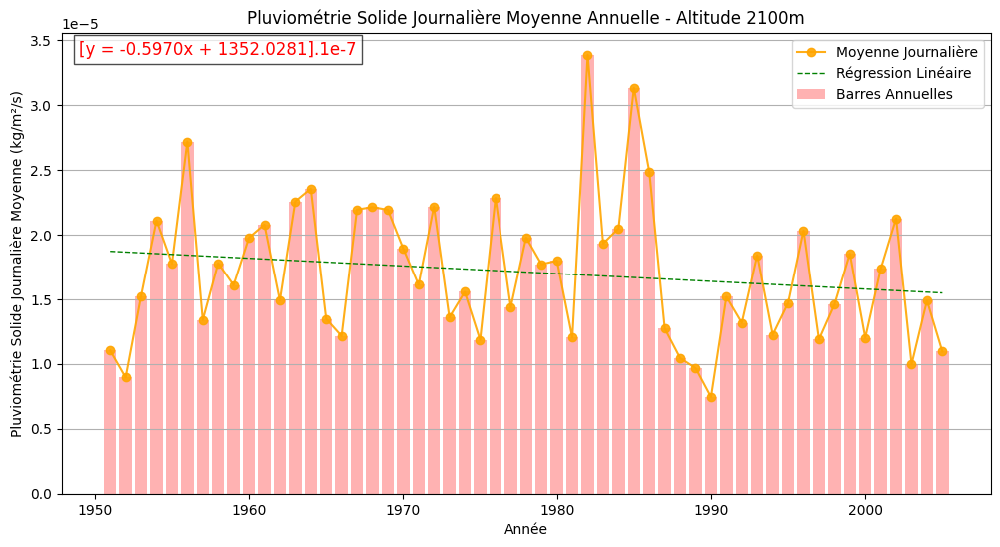


 Variation de pluviométrie solide = -17.2238%



=== Analyse du capteur 10232400 ===



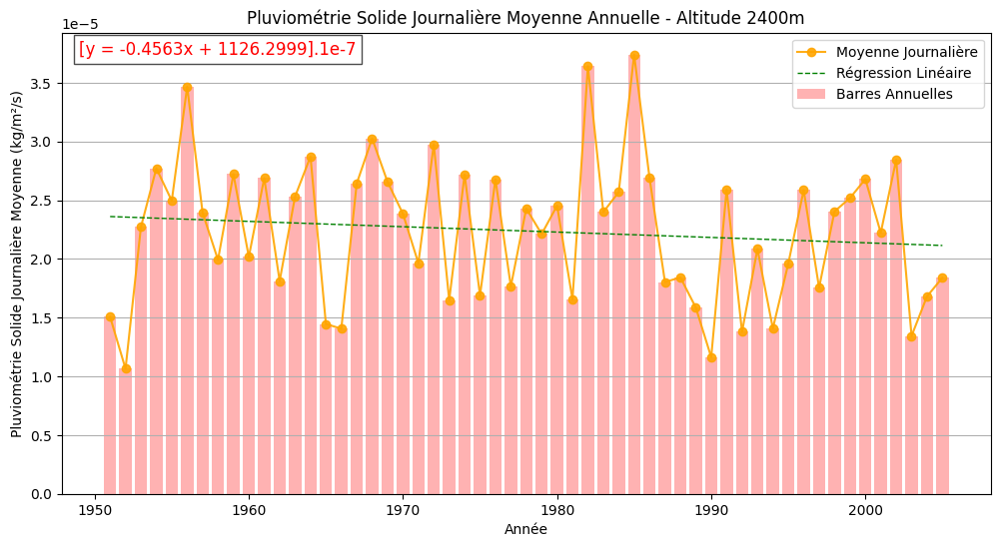


 Variation de pluviométrie solide = -10.4327%



=== Analyse du capteur 10232700 ===



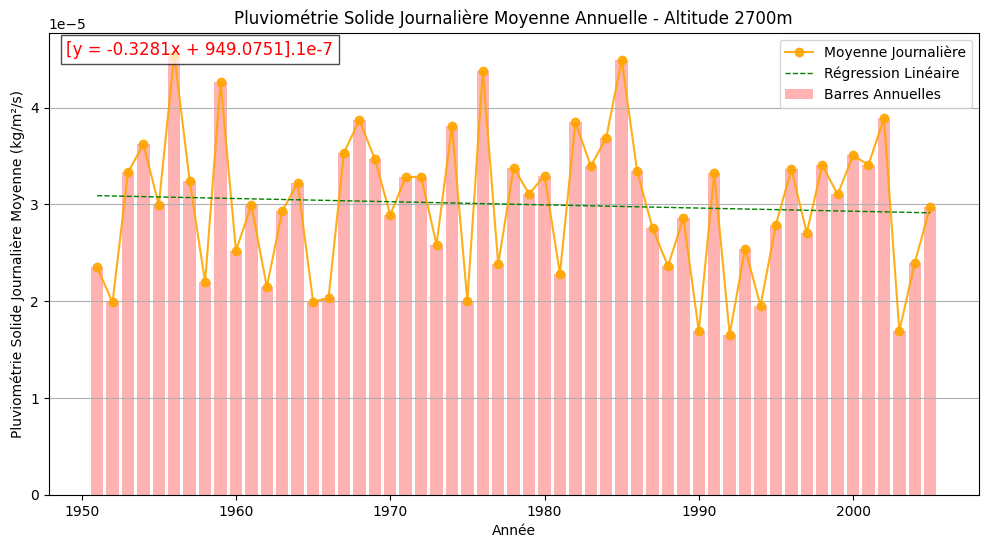


 Variation de pluviométrie solide = -5.7331%



=== Analyse du capteur 10233000 ===



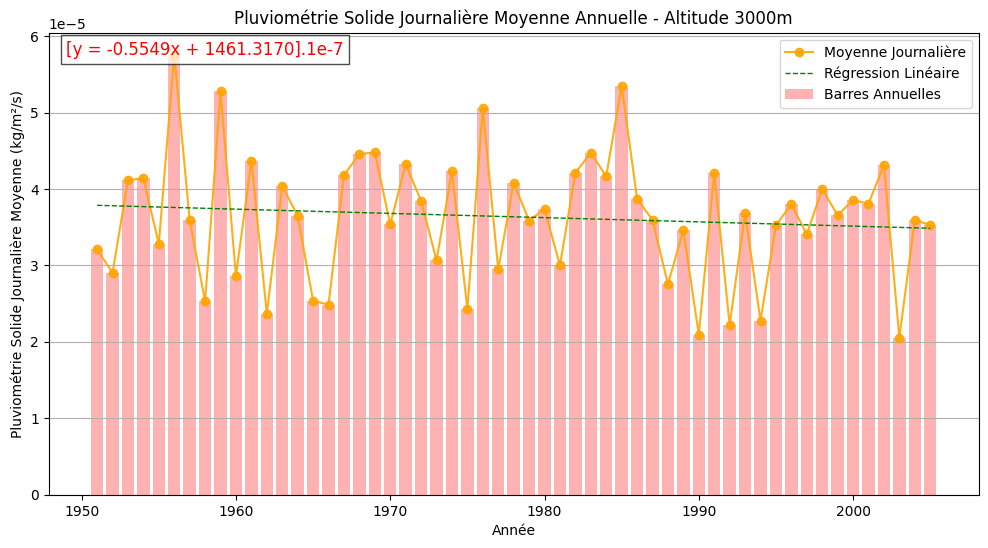


 Variation de pluviométrie solide = -7.9147%



=== Analyse du capteur 10233300 ===



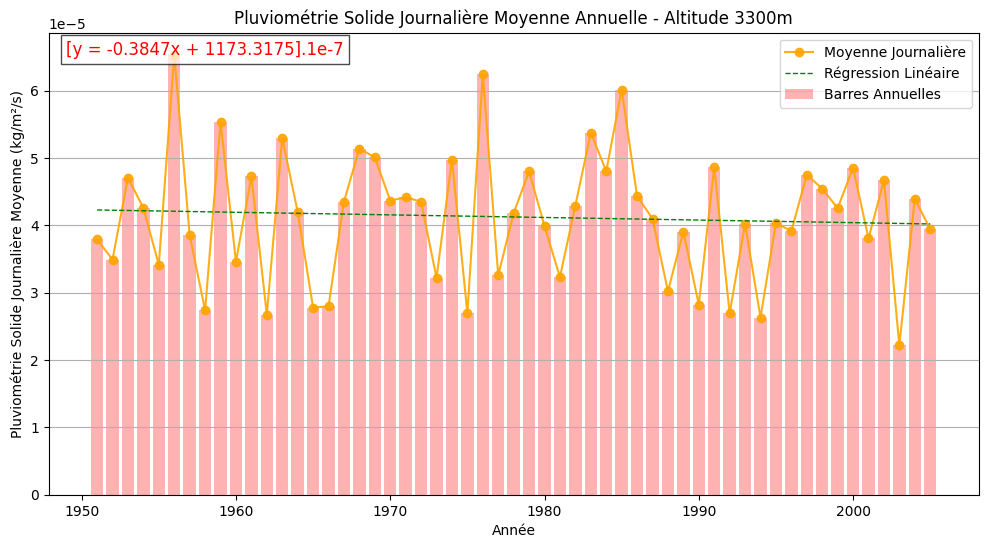


 Variation de pluviométrie solide = -4.9142%




In [59]:
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].copy()

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    # Ajouter une colonne "Year"
    df_capteur["Year"] = df_capteur["Date"].dt.year

    # Calcul des précipitations journalières moyennes par année
    annual_daily_precip = df_capteur.groupby("Year")["prsnAdjust"].mean()

    # Régression linéaire : Ajustement d'une droite
    x = annual_daily_precip.index.values  # Années
    y = annual_daily_precip.values  # Pluviométrie moyenne journalière
    coeffs = np.polyfit(x, y, deg=1)  # Ajustement linéaire (degré 1)
    trend_line = np.polyval(coeffs, x)  # Valeurs prédites

    # Affichage du graphique
    plt.figure(figsize=(12, 6))
    plt.plot(x, y, color='orange', alpha=0.9, marker='o', label="Moyenne Journalière")
    plt.bar(x, y, color='red', alpha=0.3, label="Barres Annuelles")
    plt.plot(x, trend_line, color='green', linestyle='--', linewidth=1, label="Régression Linéaire")

    # Affichage de l'équation de la droite
    equation = f"[y = {coeffs[0]*1e7:.4f}x + {coeffs[1]*1e7:.4f}].1e-7"
    plt.text(x.min()-2, y.max(), equation, fontsize=12, color="red", bbox=dict(facecolor='white', alpha=0.7))

    plt.xlabel("Année")
    plt.ylabel("Pluviométrie Solide Journalière Moyenne (kg/m²/s)")
    plt.title(f"Pluviométrie Solide Journalière Moyenne Annuelle - Altitude {altitude}m")
    plt.legend(loc='upper right')
    plt.grid(axis='y')

    # Affichage
    plt.show()

    print(f"\n Variation de pluviométrie solide = {round(100*coeffs[0]*(x.max()-x.min())/(coeffs[0]*x.min()+coeffs[1]), 4)}%")

    print("\n" + "=" * 110 + "\n")

### Gestion des années bissextiles

Il semble impossible d'ajouter des dates qui n'exstent pas au dataset (il est donc impossible d'ajouter des 29 févriers tous les ans). Le choix est donc fait de réaliser les affichages qui suivront après avoir éliminé les 29 févriers des jeux de données jusqu'à avoir trouvé une solution.

In [60]:
# Supprimer les 29 février
df_bis = df[~((df["Date"].dt.month == 2) & (df["Date"].dt.day == 29))]

# Trier les valeurs après la suppression
df_bis = df_bis.sort_values(by=["Date"]).reset_index(drop=True)

In [61]:
df_stock = df
df = df_bis
df = df_stock

Enrichir les informations de moyenne glissante avec le maximum glissant, le minimum glissant et la variance glissante sans pour autant faire exploser le nombre de graphiques (ajouter ces informations sur chaque graphique avec une légende claire et de la transparence)


=== Analyse du capteur 10230300 ===



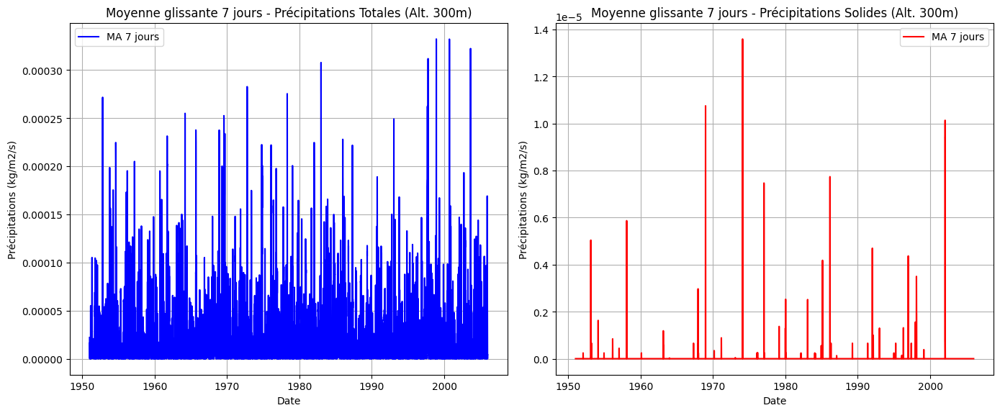

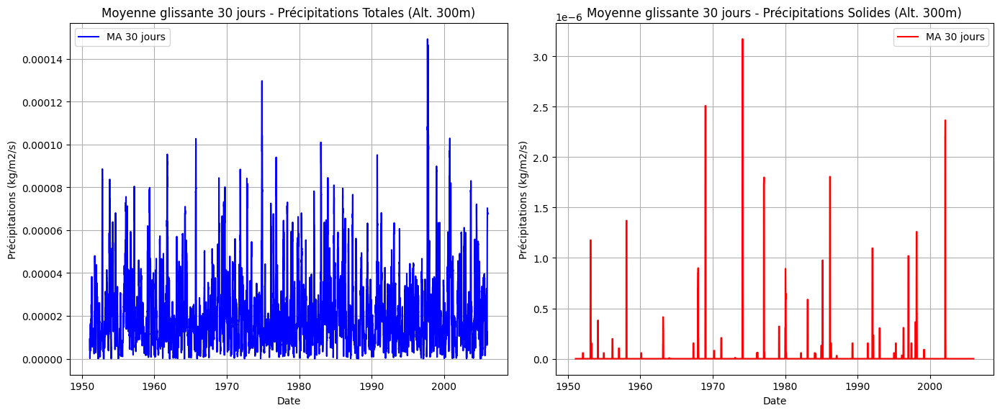

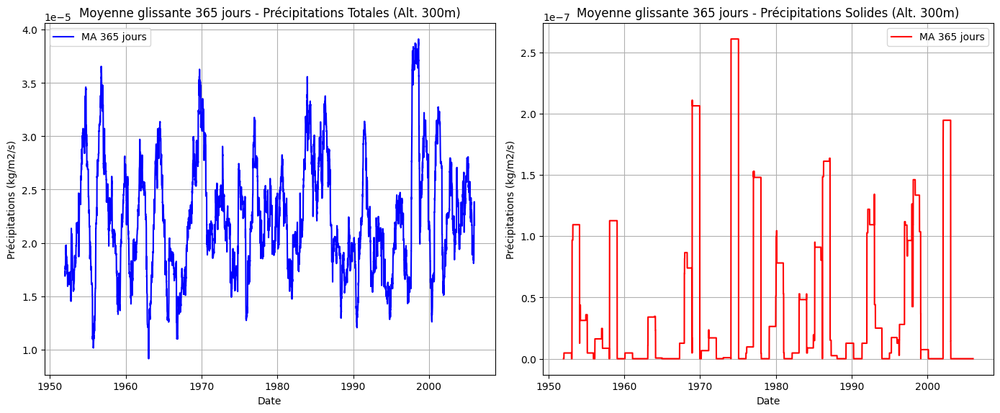

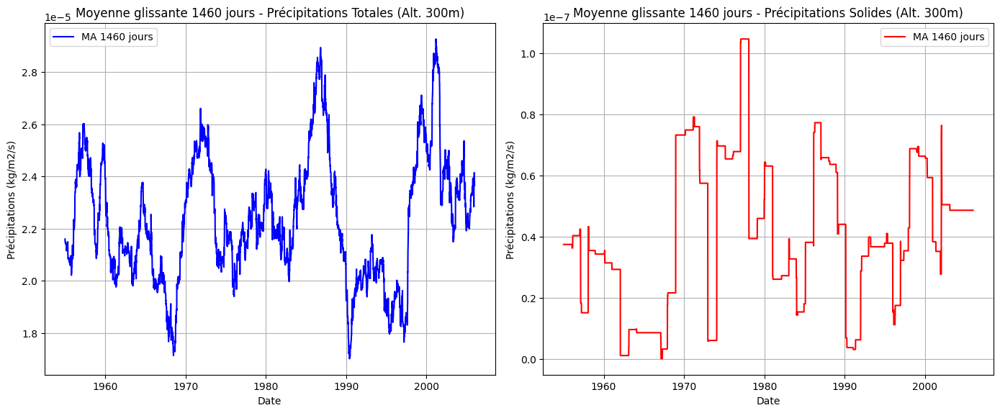

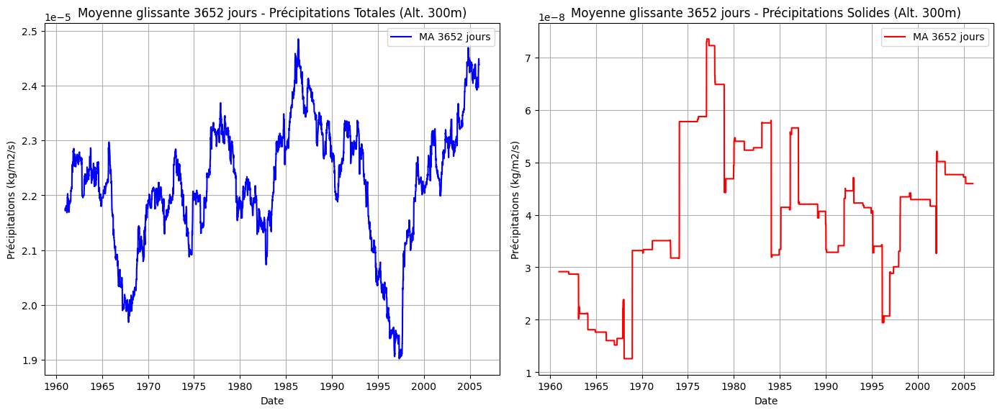




=== Analyse du capteur 10230600 ===



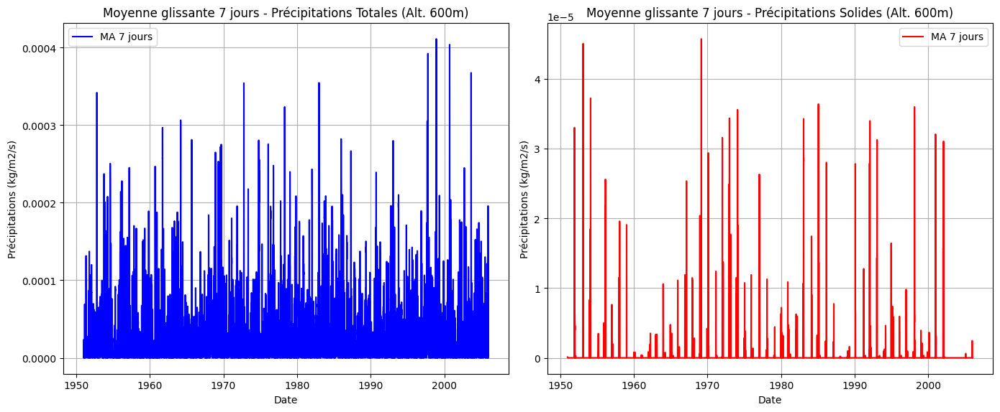

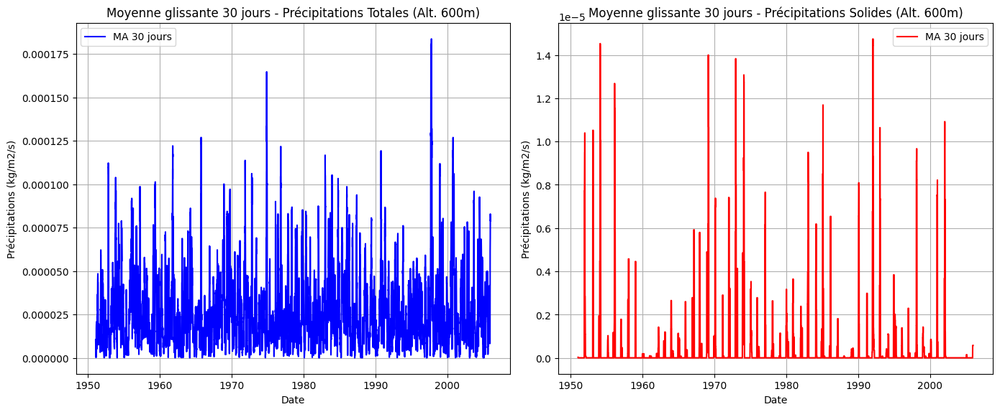

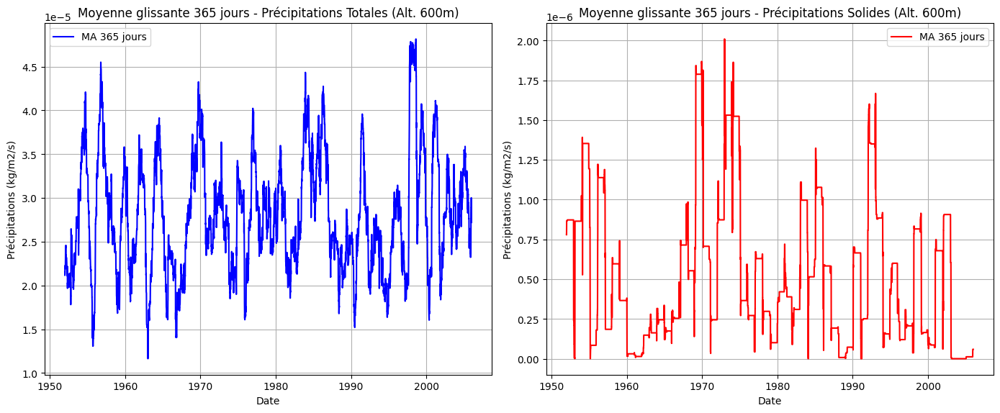

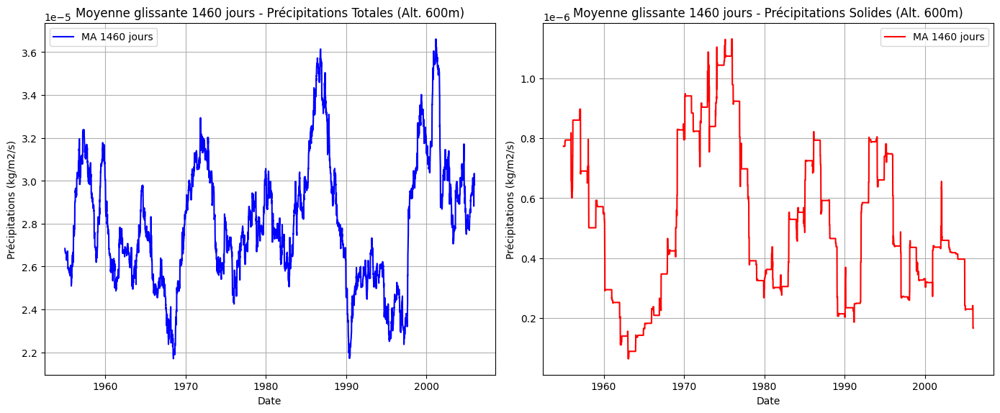

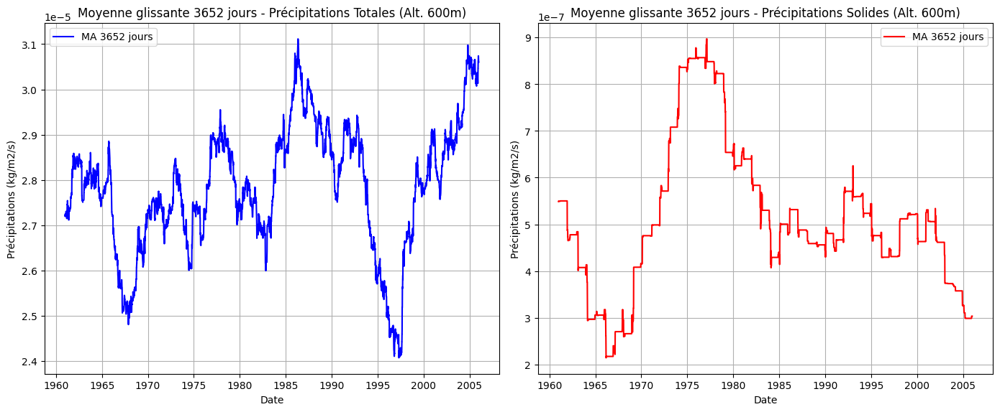




=== Analyse du capteur 10230900 ===



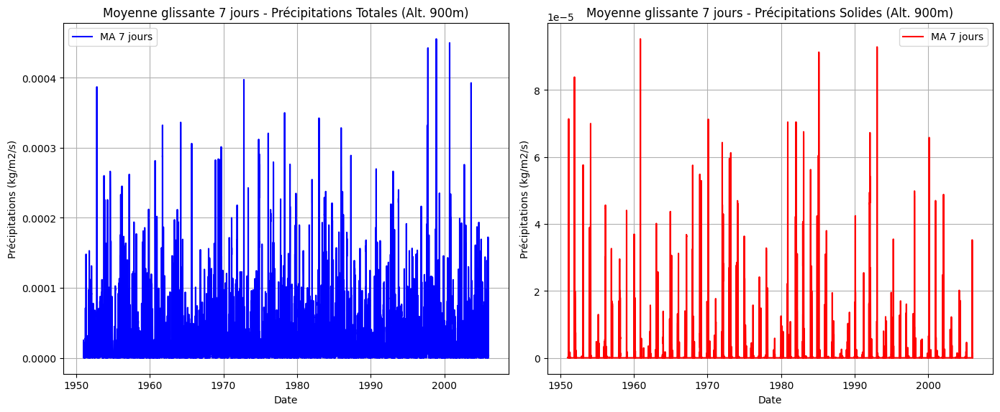

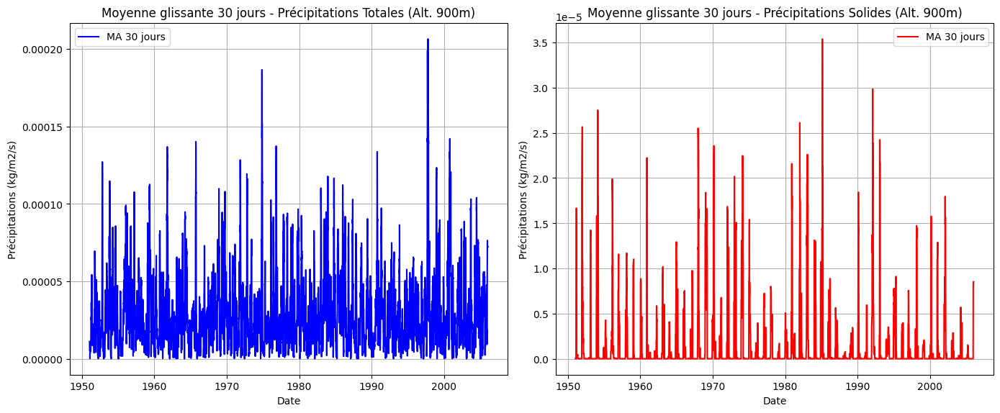

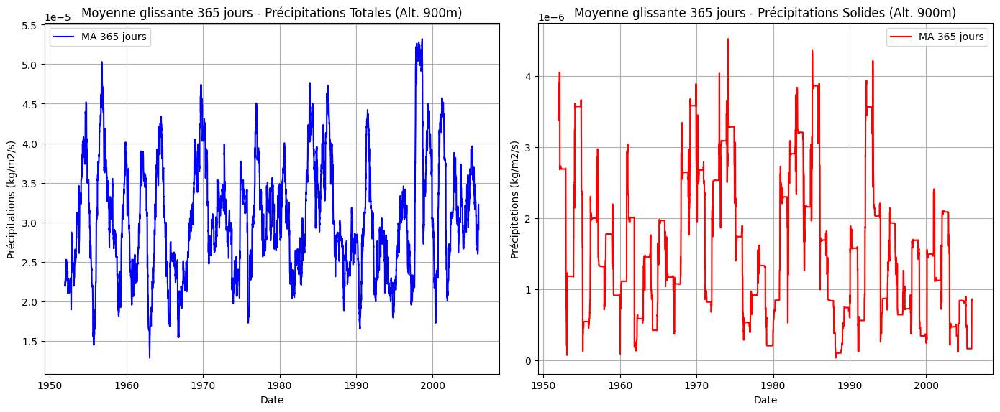

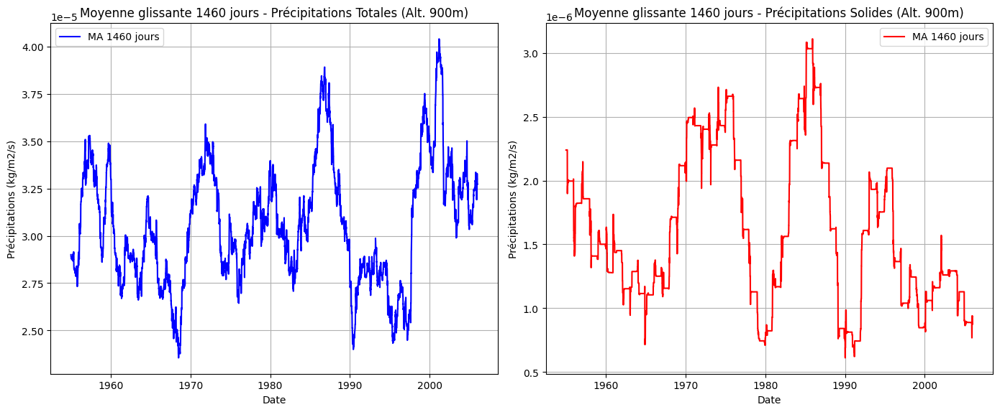

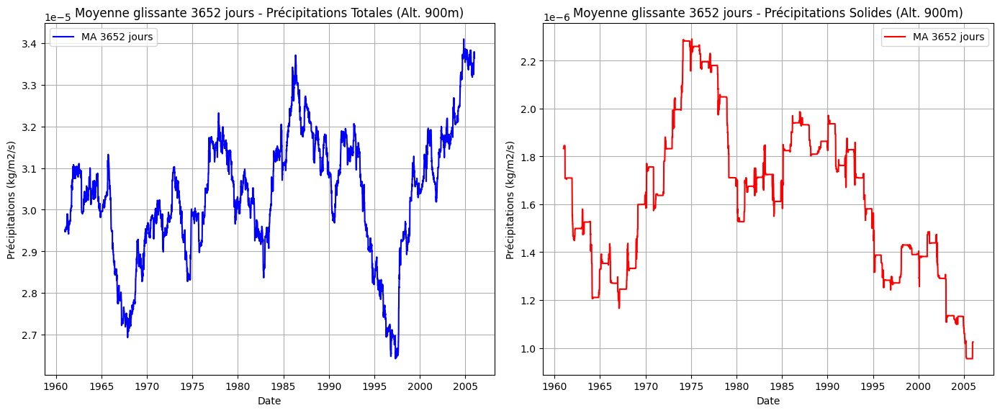




=== Analyse du capteur 10231200 ===



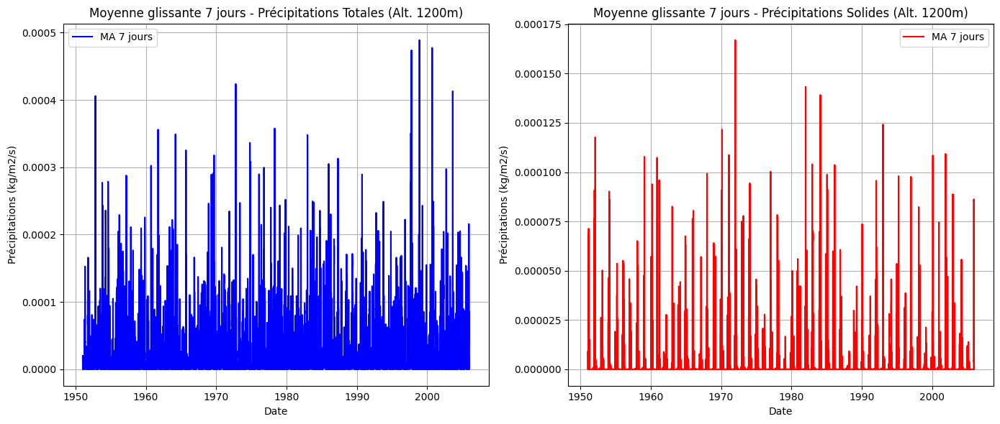

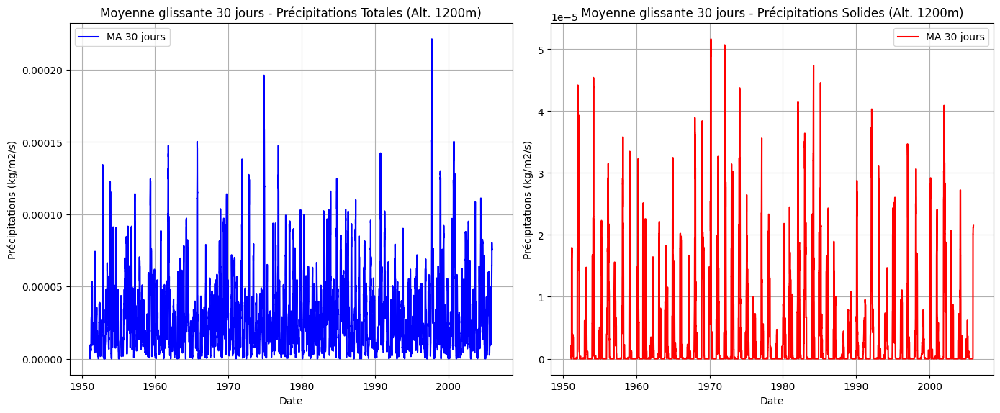

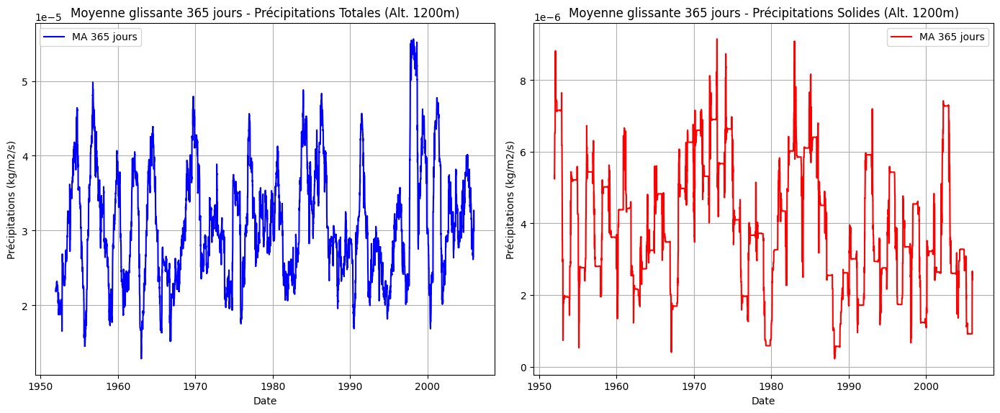

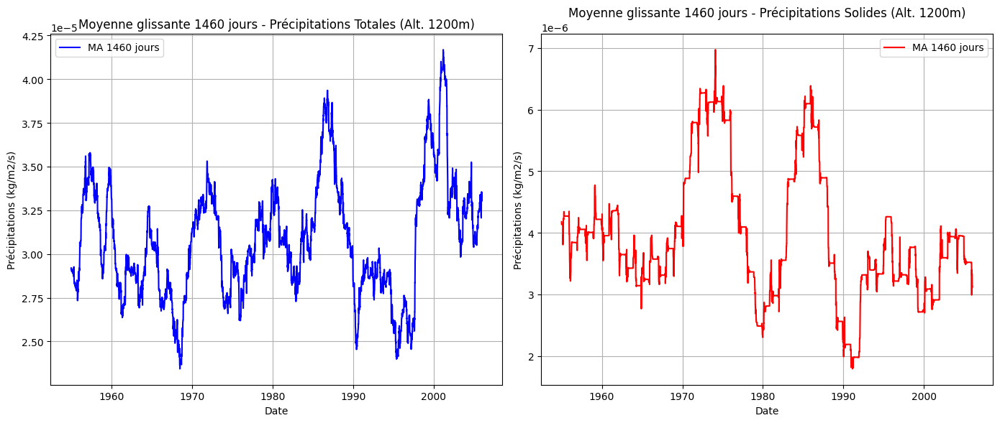

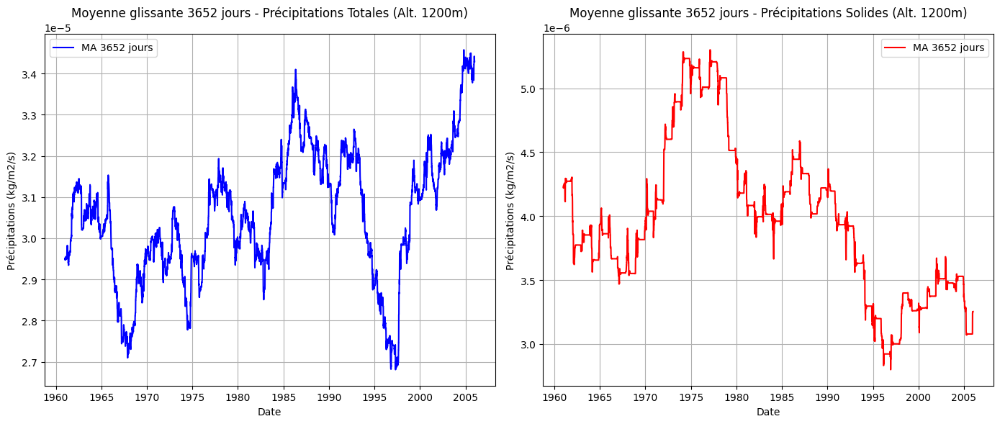




=== Analyse du capteur 10231500 ===



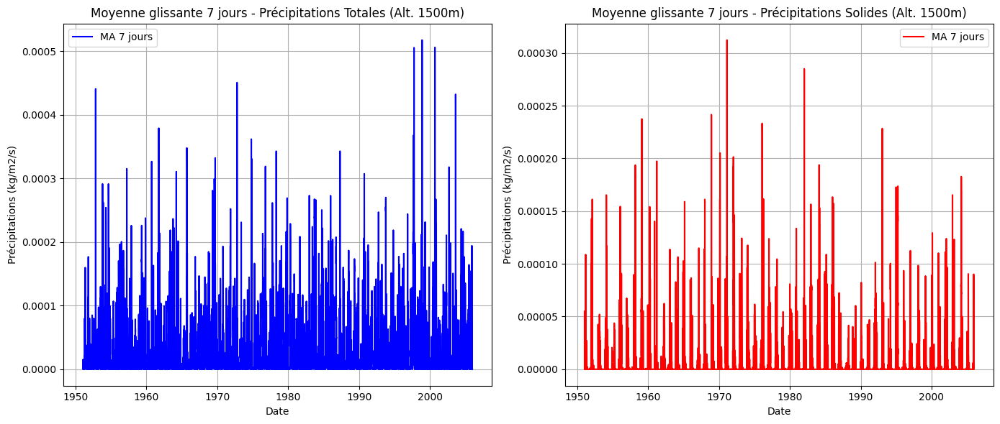

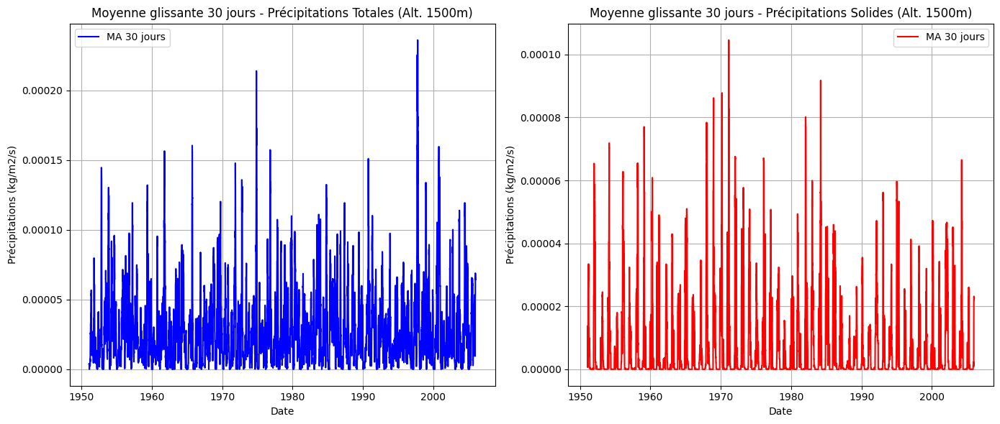

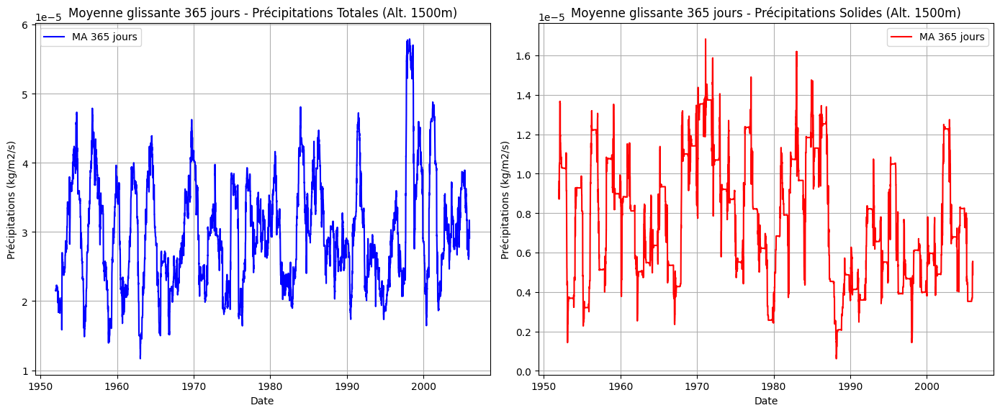

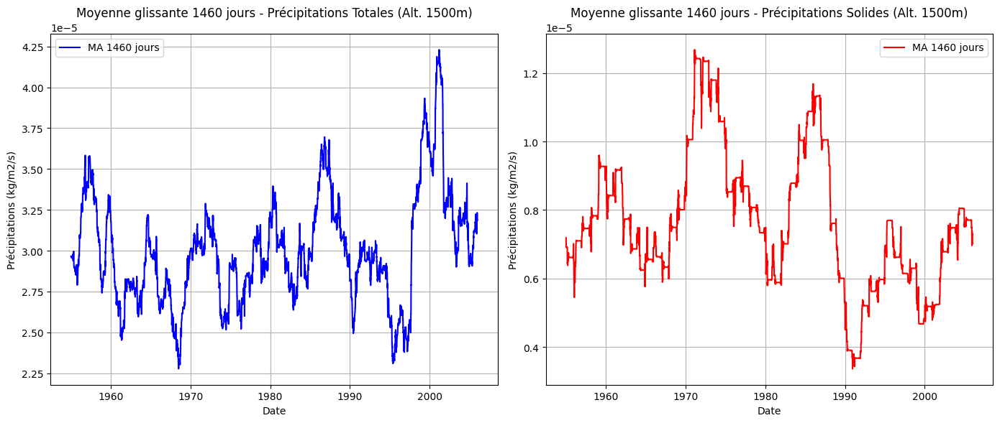

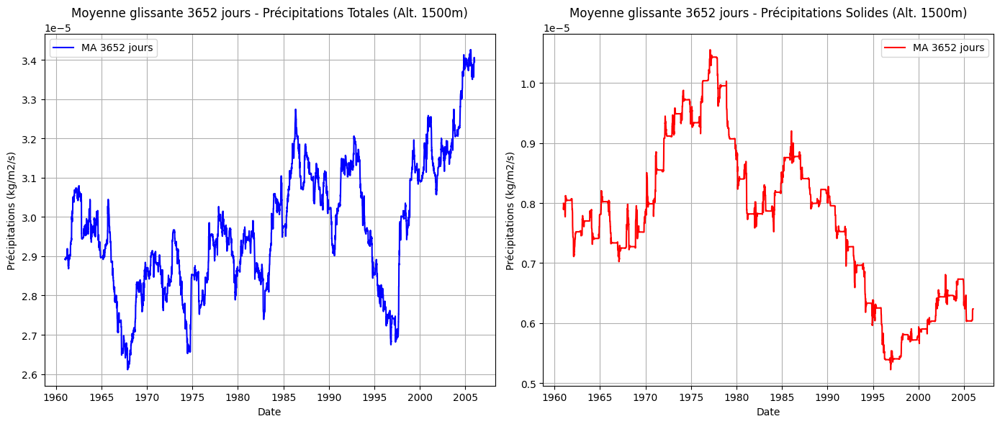




=== Analyse du capteur 10231800 ===



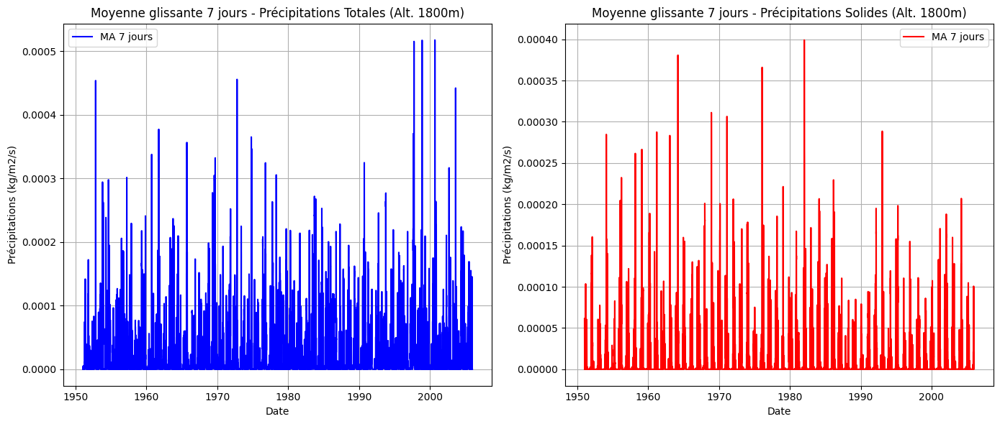

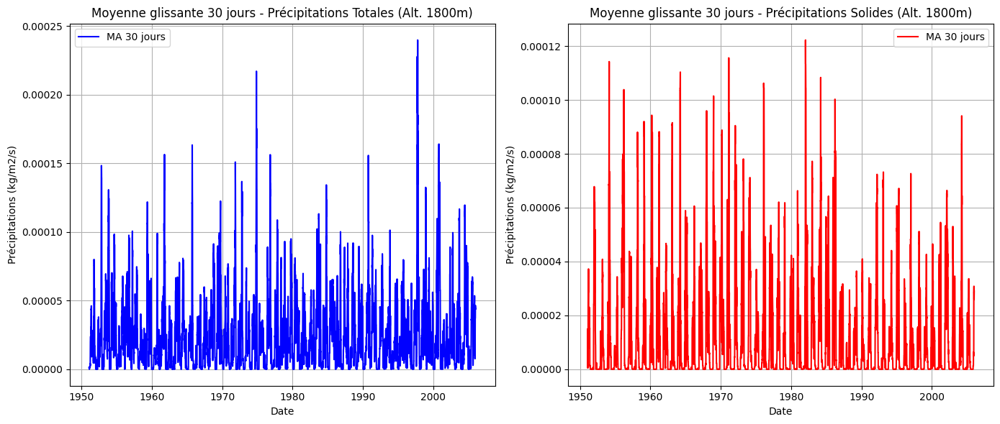

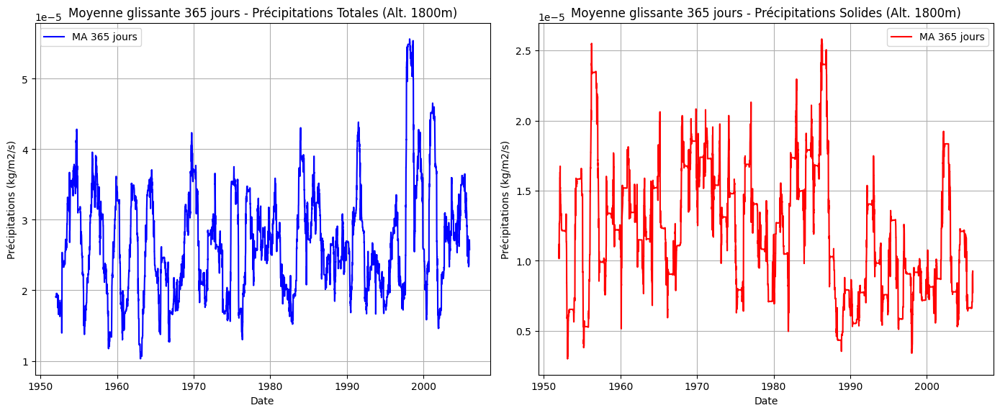

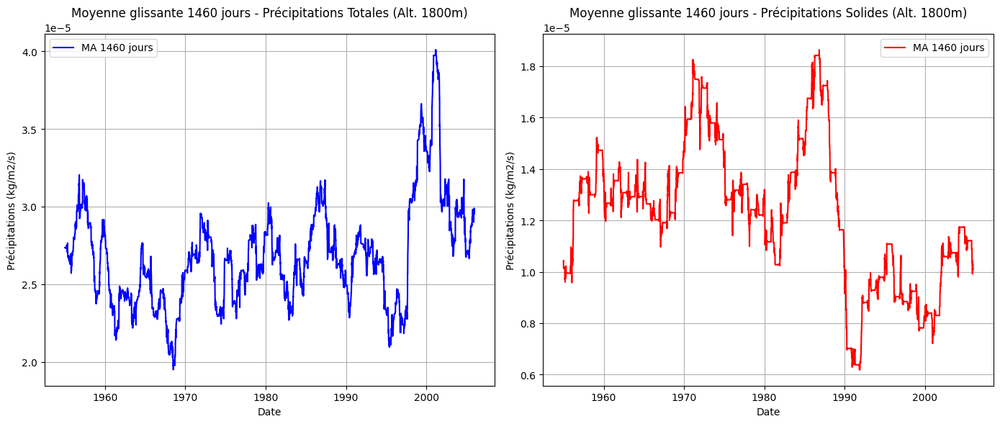

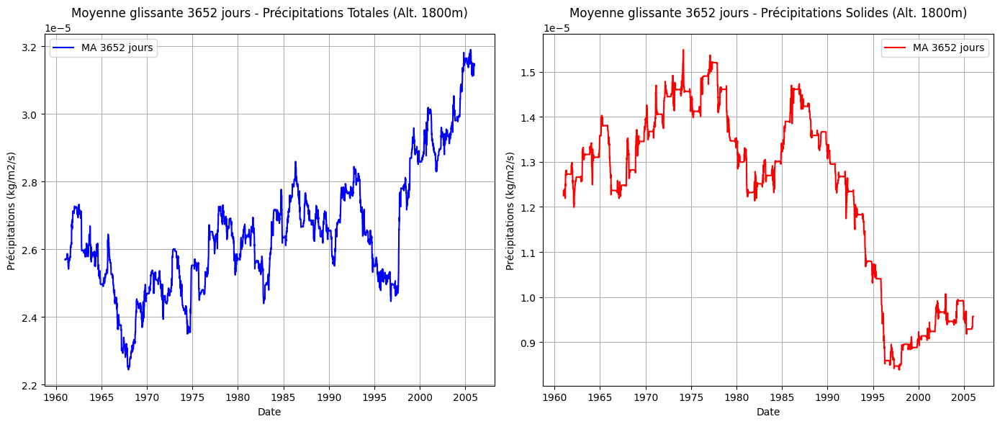




=== Analyse du capteur 10232100 ===



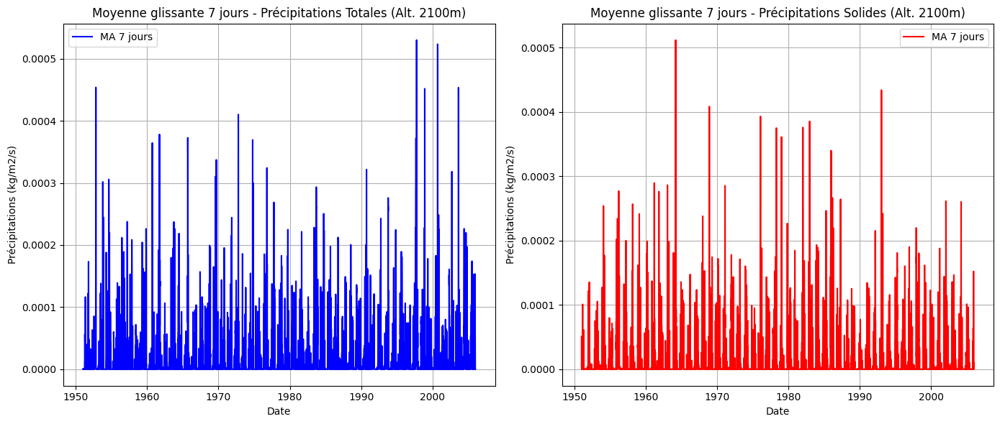

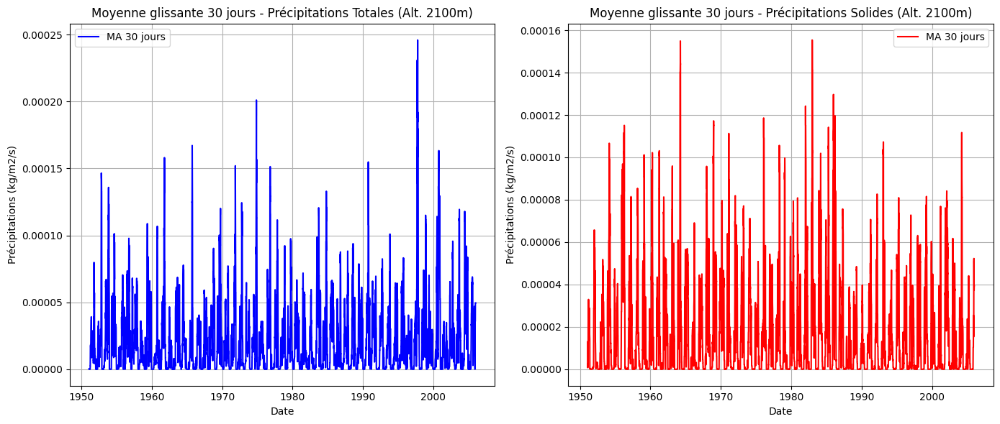

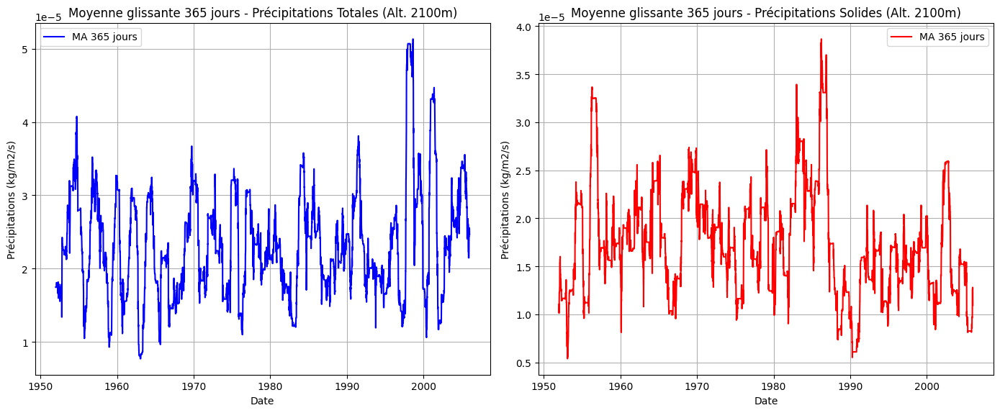

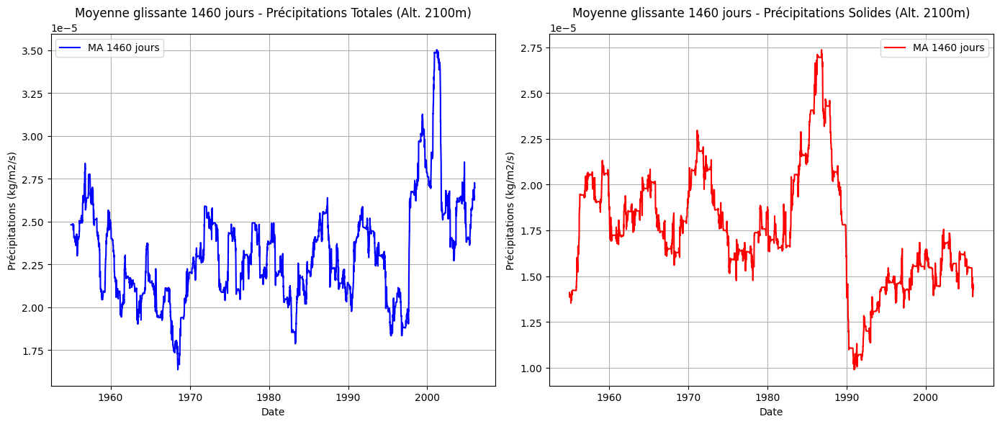

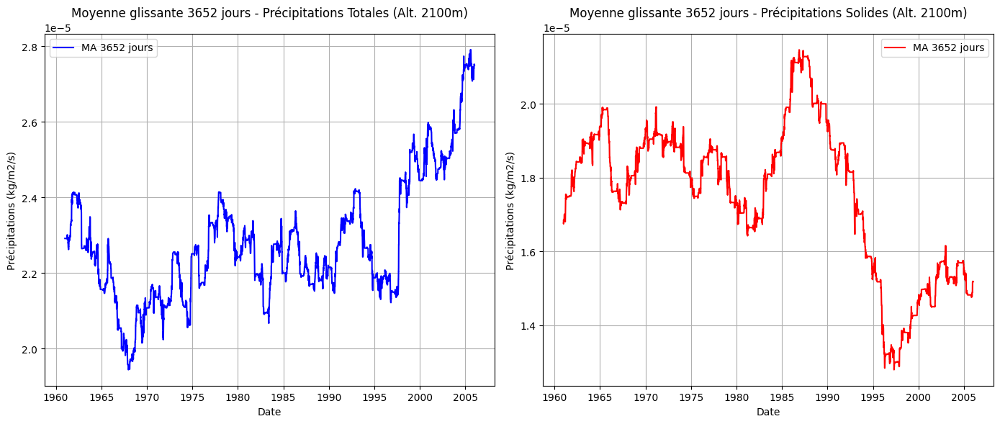




=== Analyse du capteur 10232400 ===



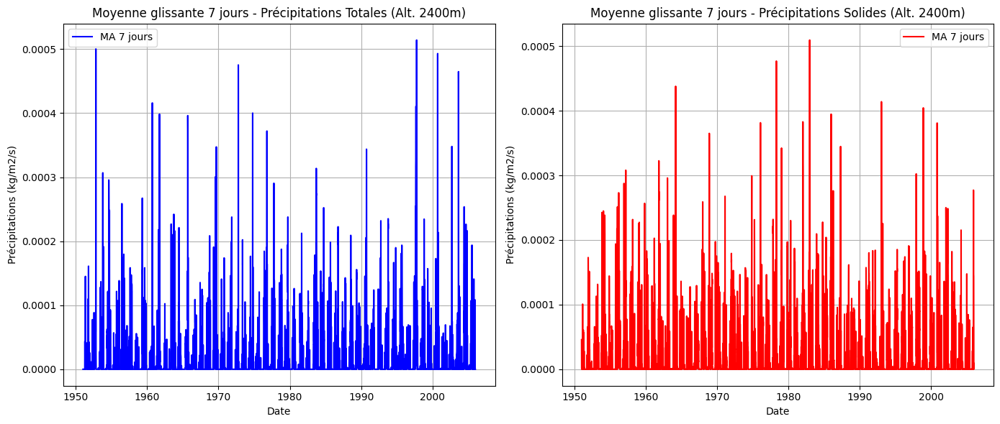

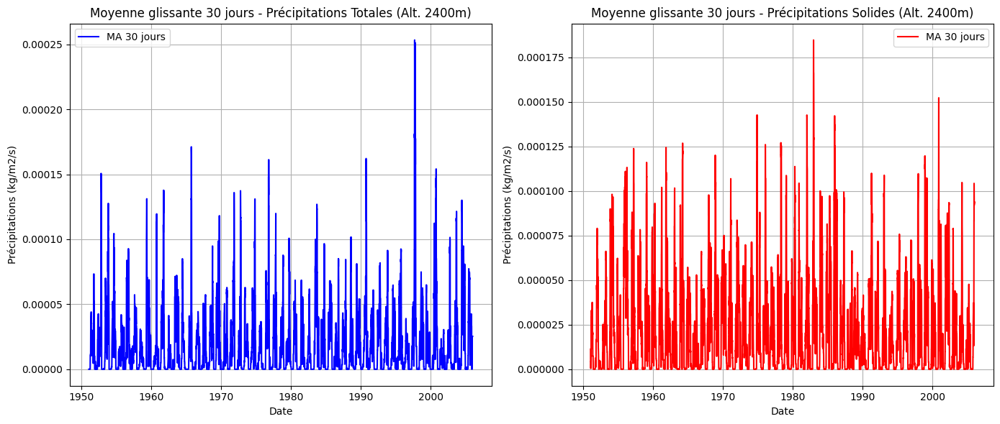

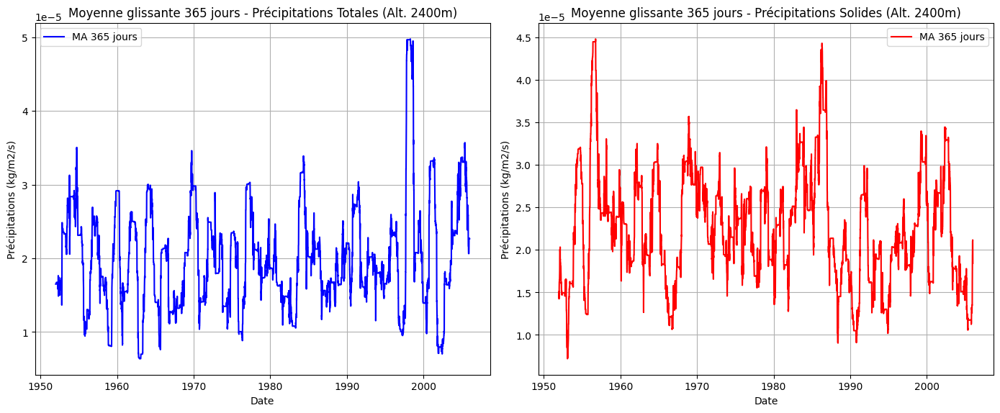

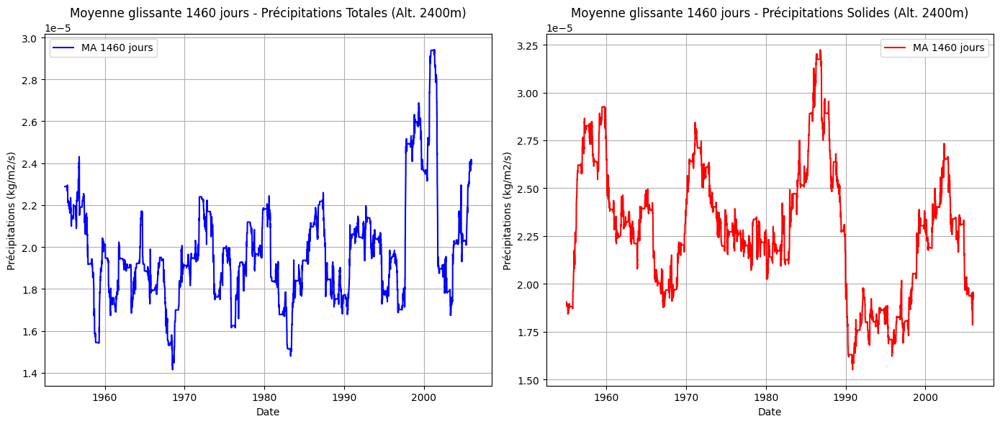

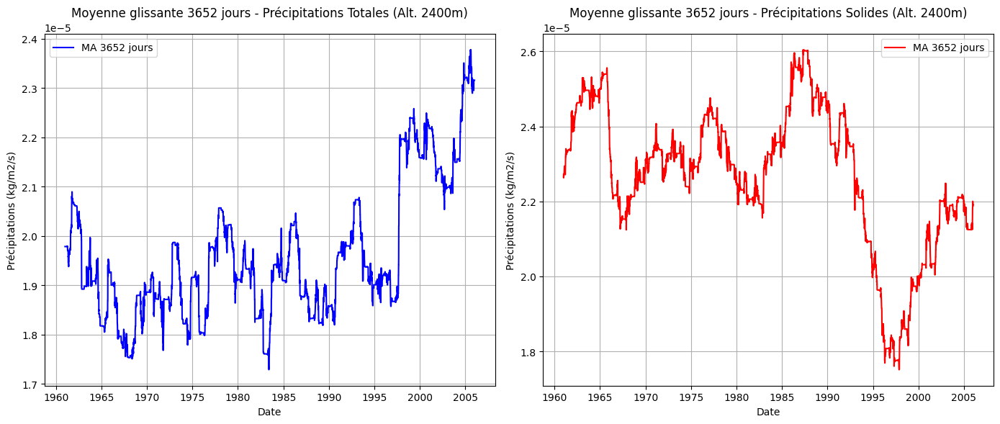




=== Analyse du capteur 10232700 ===



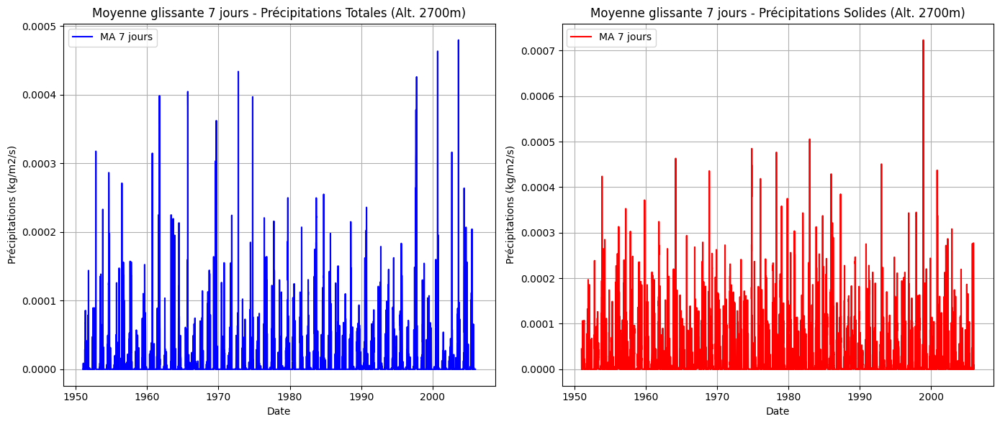

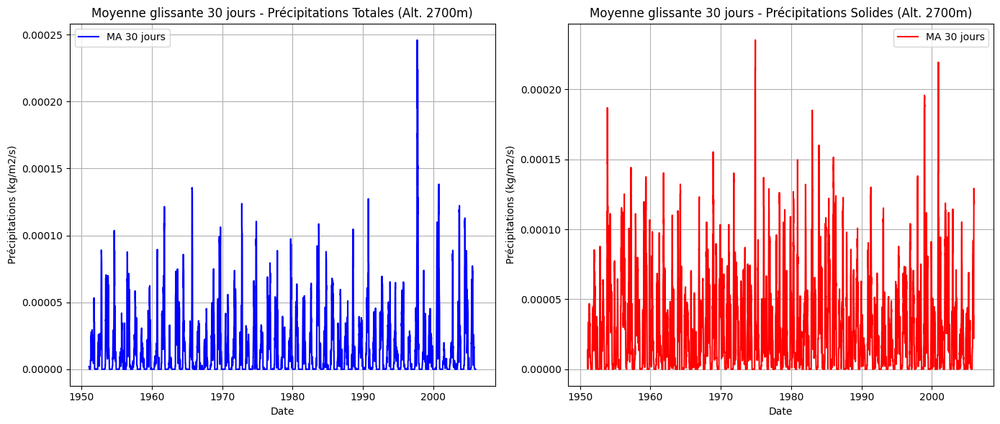

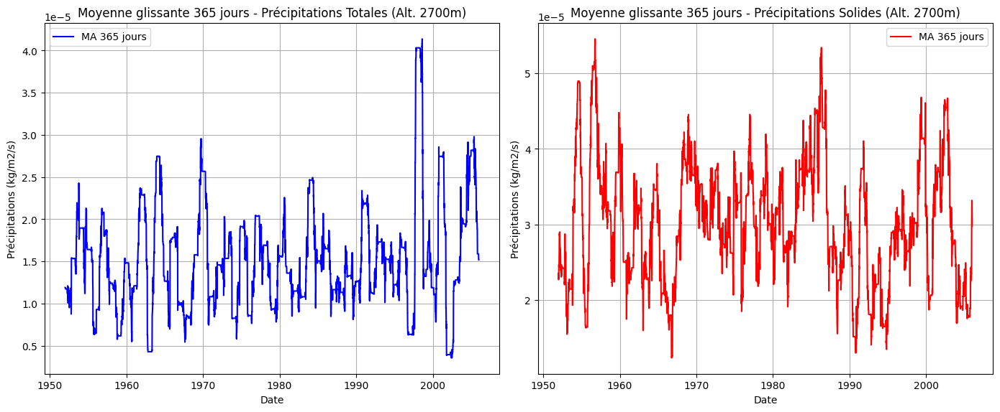

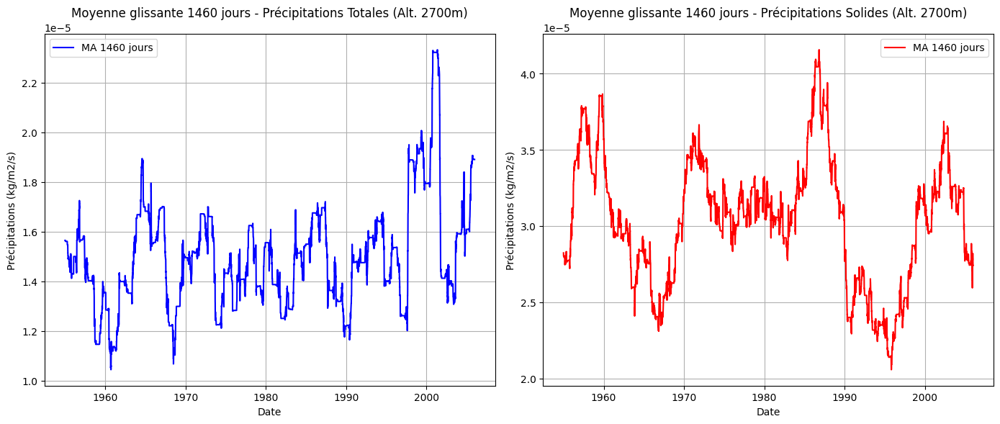

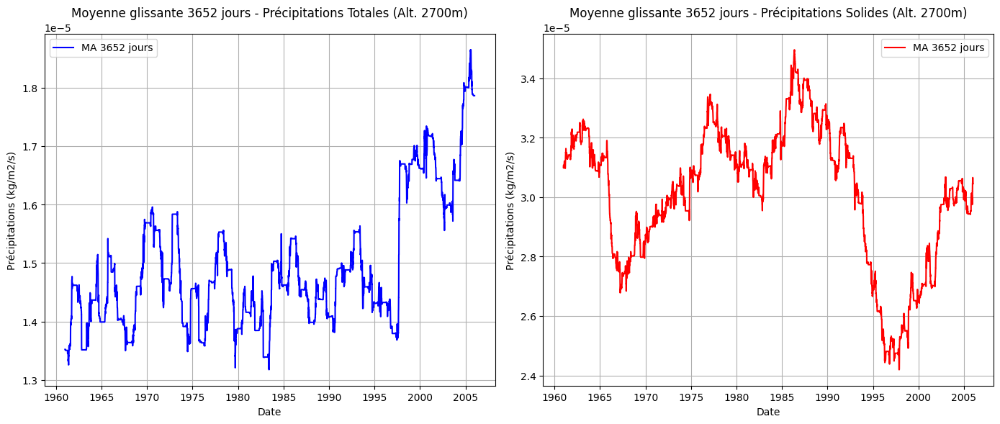




=== Analyse du capteur 10233000 ===



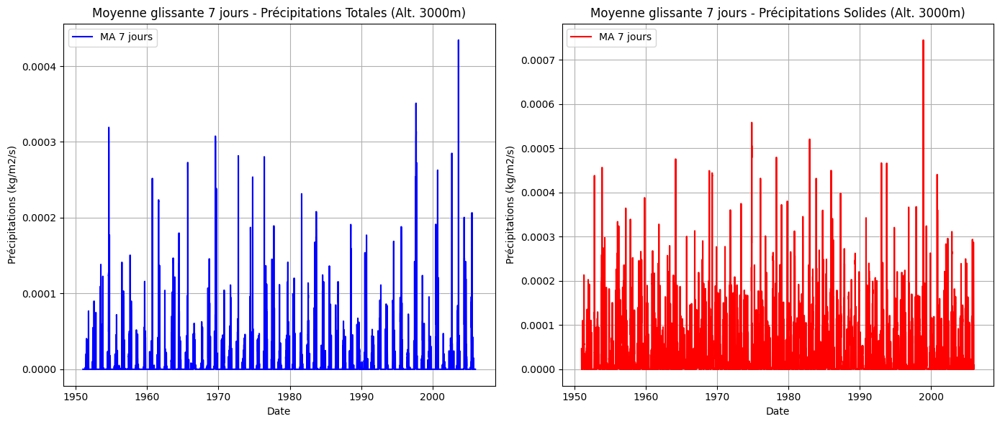

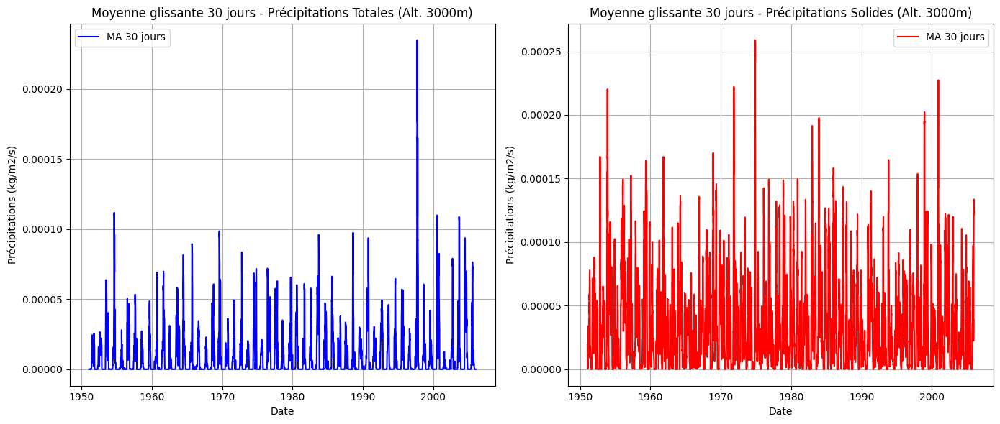

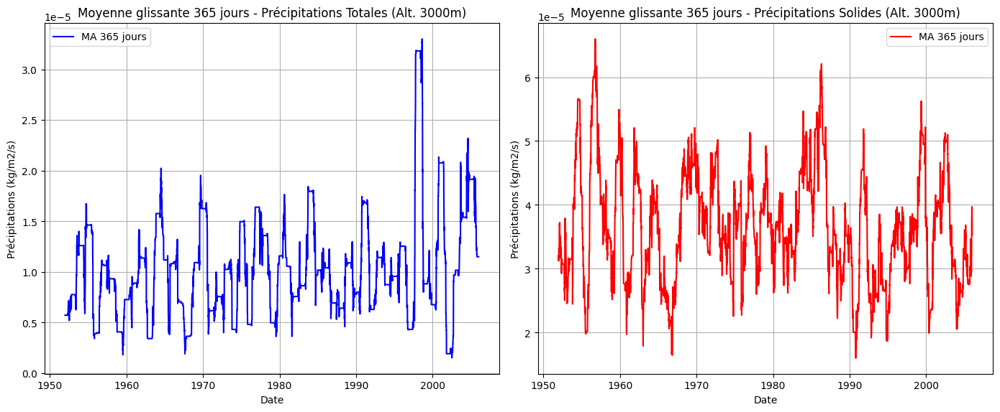

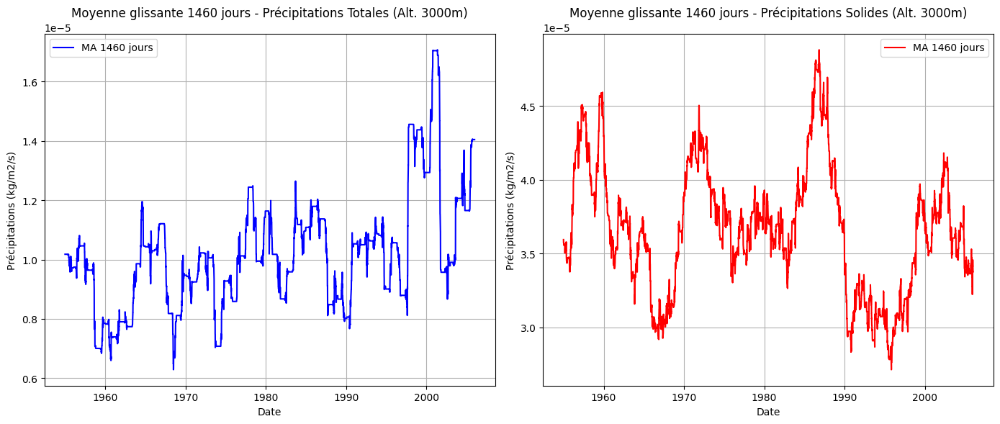

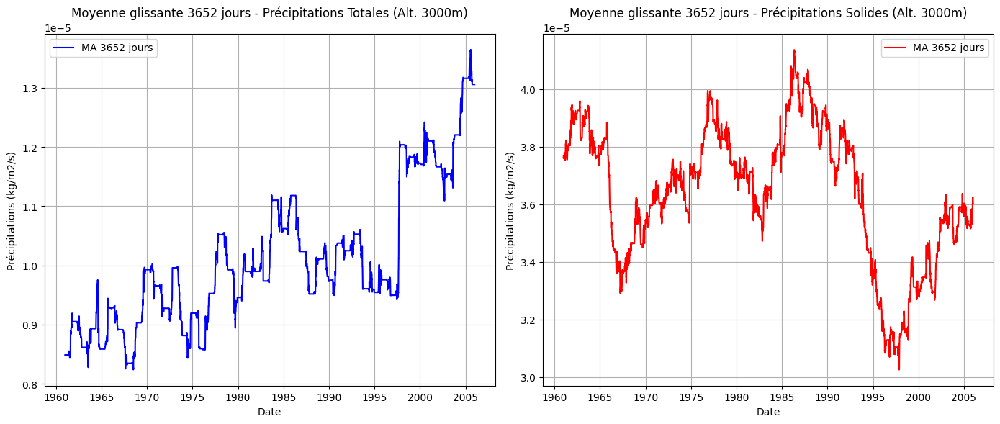




=== Analyse du capteur 10233300 ===



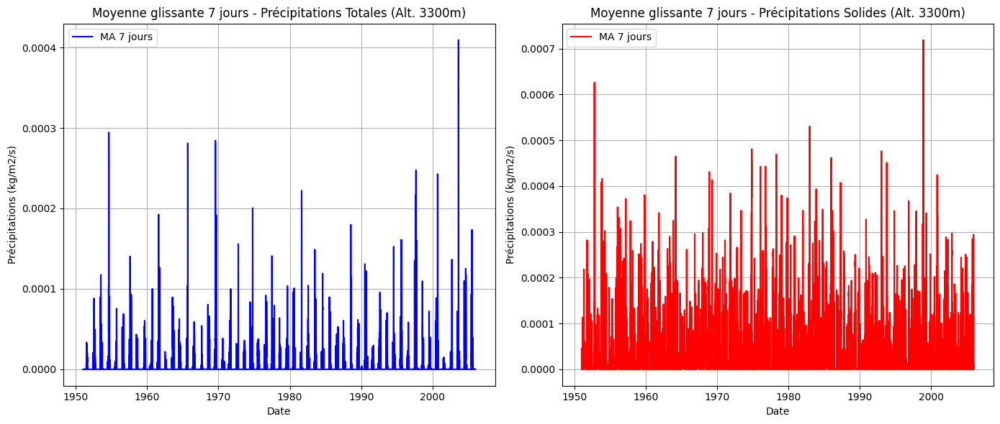

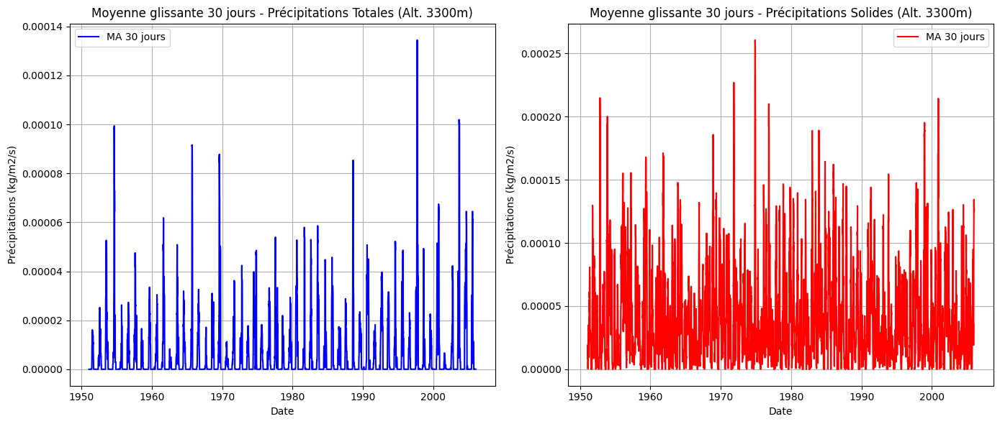

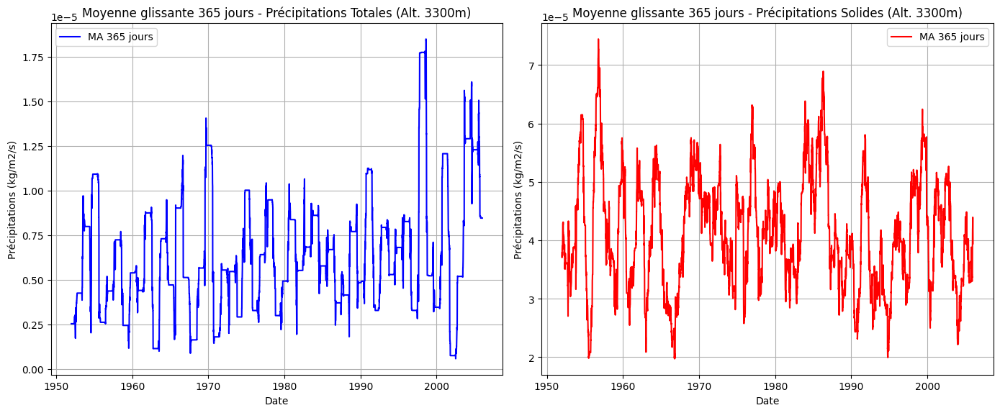

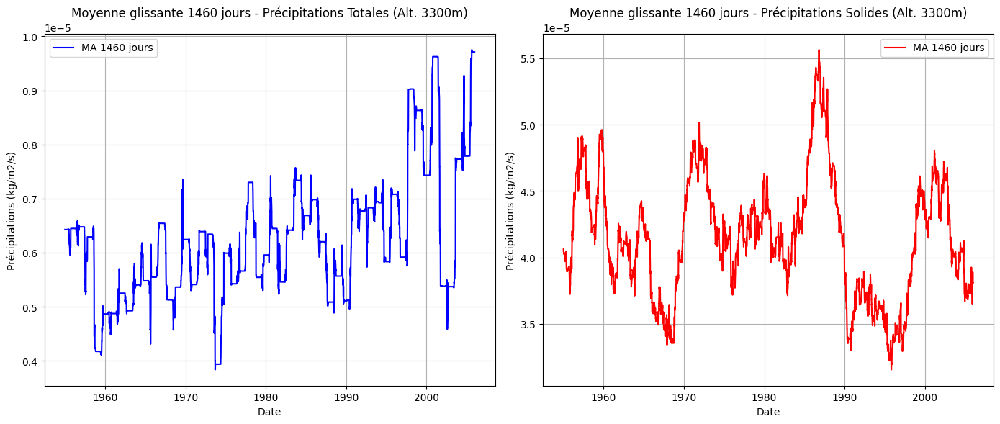

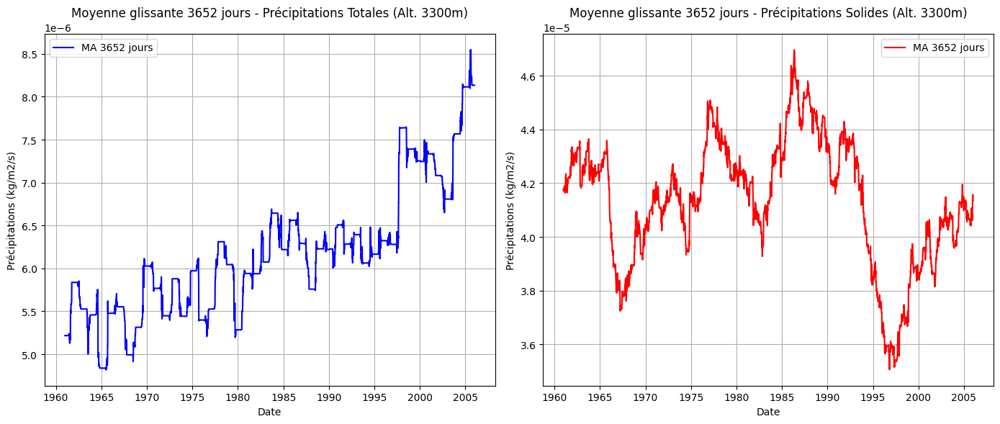

In [62]:
def plot_moving_average(df, window, capteur, altitude):
    df_temp = df.copy()  # Créer une copie temporaire pour éviter les conflits
    df_temp[f"prtot_ma"] = df_temp["prtotAdjust"].rolling(window=window, min_periods=window).mean()
    df_temp[f"prsn_ma"] = df_temp["prsnAdjust"].rolling(window=window, min_periods=window).mean()

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Graphique des précipitations totales
    axes[0].plot(df_temp["Date"], df_temp[f"prtot_ma"], label=f"MA {window} jours", color='blue')
    axes[0].set_title(f"Moyenne glissante {window} jours - Précipitations Totales (Alt. {altitude}m)")
    axes[0].set_xlabel("Date")
    axes[0].set_ylabel("Précipitations (kg/m2/s)")
    axes[0].legend()
    axes[0].grid()

    # Graphique des précipitations solides
    axes[1].plot(df_temp["Date"], df_temp[f"prsn_ma"], label=f"MA {window} jours", color='red')
    axes[1].set_title(f"Moyenne glissante {window} jours - Précipitations Solides (Alt. {altitude}m)")
    axes[1].set_xlabel("Date")
    axes[1].set_ylabel("Précipitations (kg/m2/s)")
    axes[1].legend()
    axes[1].grid()

    plt.tight_layout()
    plt.show()


# Vérifier les capteurs uniques
capteurs = df["idPoint"].sort_values().unique()

# Appliquer l'analyse par capteur
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by=["Date"]).reset_index(drop=True)

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    # Appliquer la moyenne glissante pour différentes fenêtres
    for n in [7, 30, 365, 1460, 3652]:  
        plot_moving_average(df_capteur, n, capteur, altitude)

    print("\n" + "=" * 110 + "\n")

## Analyse de la tendance, de la saisonalité, des cycles et des anomalies

In [63]:
df = df_stock

### Précipitations liquides


=== Analyse du capteur 10230300 ===



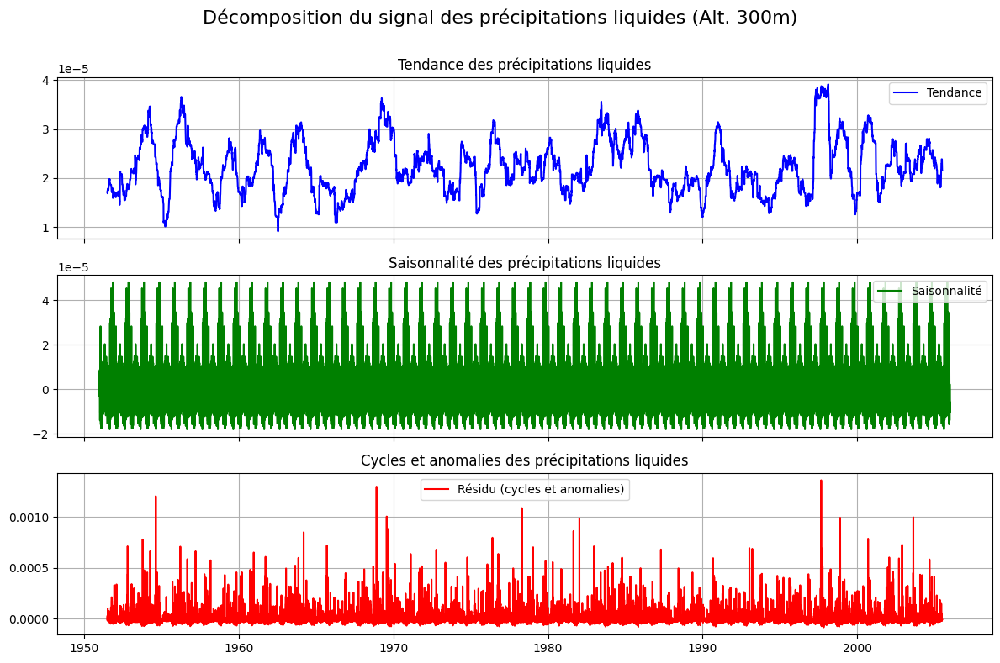




=== Analyse du capteur 10230600 ===



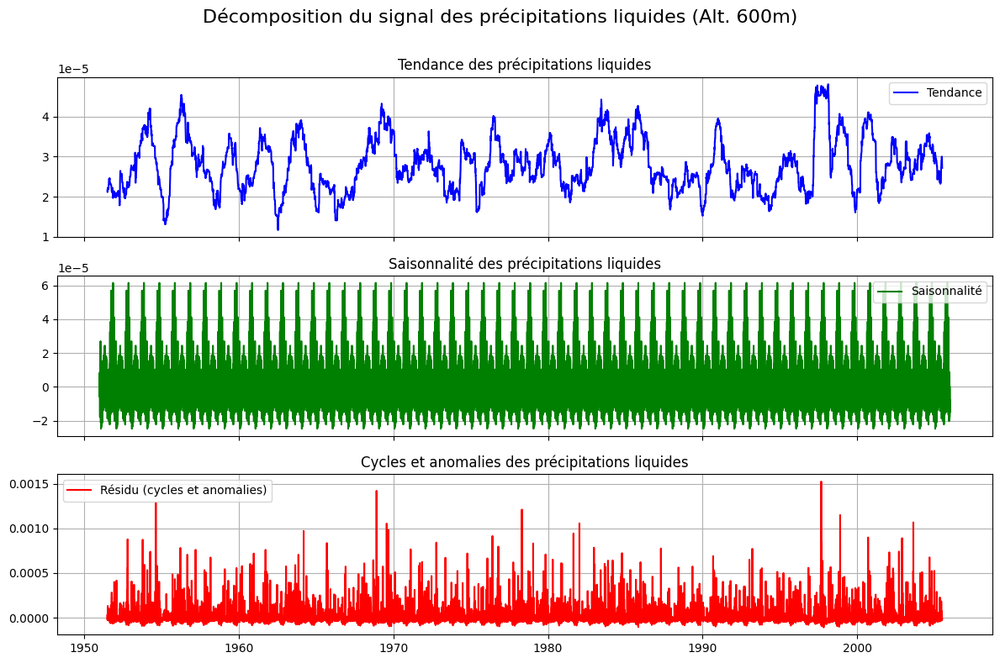




=== Analyse du capteur 10230900 ===



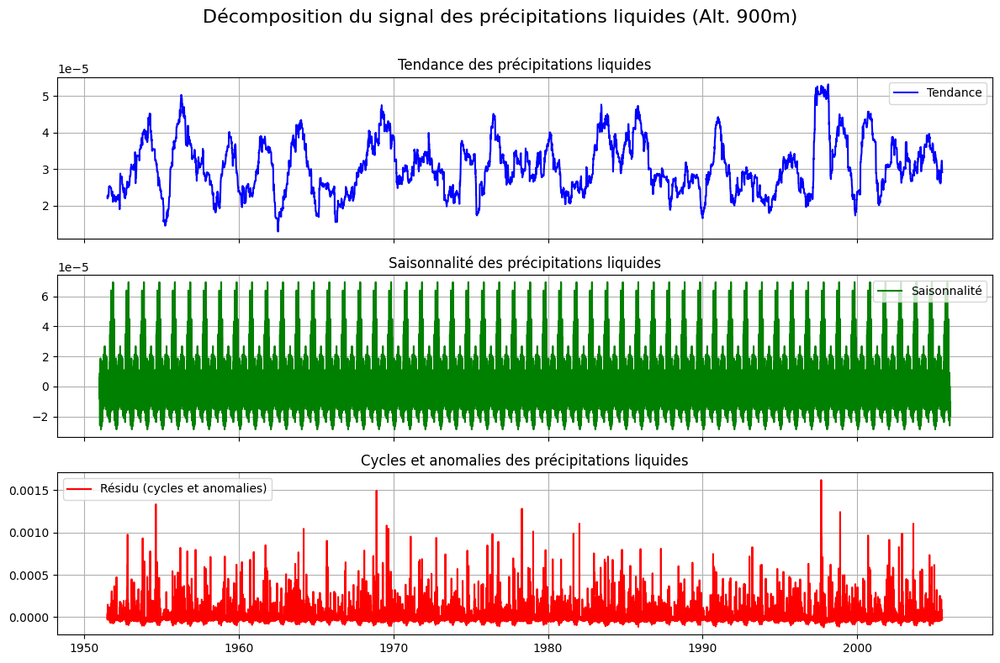




=== Analyse du capteur 10231200 ===



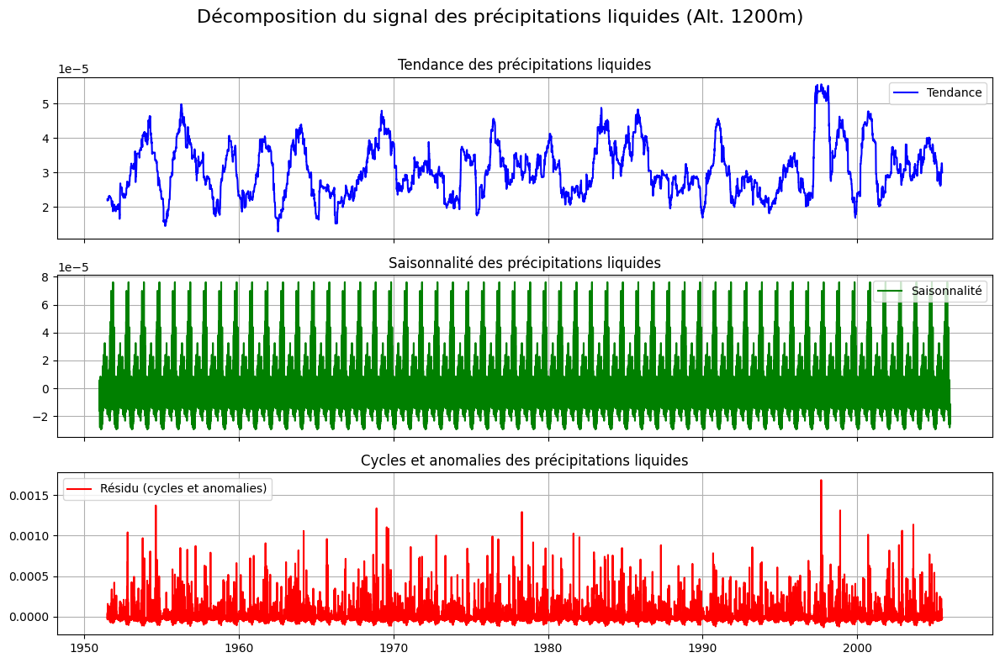




=== Analyse du capteur 10231500 ===



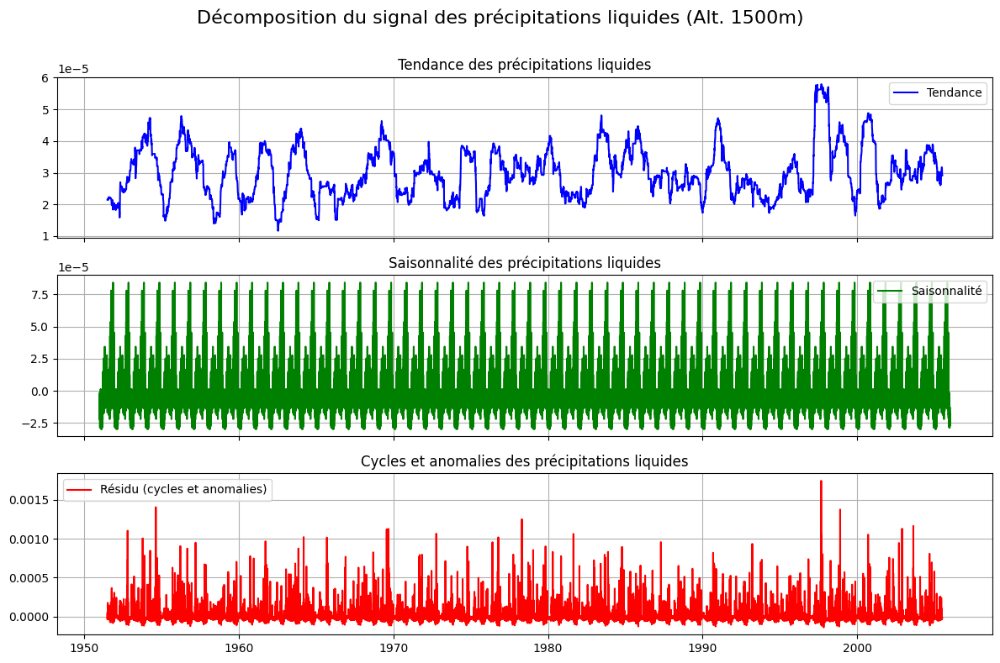




=== Analyse du capteur 10231800 ===



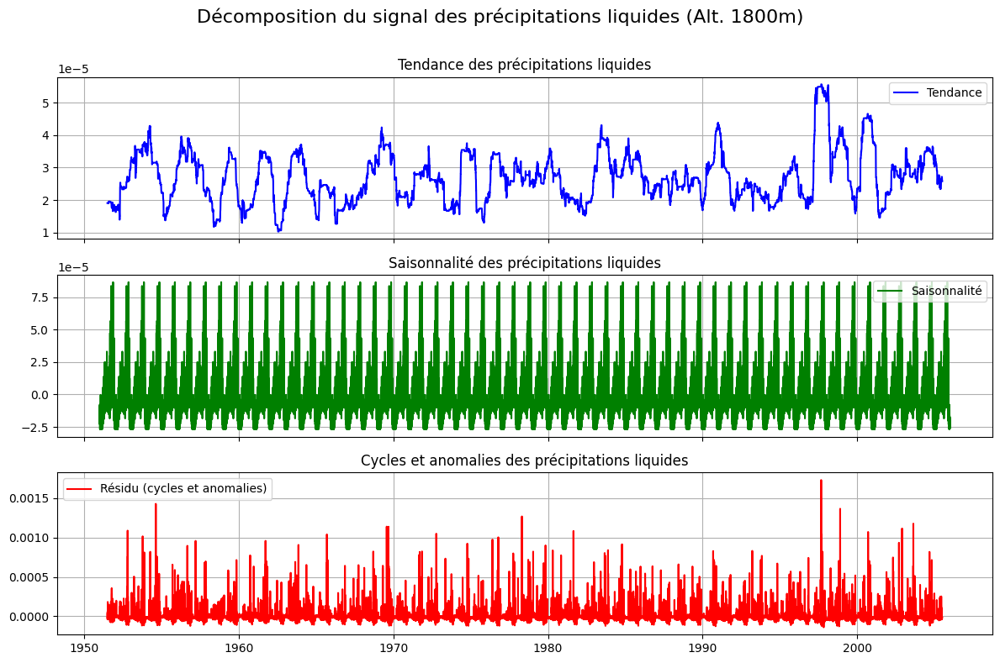




=== Analyse du capteur 10232100 ===



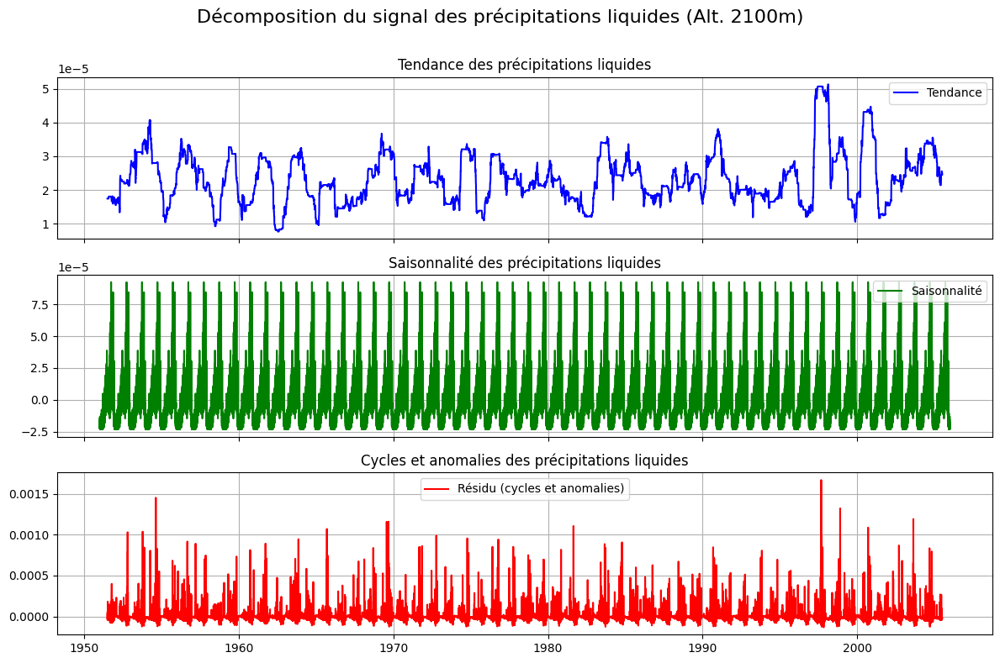




=== Analyse du capteur 10232400 ===



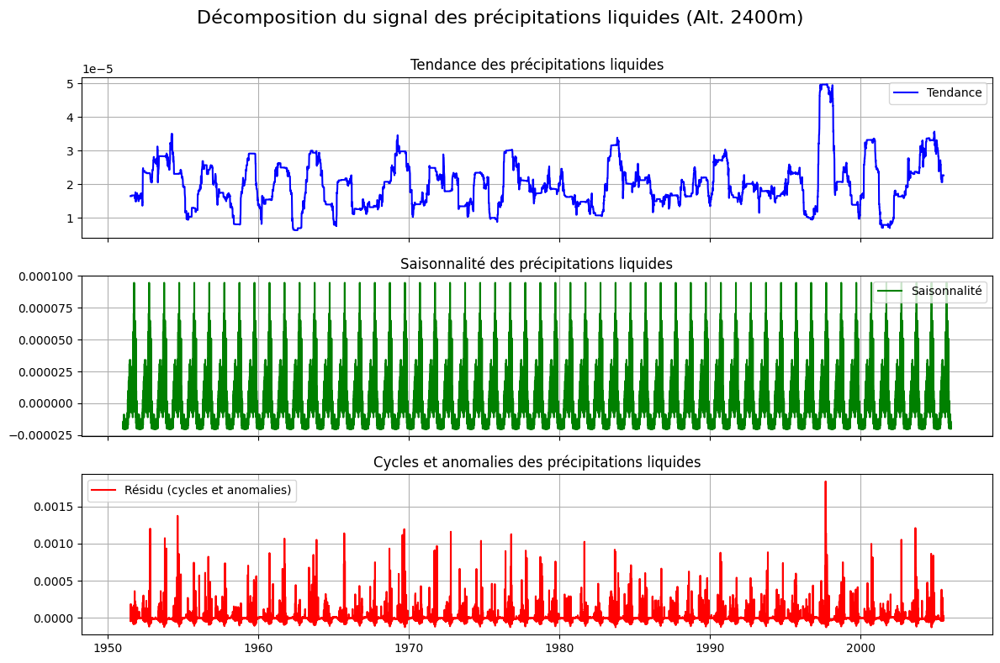




=== Analyse du capteur 10232700 ===



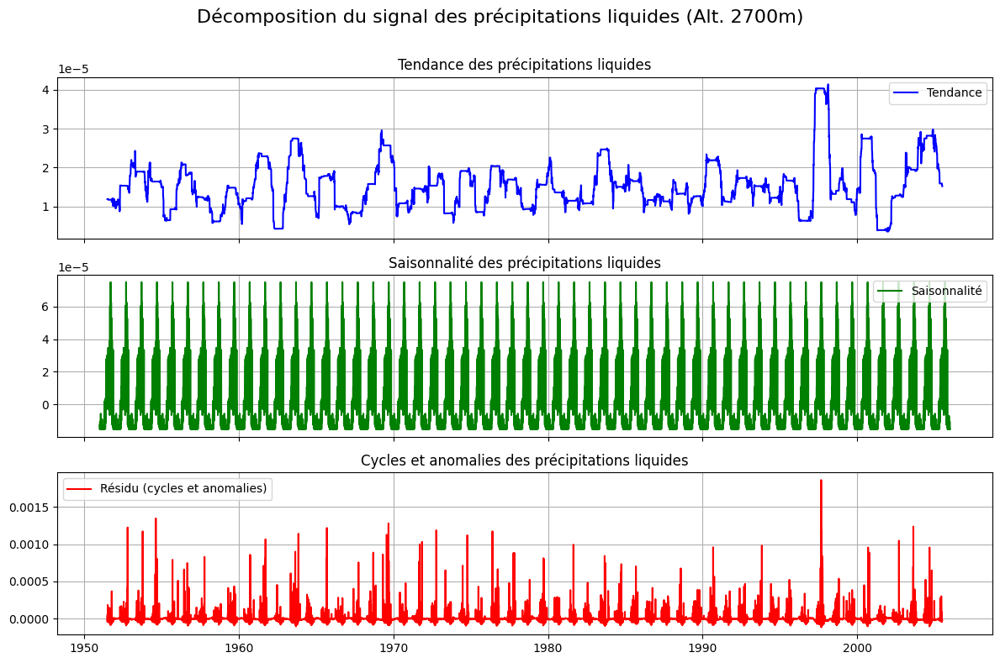




=== Analyse du capteur 10233000 ===



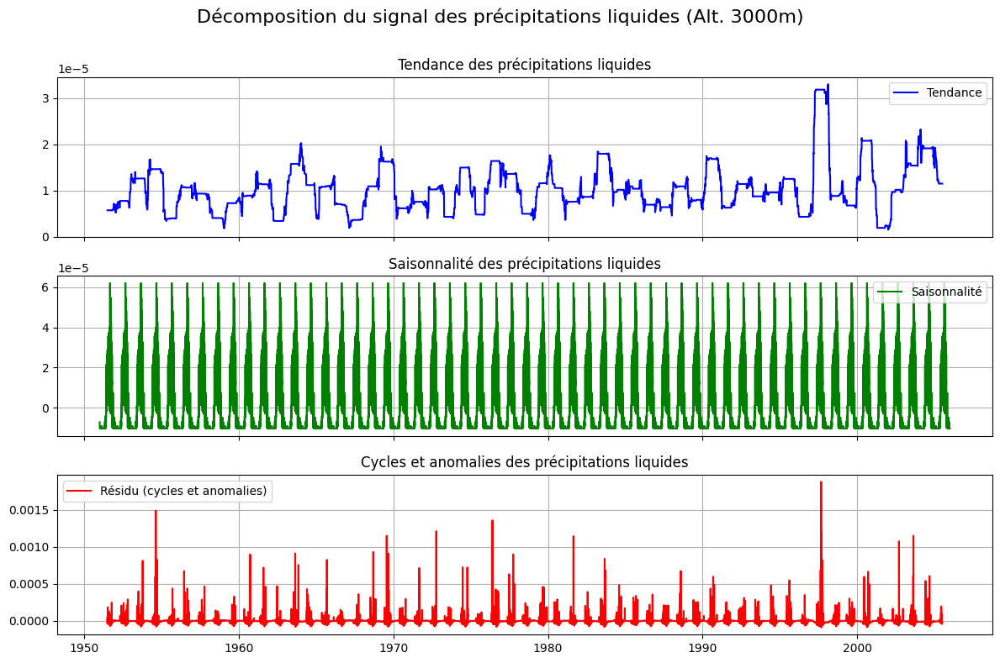




=== Analyse du capteur 10233300 ===



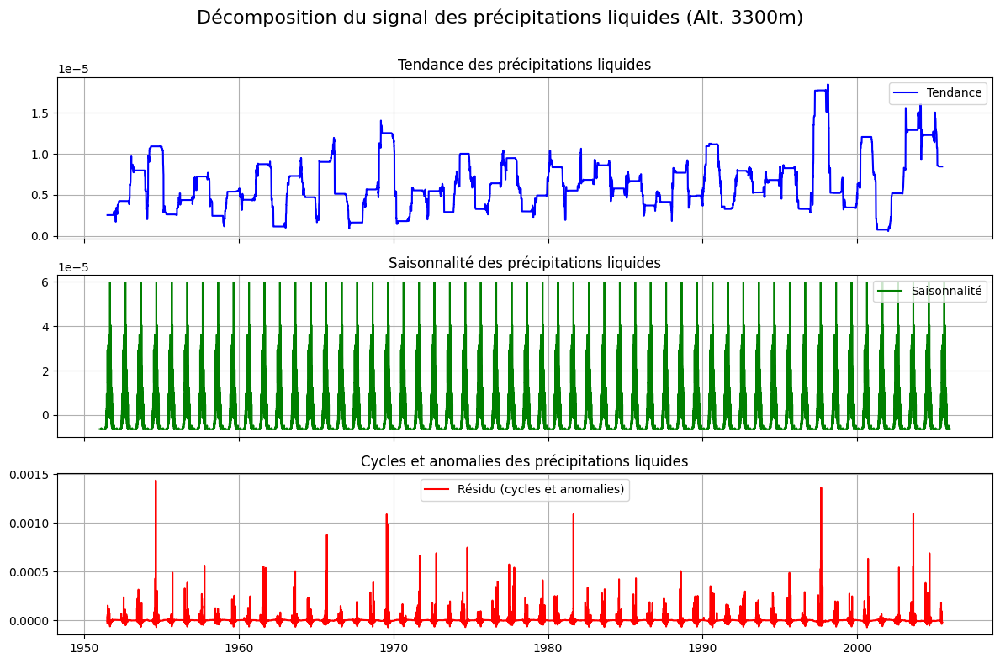

In [64]:
# Vérifier les capteurs uniques
capteurs = df["idPoint"].sort_values().unique()

# Appliquer l'analyse par capteur
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by=["Date"]).reset_index(drop=True)

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    serie = df_capteur.set_index("Date")["prtotAdjust"].resample("D").sum()
    decomposition = seasonal_decompose(serie, model='additive', period=365)

    fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)
    axes[0].plot(decomposition.trend, label="Tendance", color='blue')
    axes[0].set_title("Tendance des précipitations liquides")
    axes[0].legend()
    axes[0].grid()

    axes[1].plot(decomposition.seasonal, label="Saisonnalité", color='green')
    axes[1].set_title("Saisonnalité des précipitations liquides")
    axes[1].legend()
    axes[1].grid()

    axes[2].plot(decomposition.resid, label="Résidu (cycles et anomalies)", color='red')
    axes[2].set_title("Cycles et anomalies des précipitations liquides")
    axes[2].legend()
    axes[2].grid()

    fig.suptitle(f"Décomposition du signal des précipitations liquides (Alt. {int(str(capteur)[-4:])}m)\n", fontsize=16)
    plt.tight_layout()
    plt.show()

    print("\n" + "=" * 40 + "\n")

### Précipitation solides 


=== Analyse du capteur 10230300 ===



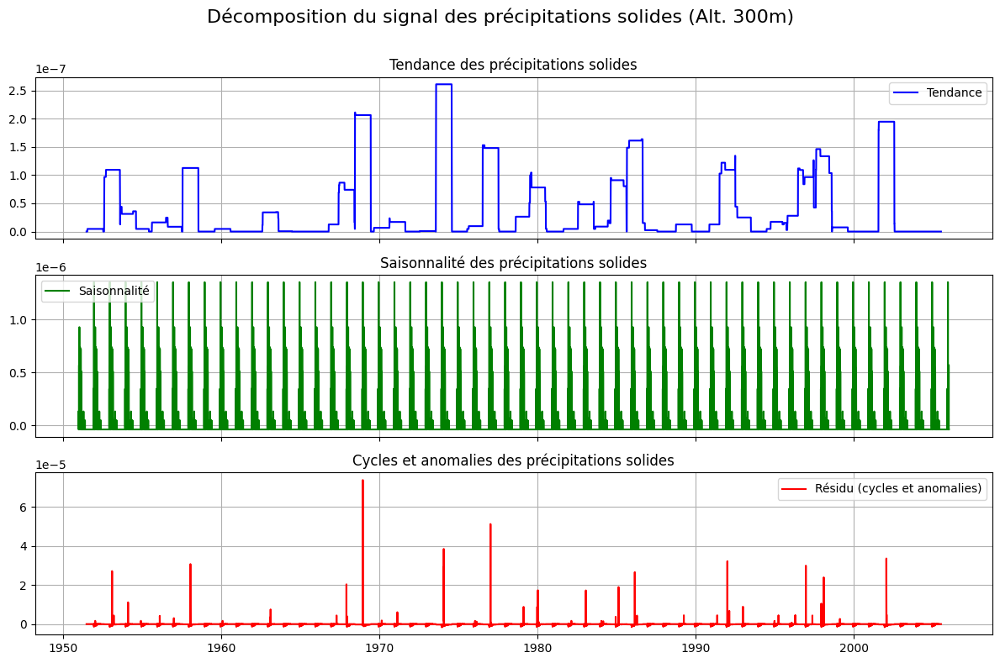




=== Analyse du capteur 10230600 ===



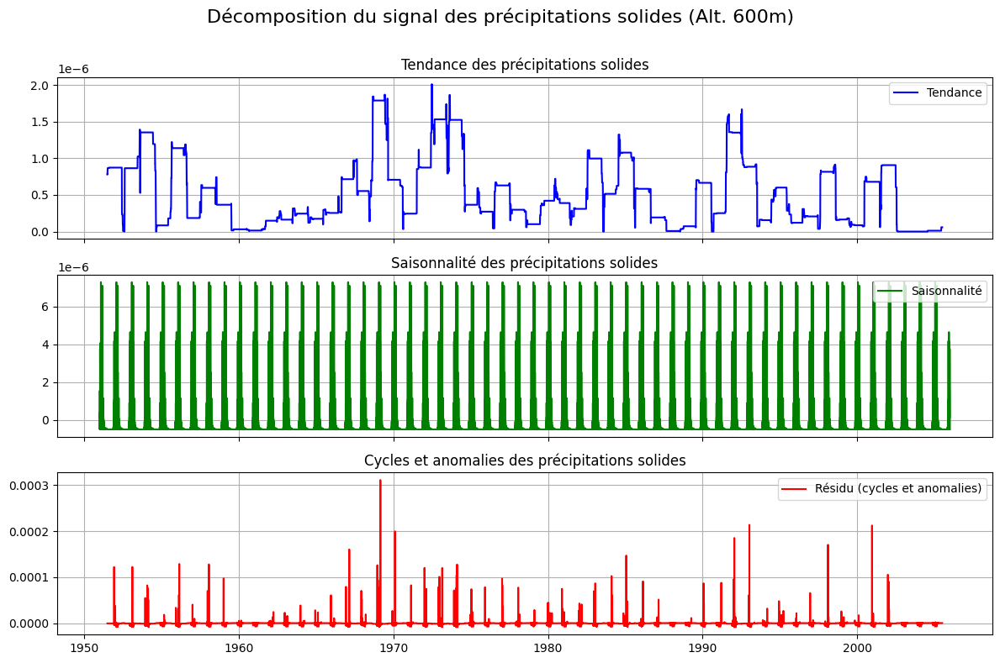




=== Analyse du capteur 10230900 ===



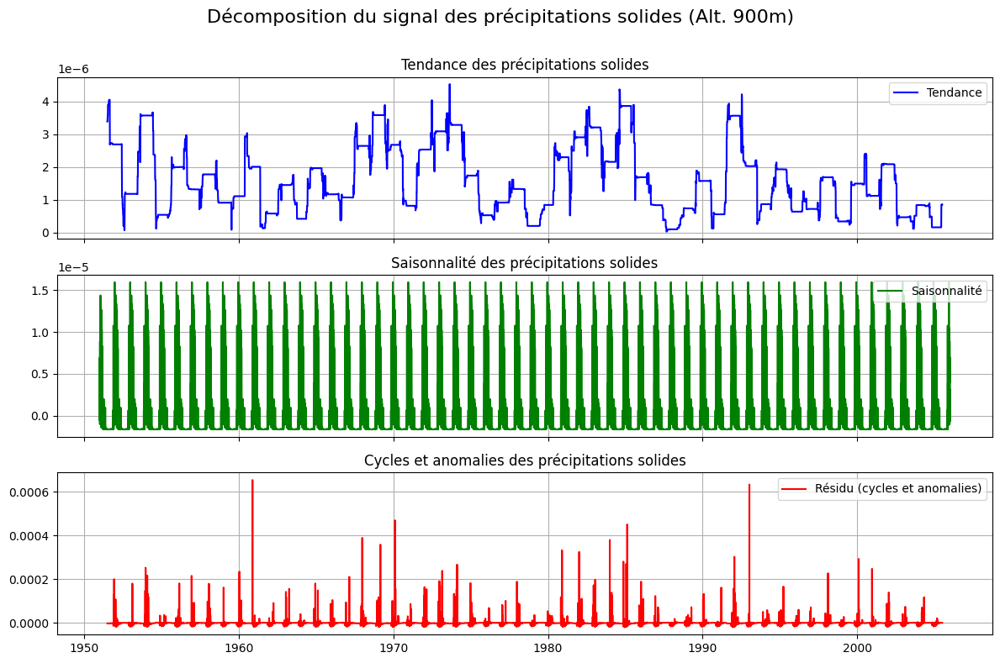




=== Analyse du capteur 10231200 ===



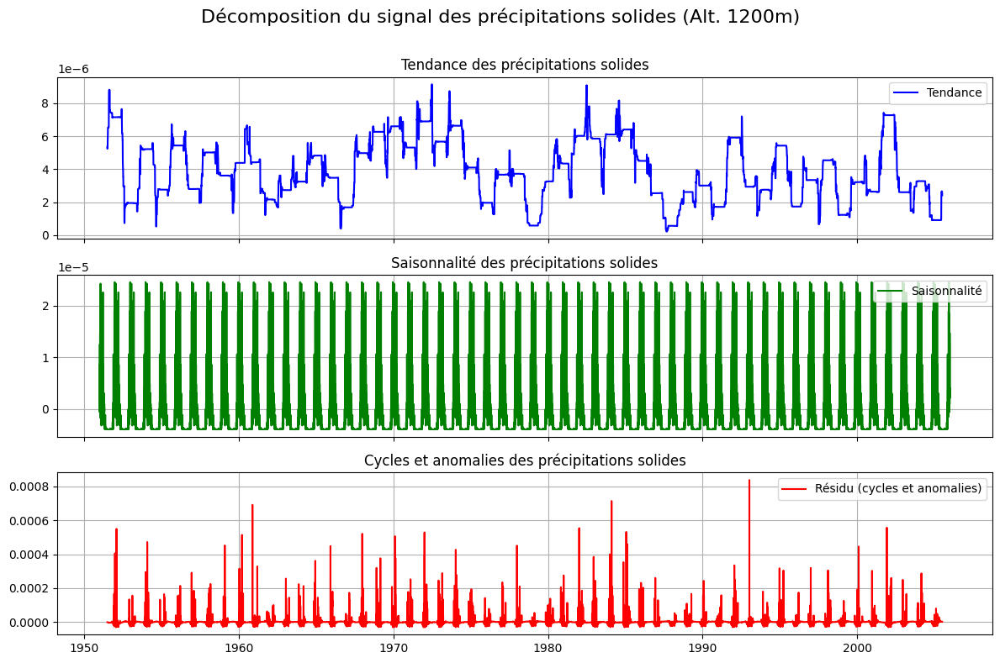




=== Analyse du capteur 10231500 ===



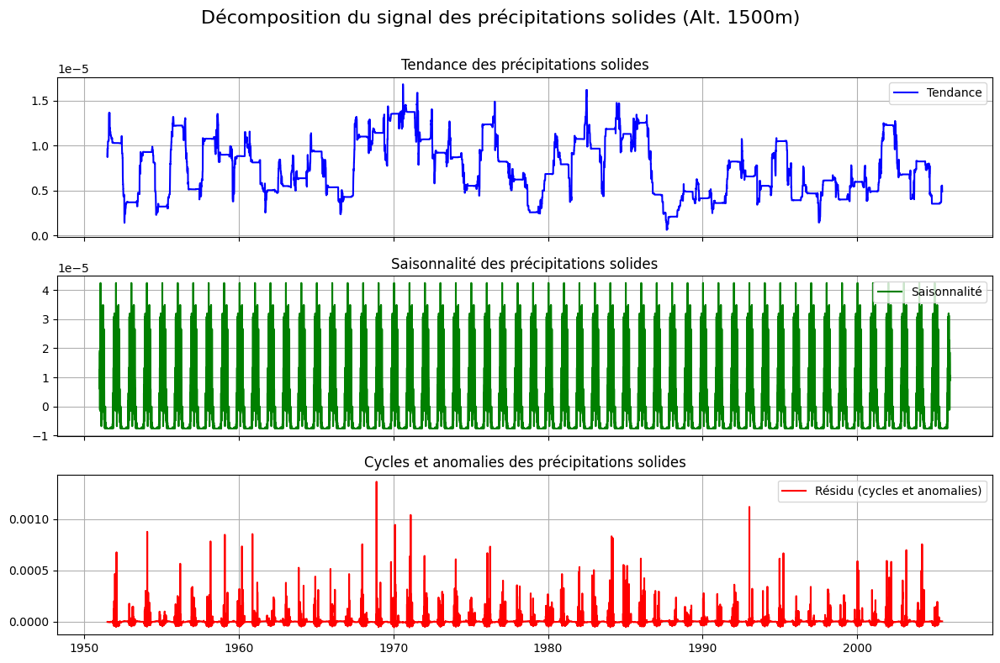




=== Analyse du capteur 10231800 ===



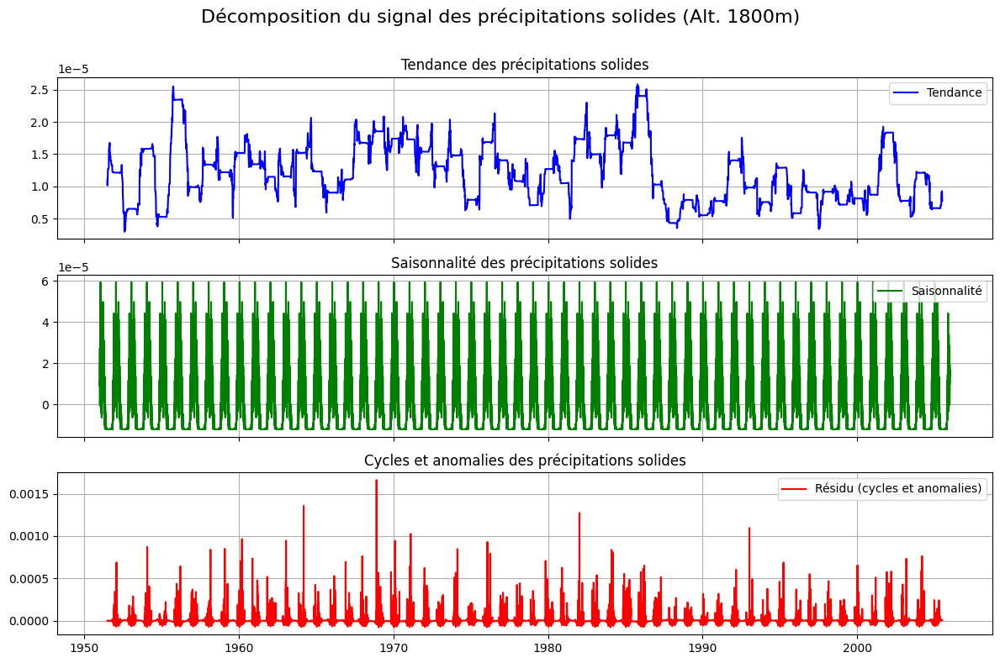




=== Analyse du capteur 10232100 ===



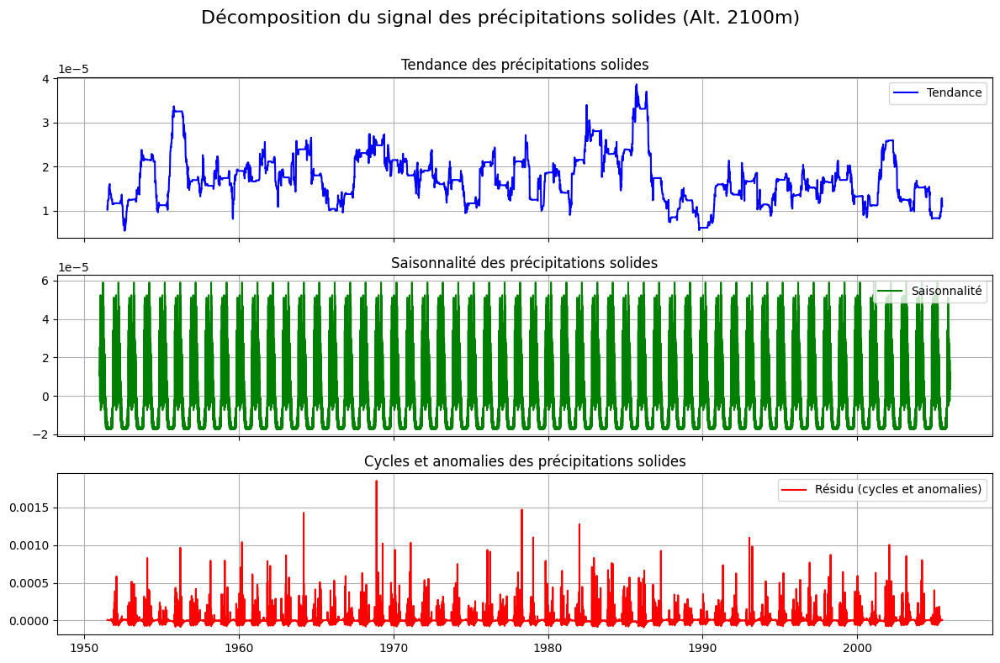




=== Analyse du capteur 10232400 ===



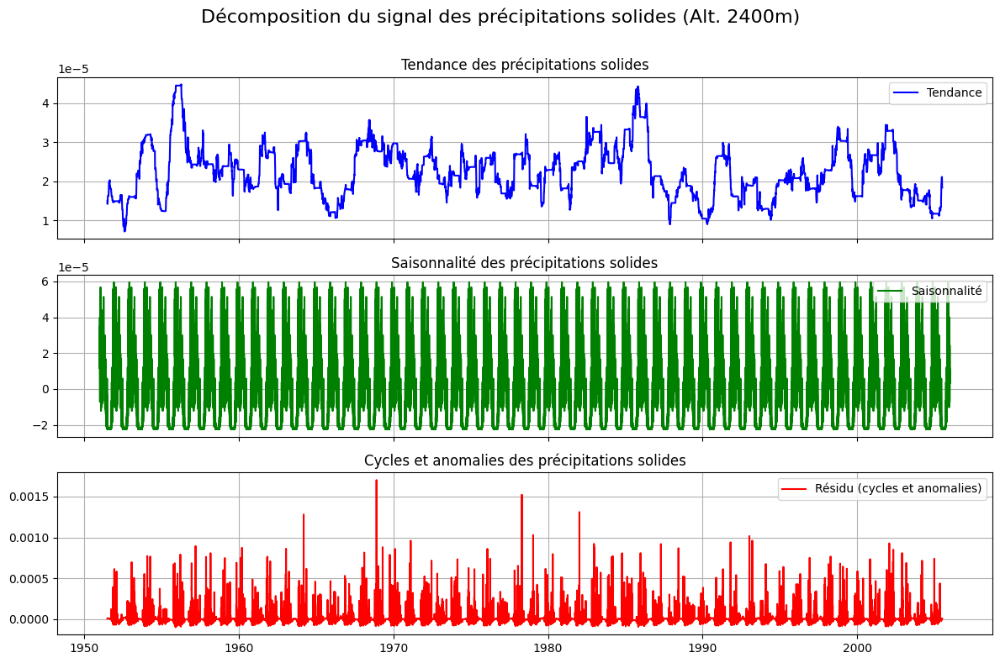




=== Analyse du capteur 10232700 ===



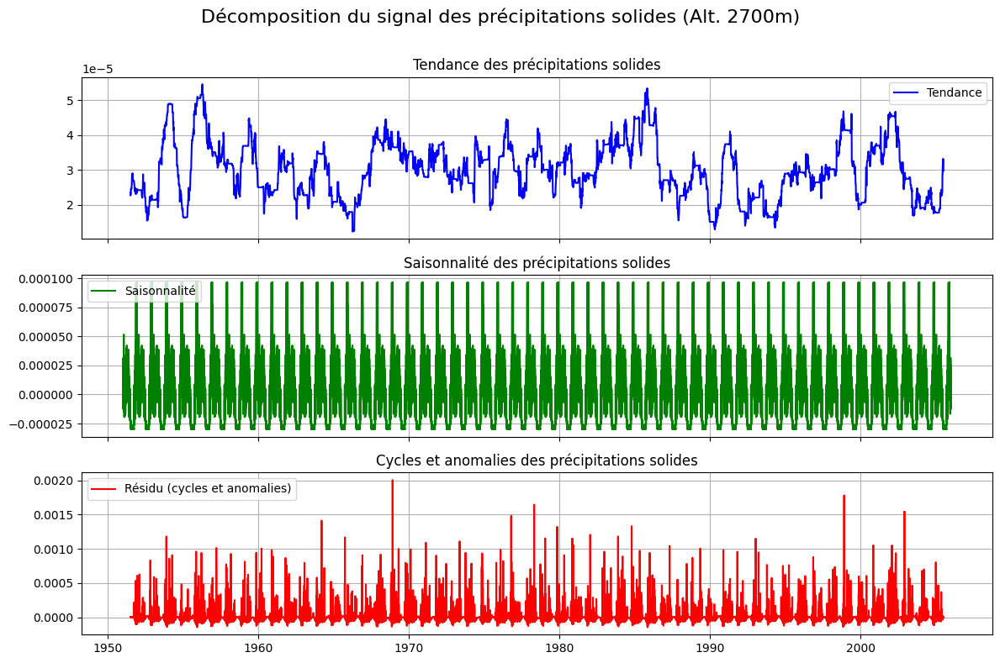




=== Analyse du capteur 10233000 ===



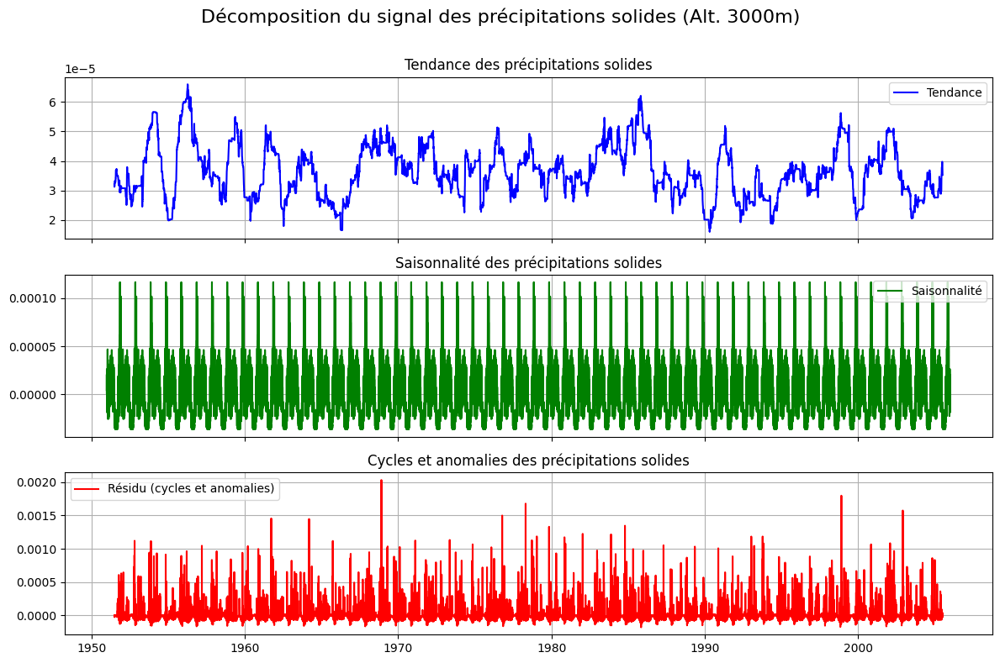




=== Analyse du capteur 10233300 ===



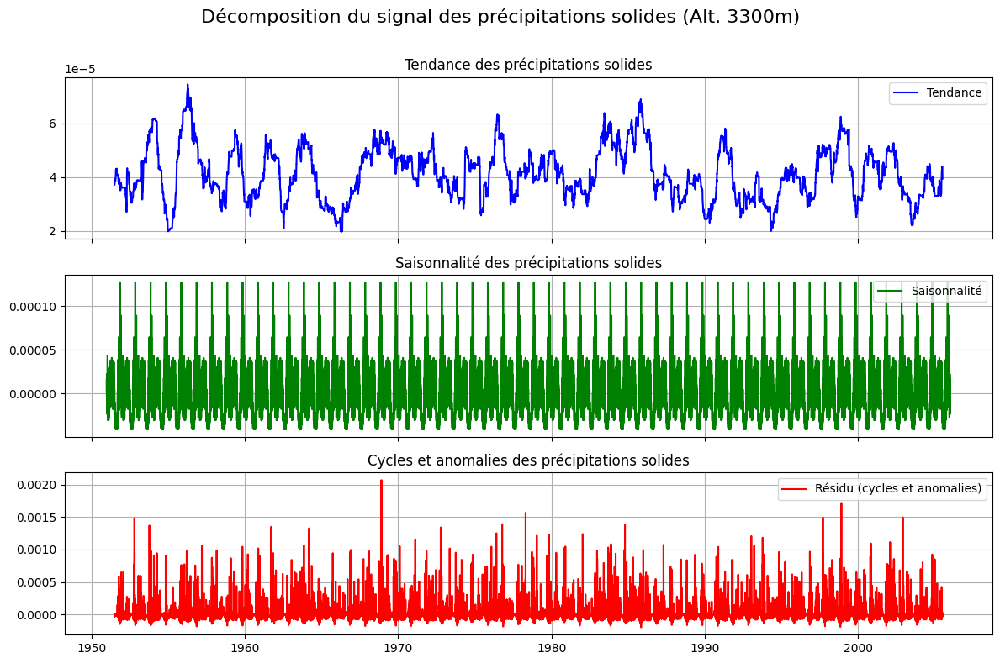

In [65]:
# Vérifier les capteurs uniques
capteurs = df["idPoint"].sort_values().unique()

# Appliquer l'analyse par capteur
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by=["Date"]).reset_index(drop=True)

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    serie = df_capteur.set_index("Date")["prsnAdjust"].resample("D").sum()
    decomposition = seasonal_decompose(serie, model='additive', period=365)

    fig, axes = plt.subplots(3, 1, figsize=(12, 8), sharex=True)
    axes[0].plot(decomposition.trend, label="Tendance", color='blue')
    axes[0].set_title("Tendance des précipitations solides")
    axes[0].legend()
    axes[0].grid()

    axes[1].plot(decomposition.seasonal, label="Saisonnalité", color='green')
    axes[1].set_title("Saisonnalité des précipitations solides")
    axes[1].legend()
    axes[1].grid()

    axes[2].plot(decomposition.resid, label="Résidu (cycles et anomalies)", color='red')
    axes[2].set_title("Cycles et anomalies des précipitations solides")
    axes[2].legend()
    axes[2].grid()

    fig.suptitle(f"Décomposition du signal des précipitations solides (Alt. {int(str(capteur)[-4:])}m)\n", fontsize=16)
    plt.tight_layout()
    plt.show()

    print("\n" + "=" * 40 + "\n")

## Evolution de la pluviométrie sur une année au cours des années

In [66]:
df = df_bis

### Pluviométrie liquide


=== Analyse du capteur 10230300 ===



C:\Users\alexv\AppData\Local\Temp\ipykernel_29180\2846106477.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("coolwarm")  # Choix d'une colormap adaptée


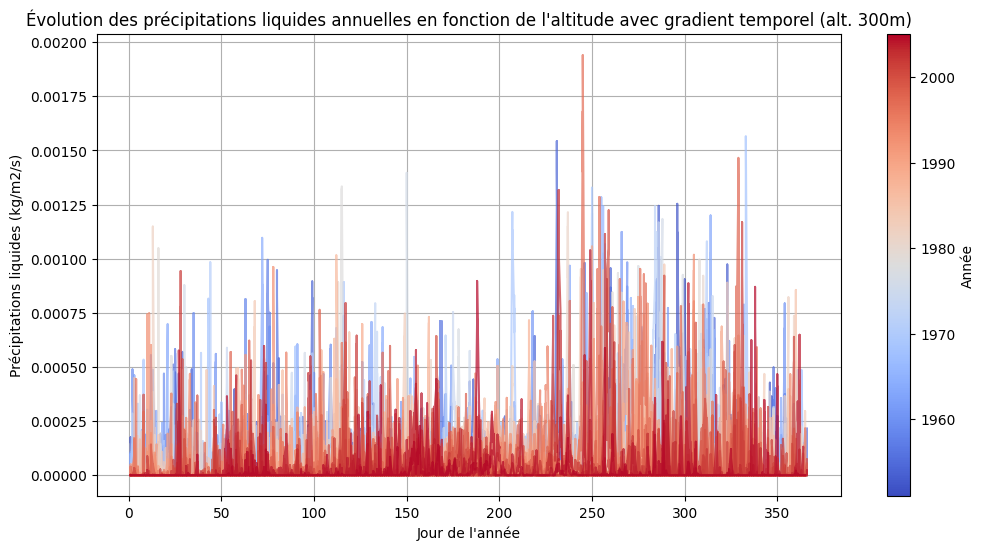




=== Analyse du capteur 10230600 ===



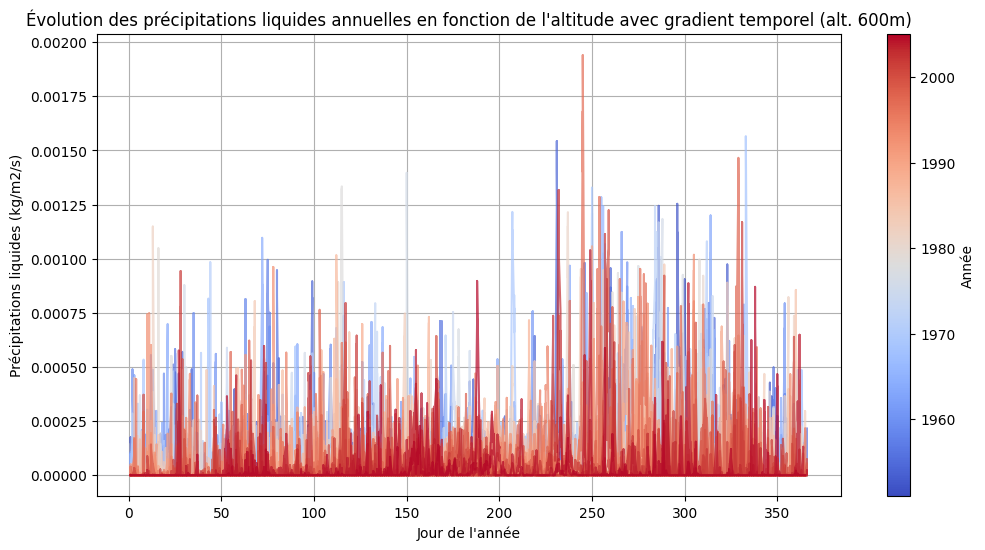




=== Analyse du capteur 10230900 ===



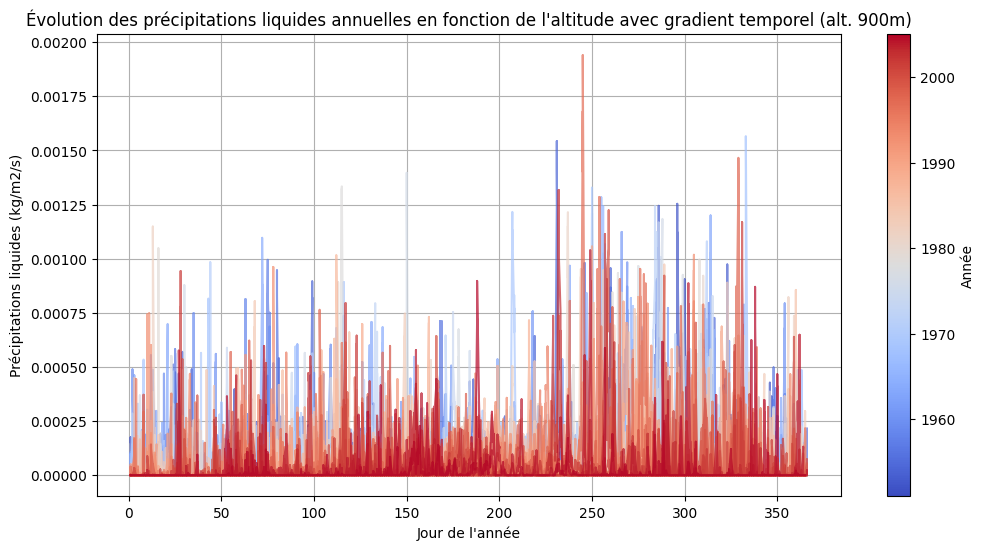




=== Analyse du capteur 10231200 ===



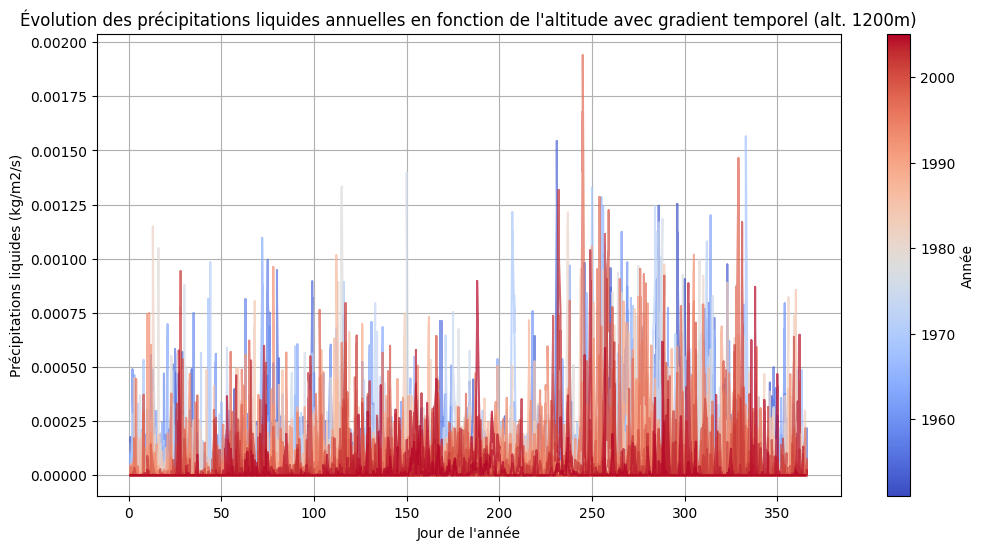




=== Analyse du capteur 10231500 ===



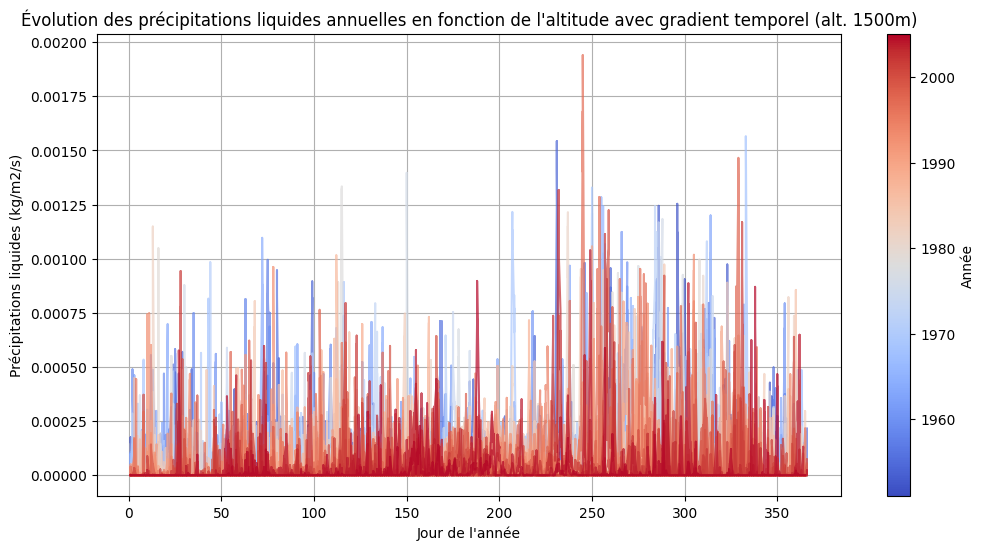




=== Analyse du capteur 10231800 ===



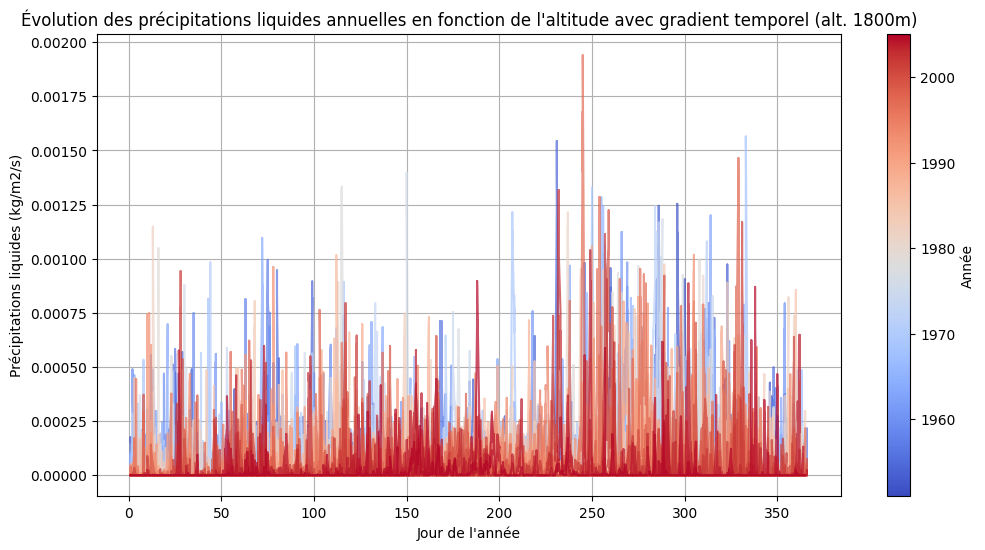




=== Analyse du capteur 10232100 ===



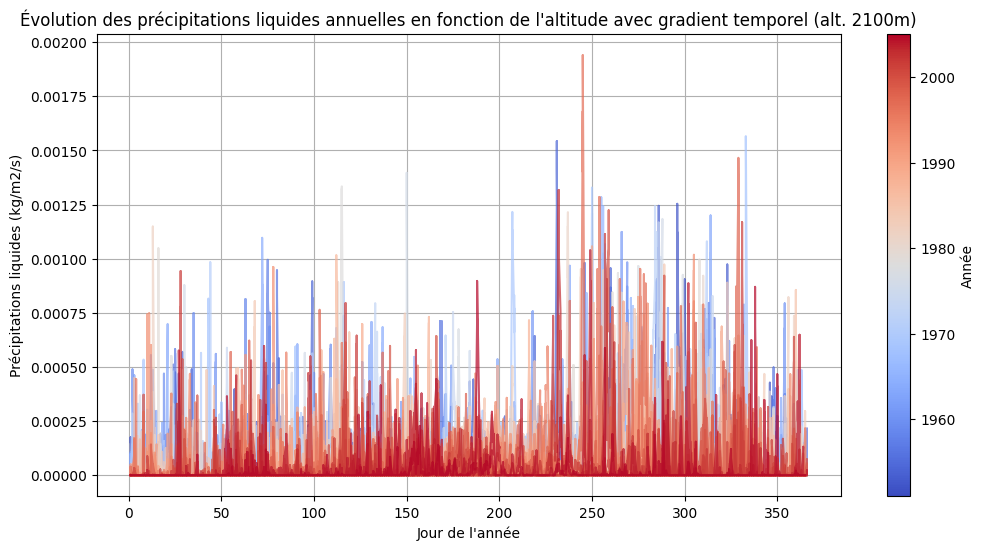




=== Analyse du capteur 10232400 ===



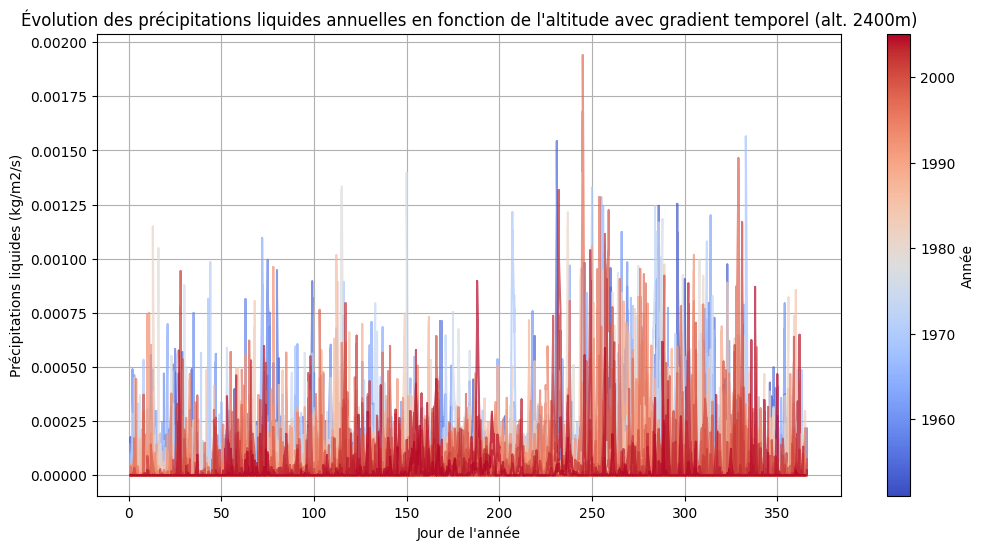




=== Analyse du capteur 10232700 ===



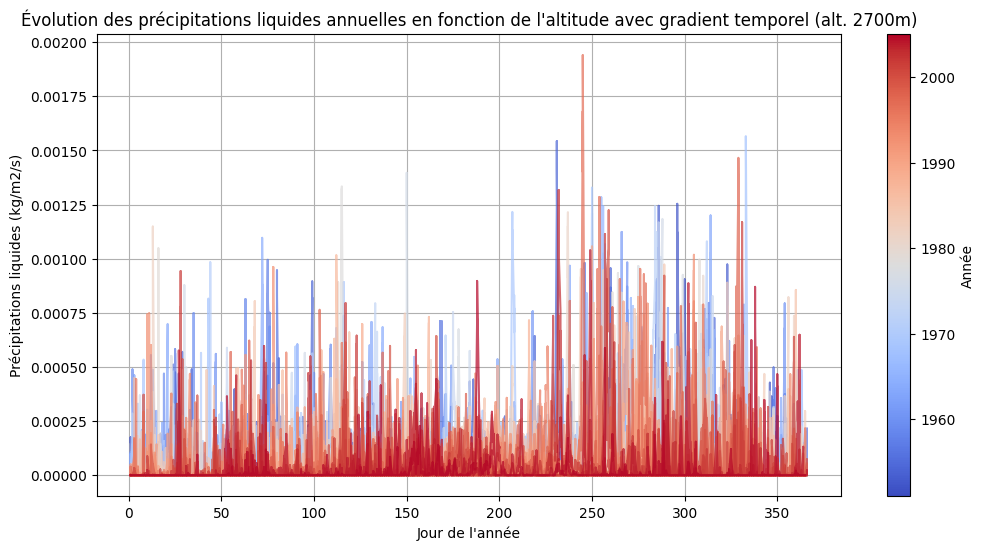




=== Analyse du capteur 10233000 ===



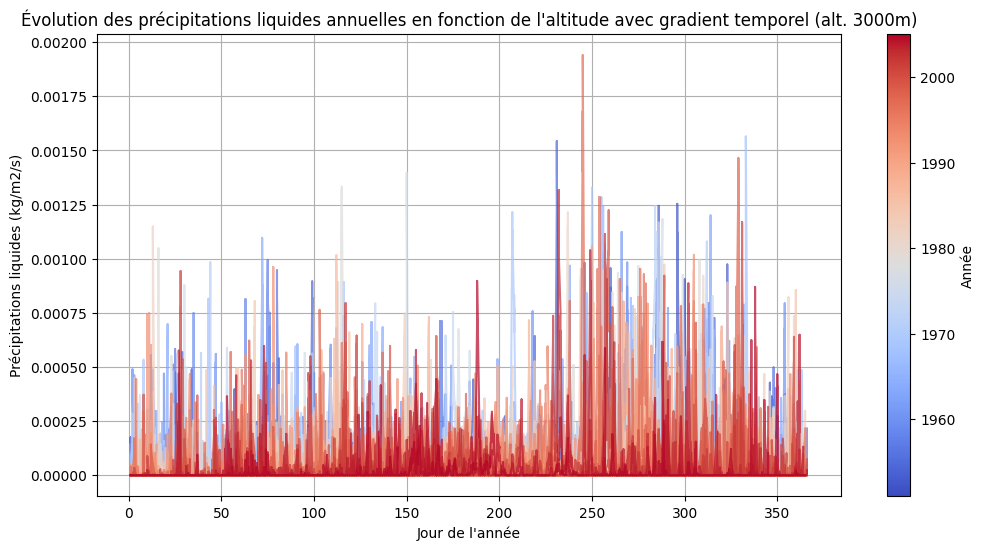




=== Analyse du capteur 10233300 ===



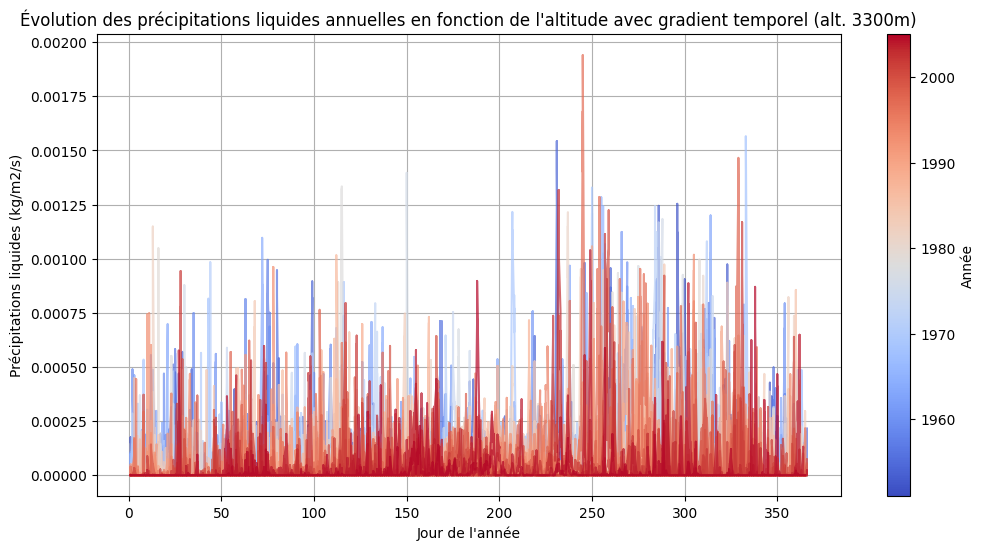

In [67]:
# Vérifier les capteurs uniques
capteurs = df["idPoint"].sort_values().unique()

# Appliquer l'analyse par capteur
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by=["Date"]).reset_index(drop=True)

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    # Extraction de l'année et du jour de l'année
    df["Year"] = df["Date"].dt.year
    df["DayOfYear"] = df["Date"].dt.dayofyear

    # Définition du colormap pour le gradient
    norm = mcolors.Normalize(vmin=df["Year"].min(), vmax=df["Year"].max())
    cmap = cm.get_cmap("coolwarm")  # Choix d'une colormap adaptée
    colors = [cmap(norm(year)) for year in sorted(df["Year"].unique())]

    # Création de la figure et des axes
    fig, ax = plt.subplots(figsize=(12, 6))
    for i, year in enumerate(sorted(df["Year"].unique())):
        yearly_data = df[df["Year"] == year]
        ax.plot(yearly_data["DayOfYear"], yearly_data["prtotAdjust"], color=colors[i], alpha=0.7, label=year if i % 10 == 0 else "")

    ax.set_xlabel("Jour de l'année")
    ax.set_ylabel("Précipitations liquides (kg/m2/s)")
    ax.set_title(f"Évolution des précipitations liquides annuelles en fonction de l'altitude avec gradient temporel (alt. {altitude}m)")

    # Ajout de la barre de couleur
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label("Année")

    ax.grid()
    plt.show()

    print("\n" + "=" * 40 + "\n")

### Pluviométrie solide


=== Analyse du capteur 10230300 ===



C:\Users\alexv\AppData\Local\Temp\ipykernel_29180\380803883.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("coolwarm")  # Choix d'une colormap adaptée


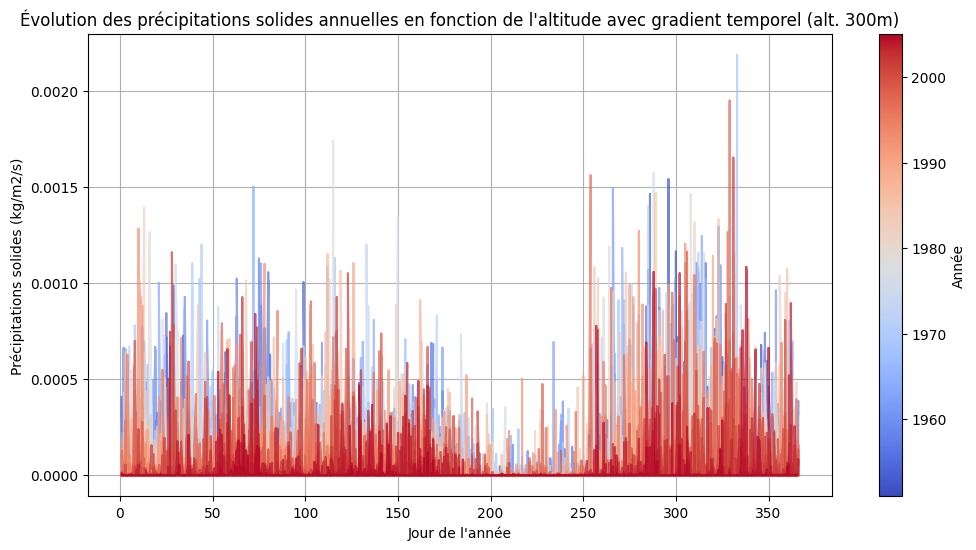




=== Analyse du capteur 10230600 ===



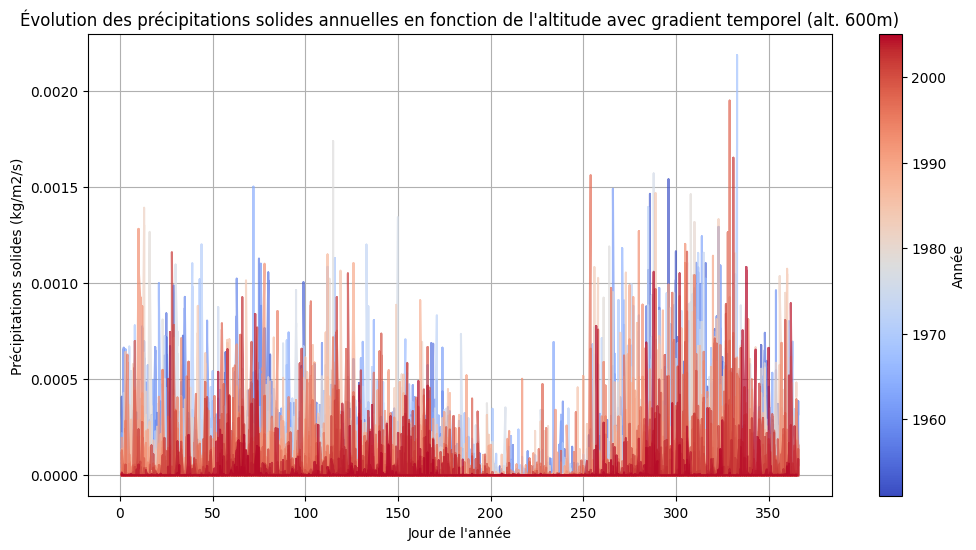




=== Analyse du capteur 10230900 ===



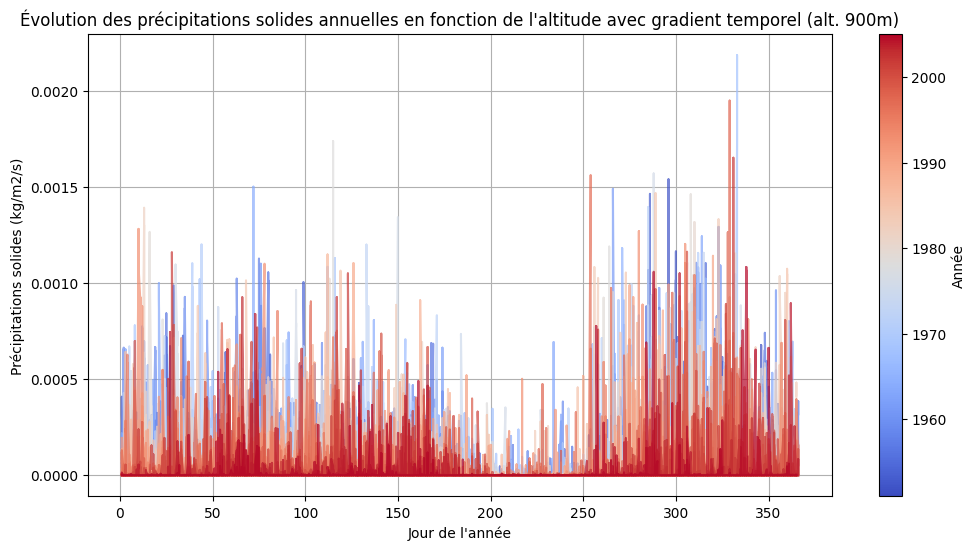




=== Analyse du capteur 10231200 ===



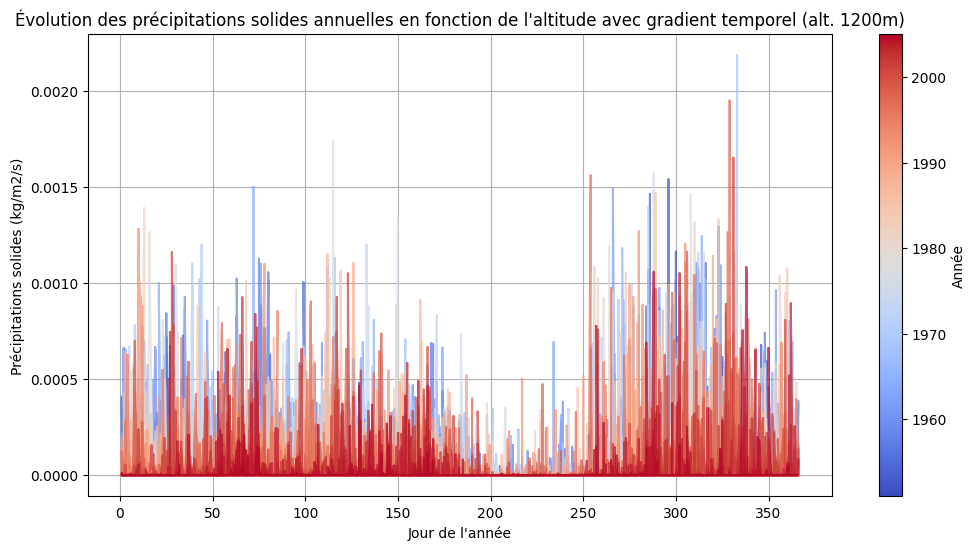




=== Analyse du capteur 10231500 ===



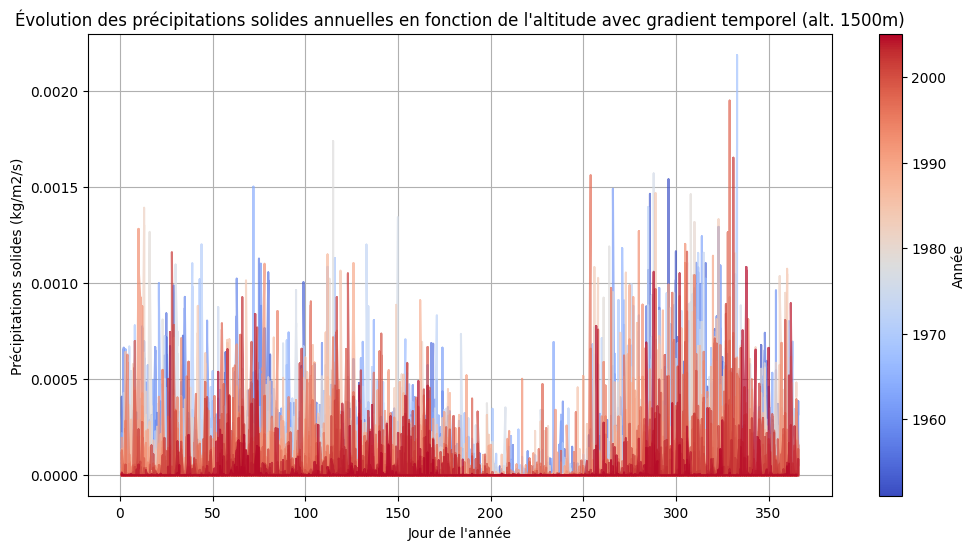




=== Analyse du capteur 10231800 ===



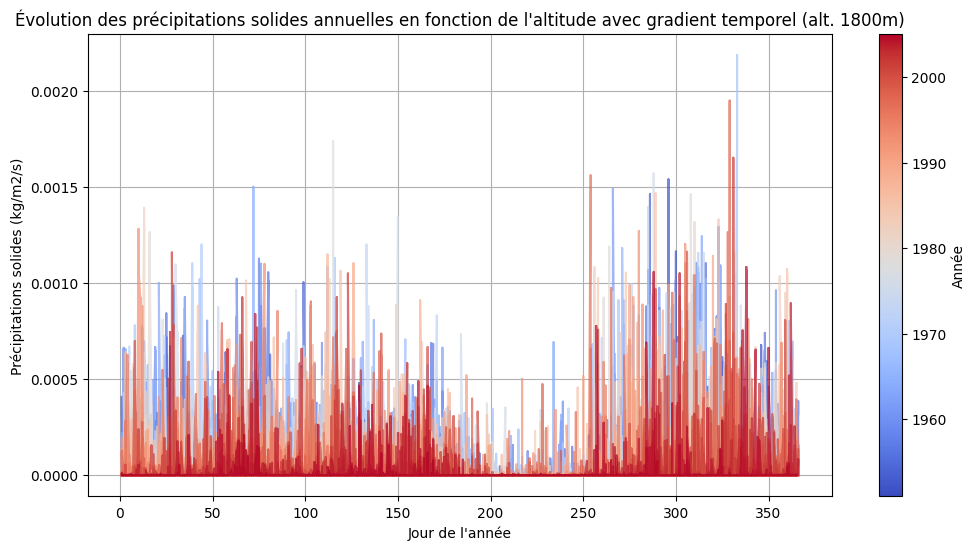




=== Analyse du capteur 10232100 ===



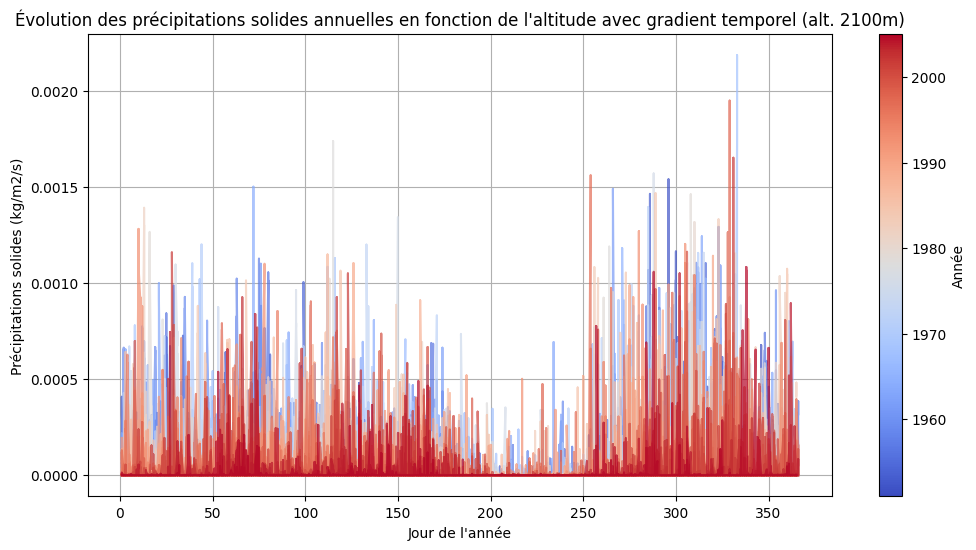




=== Analyse du capteur 10232400 ===



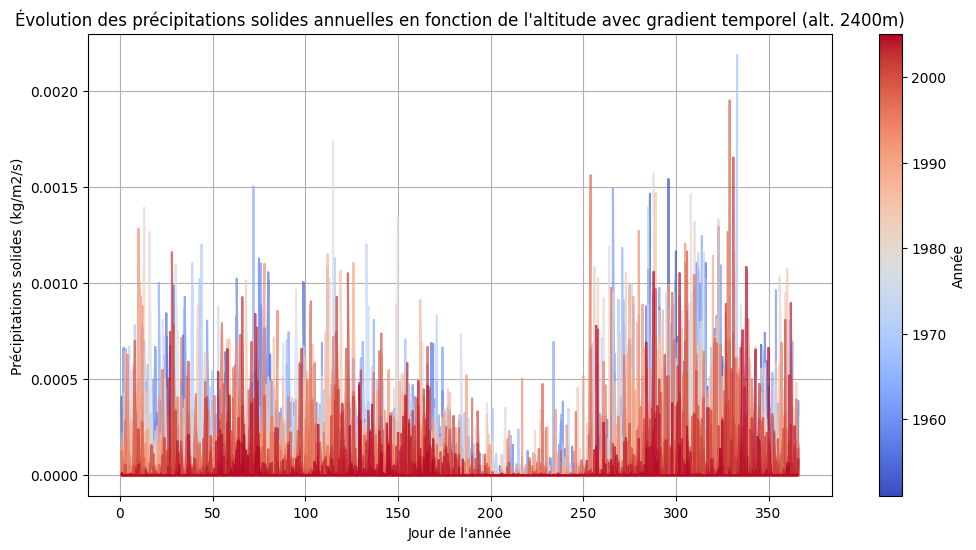




=== Analyse du capteur 10232700 ===



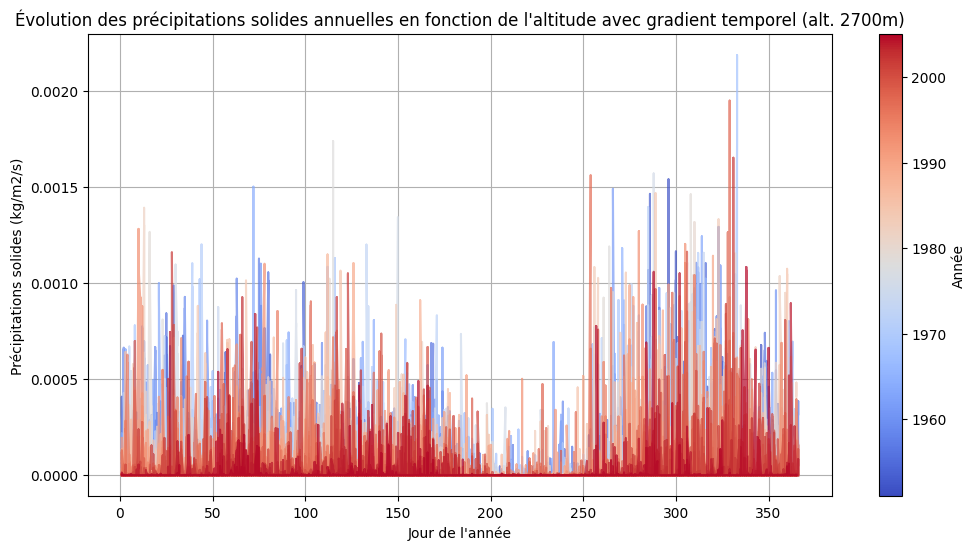




=== Analyse du capteur 10233000 ===



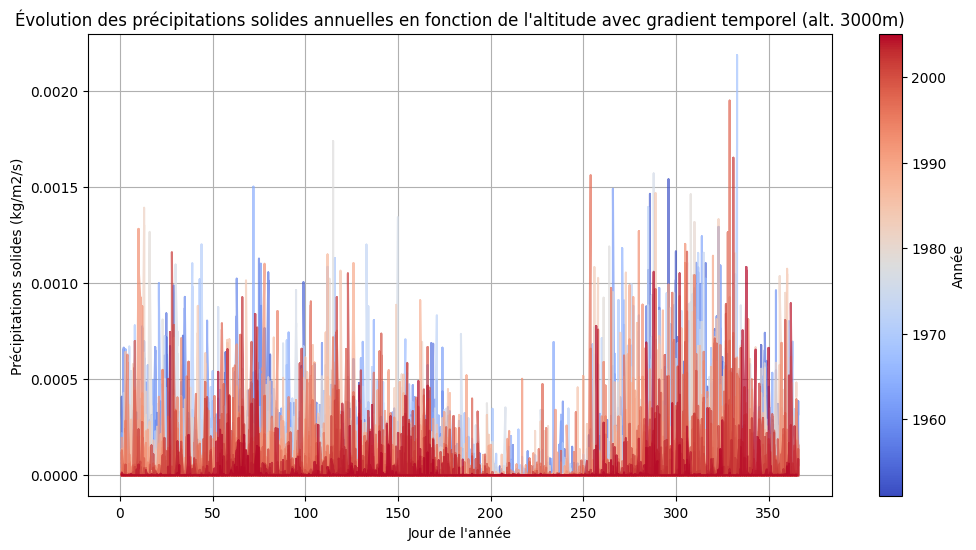




=== Analyse du capteur 10233300 ===



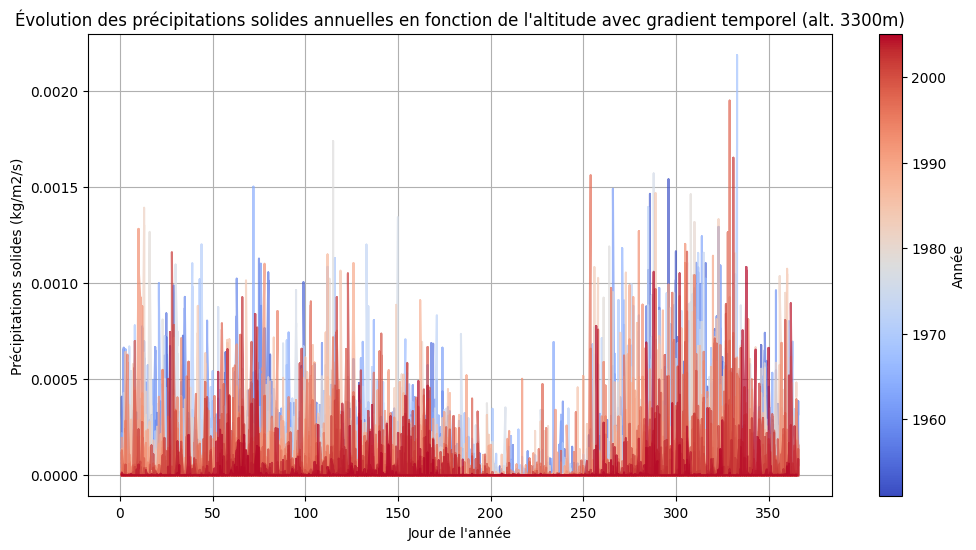

In [68]:
# Vérifier les capteurs uniques
capteurs = df["idPoint"].sort_values().unique()

# Appliquer l'analyse par capteur
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur
    df_capteur = df[df["idPoint"] == capteur].sort_values(by=["Date"]).reset_index(drop=True)

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue
    
    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    # Extraction de l'année et du jour de l'année
    df["Year"] = df["Date"].dt.year
    df["DayOfYear"] = df["Date"].dt.dayofyear

    # Définition du colormap pour le gradient
    norm = mcolors.Normalize(vmin=df["Year"].min(), vmax=df["Year"].max())
    cmap = cm.get_cmap("coolwarm")  # Choix d'une colormap adaptée
    colors = [cmap(norm(year)) for year in sorted(df["Year"].unique())]

    # Création de la figure et des axes
    fig, ax = plt.subplots(figsize=(12, 6))
    for i, year in enumerate(sorted(df["Year"].unique())):
        yearly_data = df[df["Year"] == year]
        ax.plot(yearly_data["DayOfYear"], yearly_data["prsnAdjust"], color=colors[i], alpha=0.7, label=year if i % 10 == 0 else "")

    ax.set_xlabel("Jour de l'année")
    ax.set_ylabel("Précipitations solides (kg/m2/s)")
    ax.set_title(f"Évolution des précipitations solides annuelles en fonction de l'altitude avec gradient temporel (alt. {altitude}m)")

    # Ajout de la barre de couleur
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label("Année")

    ax.grid()
    plt.show()

    print("\n" + "=" * 40 + "\n")

### Boîtes à moustache : afficher la pluviométrie cumulée annuelle moyenne sur 10 ans 


=== Analyse du capteur 10230300 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


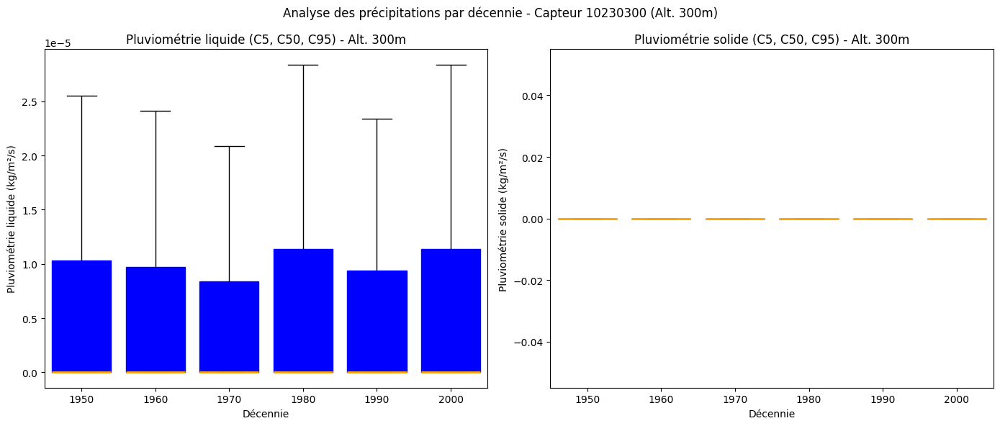




=== Analyse du capteur 10230600 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


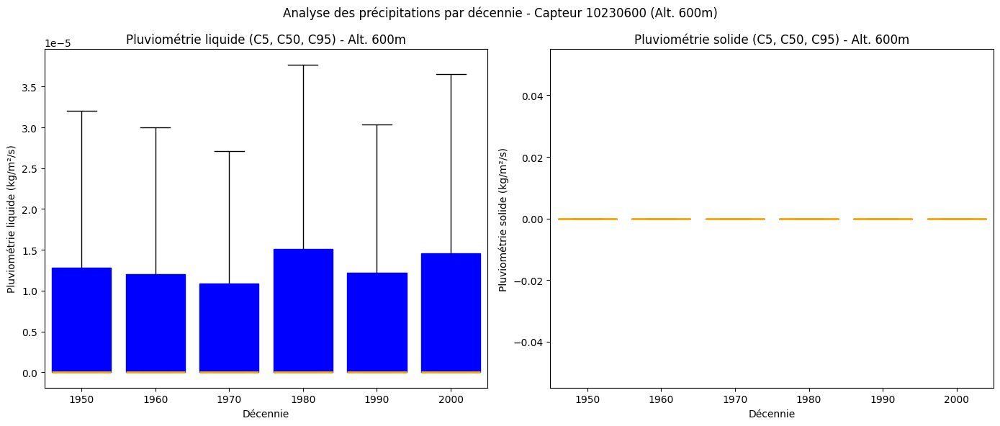




=== Analyse du capteur 10230900 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


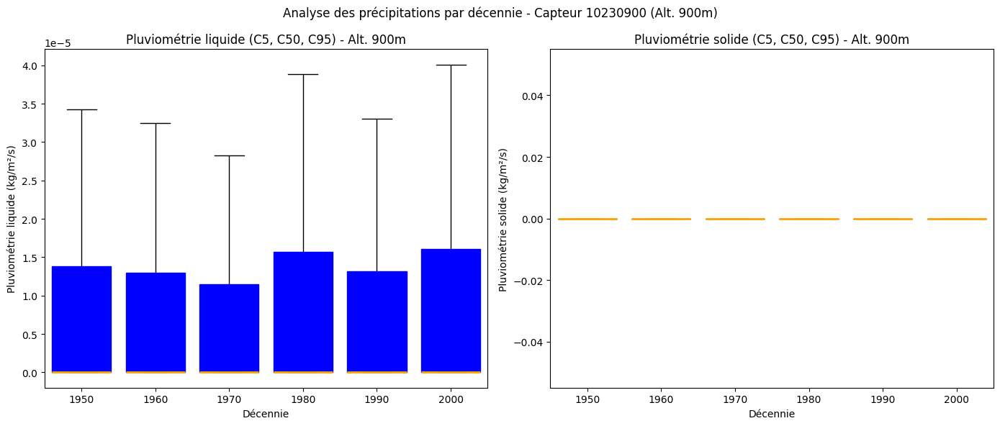

C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)





=== Analyse du capteur 10231200 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


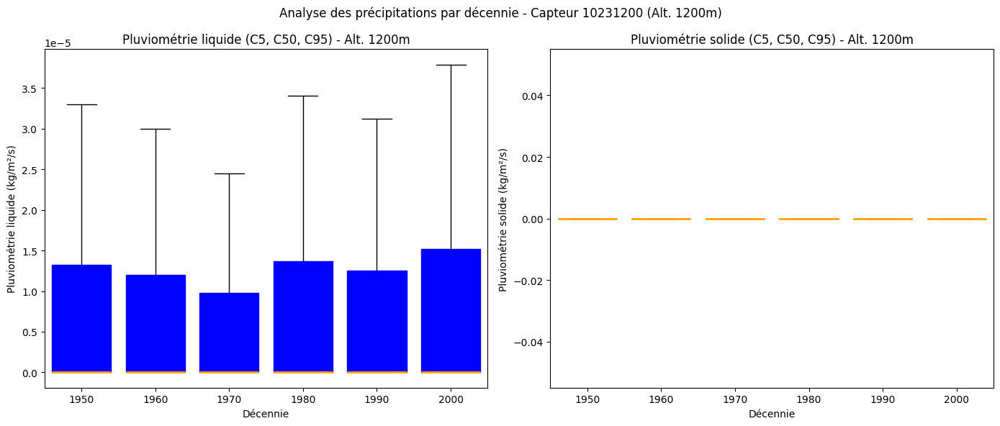




=== Analyse du capteur 10231500 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


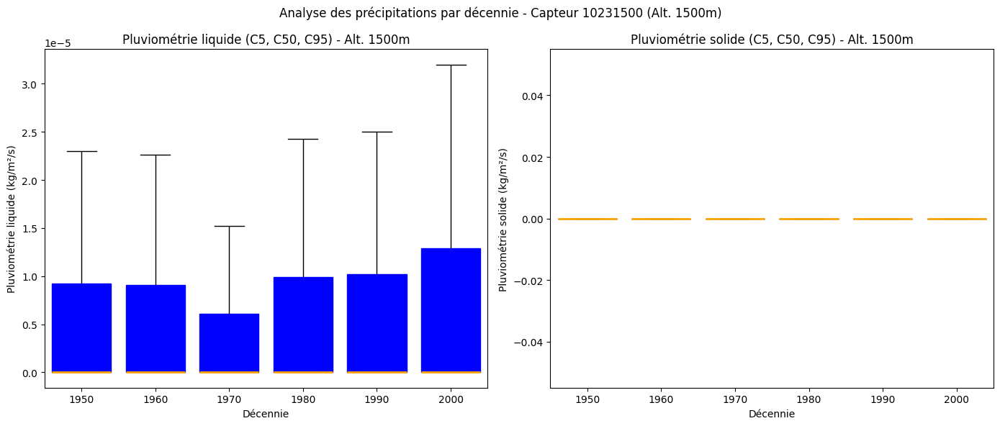




=== Analyse du capteur 10231800 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


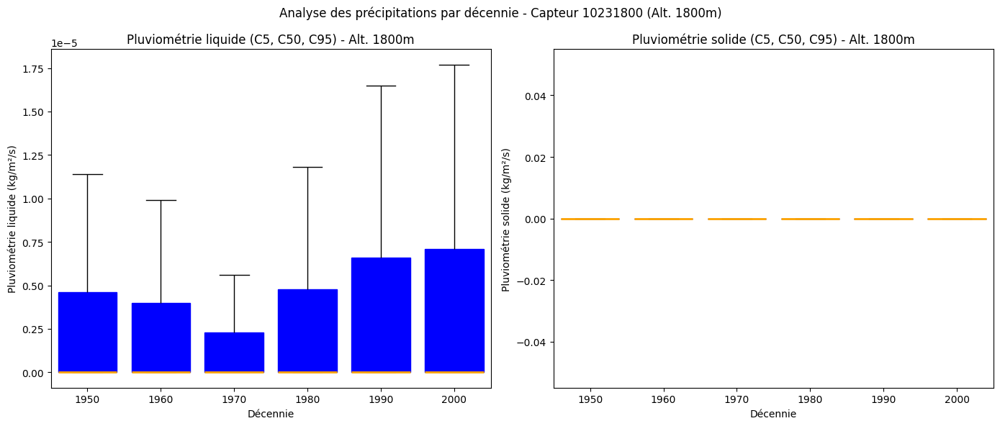




=== Analyse du capteur 10232100 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


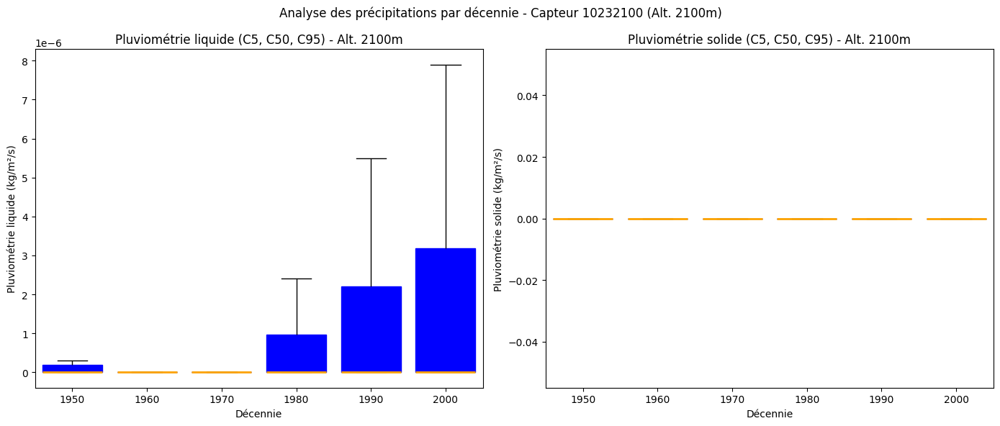




=== Analyse du capteur 10232400 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


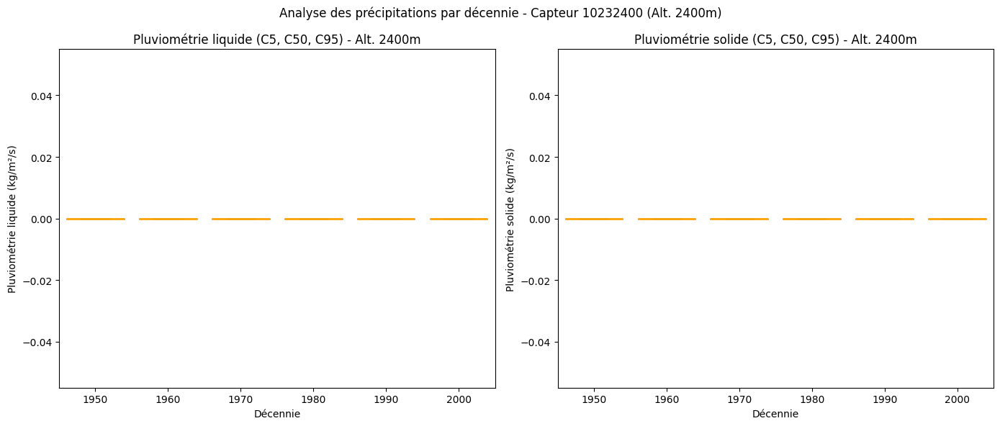




=== Analyse du capteur 10232700 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


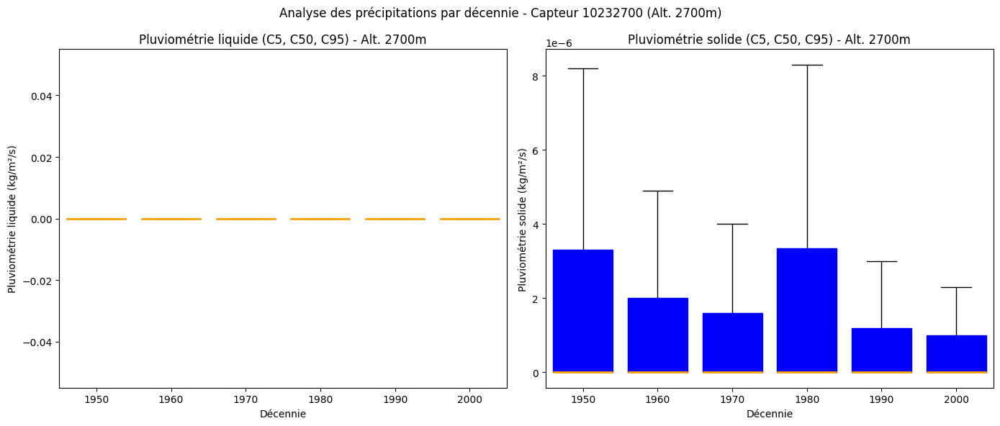




=== Analyse du capteur 10233000 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


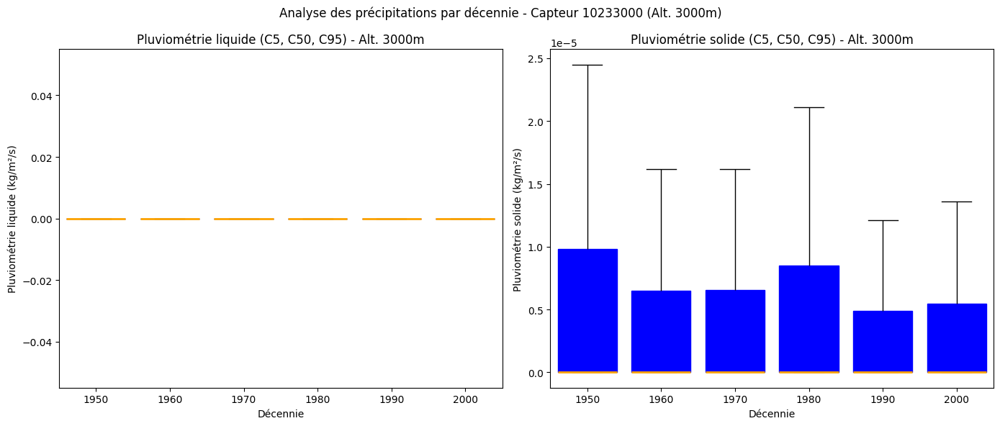




=== Analyse du capteur 10233300 ===



C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)
C:\Users\alexv\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\categorical.py:700: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  artists = ax.bxp(**boxplot_kws)


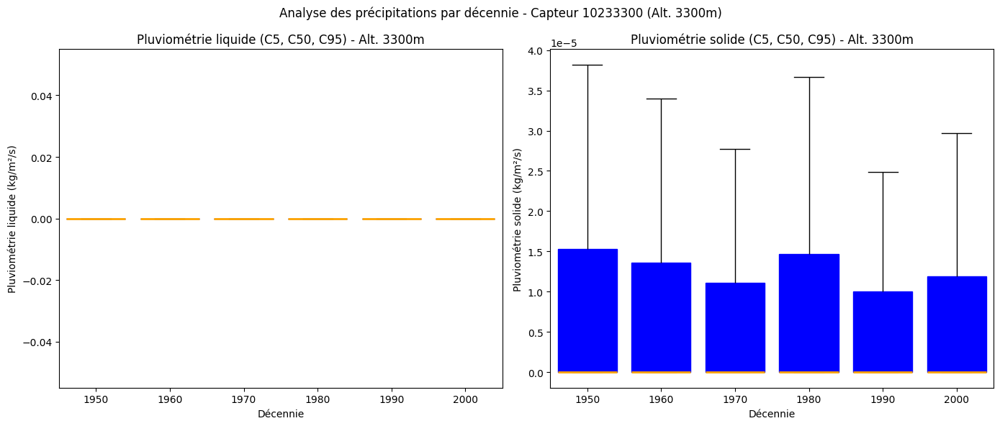

In [ ]:
# Appliquer l'analyse par capteur
for capteur in capteurs:
    print(f"\n=== Analyse du capteur {capteur} ===\n")

    # Filtrer les données pour ce capteur et trier par Date
    df_capteur = df[df["idPoint"] == capteur].sort_values(by=["Date"]).reset_index(drop=True)

    # Vérifier qu'il y a des données pour ce capteur
    if df_capteur.empty:
        print(f"Aucune donnée disponible pour le capteur {capteur}")
        continue

    # Extraire l'altitude du capteur (les 4 derniers chiffres de l'ID)
    altitude = int(str(capteur)[-4:])

    # Ajouter une colonne "Décennie" en arrondissant l'année à la dizaine inférieure
    df_capteur["Décennie"] = (df_capteur["Date"].dt.year // 10) * 10

    # Vérifier qu'il y a au moins une décennie représentée
    if df_capteur["Décennie"].nunique() < 1:
        print(f"Aucune donnée valable par décennie pour le capteur {capteur}")
        continue

    # Création de la figure avec 2 boxplots (liquide et solide) avec des échelles dissociées
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Définition de la palette de couleurs (C50 en orange)
    box_colors = {"whisker": "black", "caps": "black", "box": "blue", "median": "orange"}

    # Graphique pour la pluviométrie liquide
    sns.boxplot(
        data=df_capteur, x="Décennie", y="prtotAdjust", ax=axes[0], showfliers=False,
        boxprops=dict(color=box_colors["box"]),
        whiskerprops=dict(color=box_colors["whisker"]),
        capprops=dict(color=box_colors["caps"]),
        medianprops=dict(color=box_colors["median"], linewidth=2)
    )
    axes[0].set_title(f"Pluviométrie liquide (C5, C50, C95) - Alt. {altitude}m")
    axes[0].set_xlabel("Décennie")
    axes[0].set_ylabel("Pluviométrie liquide (kg/m²/s)")

    # Graphique pour la pluviométrie solide
    sns.boxplot(
        data=df_capteur, x="Décennie", y="prsnAdjust", ax=axes[1], showfliers=False,
        boxprops=dict(color=box_colors["box"]),
        whiskerprops=dict(color=box_colors["whisker"]),
        capprops=dict(color=box_colors["caps"]),
        medianprops=dict(color=box_colors["median"], linewidth=2)
    )
    axes[1].set_title(f"Pluviométrie solide (C5, C50, C95) - Alt. {altitude}m")
    axes[1].set_xlabel("Décennie")
    axes[1].set_ylabel("Pluviométrie solide (kg/m²/s)")

    # Ajouter un titre global à la figure
    fig.suptitle(f"Analyse des précipitations par décennie - Capteur {capteur} (Alt. {altitude}m)")

    # Ajustement de la mise en page
    plt.tight_layout()
    plt.show()

    print("\n" + "=" * 110 + "\n")
